# Enhancing Customers Experience and Loyalty Measurement through Sentiment Analysis and NPS: Evidence from the Luxury Hotel Industry

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
pip install nltk

In [ ]:
# Text Polarity
from textblob import TextBlob

# Text Vectorizer
from sklearn.feature_extraction.text import CountVectorizer

# Word Cloud
from wordcloud import WordCloud

In [ ]:
# Import necessary library requirements
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import seaborn as sns
from math import sqrt
from sklearn.metrics import mean_squared_error

import string
import re
import nltk
import nltk.corpus
nltk.download("punkt")
nltk.download("stopwords")
nltk.download("wordnet")
from nltk.stem import WordNetLemmatizer

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [ ]:
# Label Encoding
from sklearn.preprocessing import LabelEncoder

# TF-IDF Vectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

# Resampling
from imblearn.over_sampling import SMOTE
from collections import Counter

# Splitting Dataset
from sklearn.model_selection import train_test_split

In [ ]:
# Model Building
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import BernoulliNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score

# Hyperparameter Tuning
from sklearn.model_selection import GridSearchCV

# Model Metrics
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

In [ ]:
from datasets import load_dataset, DatasetDict
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from transformers import AutoTokenizer
from tensorflow.keras.losses import SparseCategoricalCrossentropy,CategoricalCrossentropy
from transformers import TFAutoModelForSequenceClassification
from transformers import DataCollatorWithPadding
from tensorflow.math import softmax
from transformers import pipeline
from tensorflow.keras.optimizers.schedules import PolynomialDecay
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay, classification_report


# **I.DATA PREPARATION**

## **1.1 Data Collection:**
- Nguồn từ: GG Map,Booking, Tripsadvisor
- 5 star Luxury Hotel


In [ ]:
file_path = "/content/drive/MyDrive/NLP/hotelreview.csv"
data = pd.read_csv(file_path)

## **1.2. Data Understanding**

In [ ]:
data.shape

(10332, 29)

In [ ]:
data.head()

,isLocalGuide,name,originalLanguage,publishedAtDate,responseFromOwnerDate,responseFromOwnerText,reviewContext/Food & drinks,reviewContext/Hotel highlights,reviewContext/Nearby activities,reviewContext/Noteworthy details,...,reviewOrigin,reviewUrl,reviewerId,reviewerNumberOfReviews,reviewerUrl,searchString,stars,text,textTranslated,url
0,NaN,ABE,NaN,2025-07-28 00:00:00+07:00,NaN,NaN,NaN,NaN,NaN,NaN,...,Booking.com,NaN,NaN,NaN,NaN,NaN,0.5,Negative: レストラン、宿泊費が高過ぎ！サービスと価格がマッチしていないと強く感じた...,NaN,NaN
1,False,Hakuna Matata,en,2025-08-06T07:15:24.252Z,NaN,NaN,NaN,"Great view, Romantic, Great value",NaN,NaN,...,Google,https://www.google.com/maps/reviews/data=!4m8!...,115117152697458259856,4.0,https://www.google.com/maps/contrib/1151171526...,Direct Detail URL: https://www.google.com/maps...,1.0,The sale for event is not good. She is unprofe...,NaN,https://www.google.com/maps/search/?api=1&quer...
2,True,Money Never Sleeps,en,2025-07-10T04:36:00.647Z,NaN,NaN,NaN,NaN,NaN,NaN,...,Google,https://www.google.com/maps/reviews/data=!4m8!...,112845190478561613236,221.0,https://www.google.com/maps/contrib/1128451904...,Direct Detail URL: https://www.google.com/maps...,1.0,I don't know what the benefits of IHG membersh...,NaN,https://www.google.com/maps/search/?api=1&quer...
3,False,M R,en,2025-02-22T05:34:37.255Z,2025-02-24T09:45:45.000Z,"Dear M R,\n\nWe sincerely apologize for any in...",NaN,NaN,NaN,NaN,...,Google,https://www.google.com/maps/reviews/data=!4m8!...,116890730741640912776,5.0,https://www.google.com/maps/contrib/1168907307...,Direct Detail URL: https://www.google.com/maps...,1.0,Stupid entry policy to simply go and drink at ...,NaN,https://www.google.com/maps/search/?api=1&quer...
4,False,Sonara Hav,en,2025-04-05T08:27:19.903Z,2025-04-06T10:26:08.000Z,"Dear Sonara Hav,\n\nYour feedback is truly val...",NaN,NaN,NaN,NaN,...,Google,https://www.google.com/maps/reviews/data=!4m8!...,103395332421790067944,1.0,https://www.google.com/maps/contrib/1033953324...,Direct Detail URL: https://www.google.com/maps...,1.0,Unhappy Experian here if you outside guests do...,NaN,https://www.google.com/maps/search/?api=1&quer...


In [ ]:
pip install ydata_profiling

In [ ]:
from ydata_profiling import ProfileReport
# Giả sử bạn đã có DataFrame df
profile = ProfileReport(data, title="EDA Report", explorative=True)

# Xem báo cáo trực tiếp trong notebook (nếu bạn dùng Jupyter)
profile.to_notebook_iframe()

# Hoặc lưu ra HTML
profile.to_file("eda_report.html")



Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 29/29 [00:05<00:00,  5.61it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

## ***EDA Insight***



### **Missing Value**

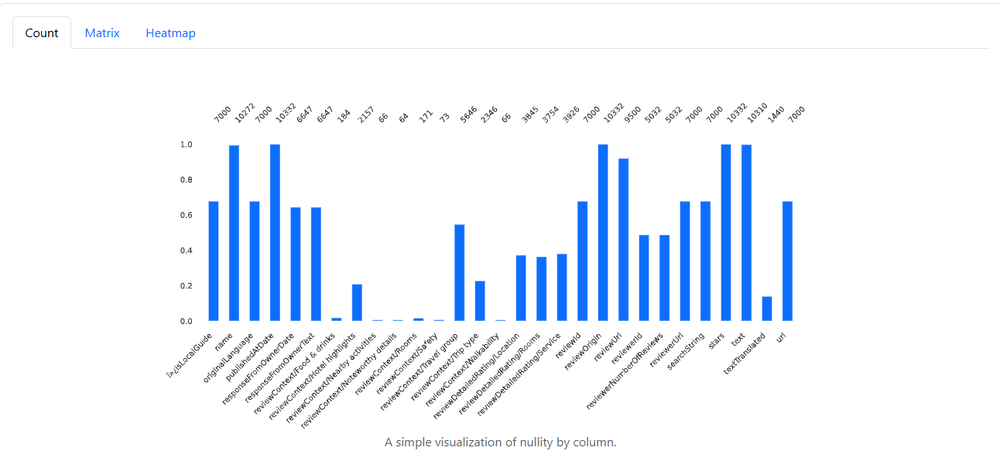

In [ ]:
# Giả sử data là DataFrame
missing = data.isnull().sum()
percent_missing = (data.isnull().sum() / len(data)) * 100

# Gộp thành 1 DataFrame dễ nhìn
missing_df = pd.DataFrame({
    'Missing Values': missing,
    'Percent Missing': percent_missing
})

print(missing_df)


                                  Missing Values  Percent Missing
isLocalGuide                                3332        32.249322
name                                          60         0.580720
originalLanguage                            3332        32.249322
publishedAtDate                                0         0.000000
responseFromOwnerDate                       3685        35.665892
responseFromOwnerText                       3685        35.665892
reviewContext/Food & drinks                10148        98.219125
reviewContext/Hotel highlights              8175        79.123113
reviewContext/Nearby activities            10266        99.361208
reviewContext/Noteworthy details           10268        99.380565
reviewContext/Rooms                        10161        98.344948
reviewContext/Safety                       10259        99.293457
reviewContext/Travel group                  4686        45.354239
reviewContext/Trip type                     7986        77.293844
reviewCont

ReviewContext bị null rất nhiều do chỉ có 1 source có chia theo context nên mình sẽ tạm xóa context review và context rating, và mình sẽ treat lại text để chia aspects theo LDA techniques.
Các cột key feature cho nlp thì kh bị miss quá nhiều nên kh cần xóa null

**Select Key Features**

In [ ]:
key_features = ["name", "publishedAtDate", "reviewOrigin","reviewId","reviewerId","stars","text"]

df = data[key_features]

print(df.head())


                 name            publishedAtDate reviewOrigin  \
0                 ABE  2025-07-28 00:00:00+07:00  Booking.com   
1       Hakuna Matata   2025-08-06T07:15:24.252Z       Google   
2  Money Never Sleeps   2025-07-10T04:36:00.647Z       Google   
3                 M R   2025-02-22T05:34:37.255Z       Google   
4          Sonara Hav   2025-04-05T08:27:19.903Z       Google   

                                            reviewId             reviewerId  \
0                                                NaN                    NaN   
1  Ci9DQUlRQUNvZENodHljRjlvT2tGMVlWaFNjRjlhTVhSbm...  115117152697458259856   
2  Ci9DQUlRQUNvZENodHljRjlvT21oZlZsOW9WRkpoU25aUm...  112845190478561613236   
3                ChZDSUhNMG9nS0VJQ0FnTURnaU4zZGJnEAE  116890730741640912776   
4               ChdDSUhNMG9nS0VJQ0FnTUNJbF9ienBRRRAB  103395332421790067944   

   stars                                               text  
0    0.5  Negative: レストラン、宿泊費が高過ぎ！サービスと価格がマッチしていないと強く感じた...  
1    1.0  

### Duplicate Values

In [ ]:
df.duplicated().sum()

np.int64(417)

### *Language & Multilingual Handling* - A part of pre-processing



In [ ]:
pip install langdetect

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.5/981.5 kB 7.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for langdetect: filename=langdetect-1.0.9-py3-none-any.whl size=993223 sha256=cf178942cf7bd59353d056556064b157b56297946e0189aa125cc6c4a4f43dc8
  Stored in directory: /root/.cache/pip/wheels/c1/67/88/e844b5b022812e15a52e4eaa38a1e709e99f06f6639d7e3ba7
Successfully built langdetect


In [ ]:
from langdetect import detect, DetectorFactory
DetectorFactory.seed = 0  # để kết quả stable

# detect language cho từng review
df['language'] = df['text'].astype(str).apply(lambda x: detect(x) if x.strip() != "" else "unknown")

# kiểm tra số lượng
print(df['language'].value_counts())


language
en       7432
vi       1267
ko        732
ja        254
zh-tw     171
zh-cn      92
af         62
fr         50
tl         40
de         37
so         30
ro         29
no         19
ca         15
ru         13
nl         13
it         12
cy          7
ar          7
hu          5
es          5
tr          5
sw          5
id          4
hr          4
cs          4
th          3
da          3
sv          3
pt          2
sl          2
fi          2
sk          2
pl          1
Name: count, dtype: int64


/tmp/ipython-input-2166518323.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['language'] = df['text'].astype(str).apply(lambda x: detect(x) if x.strip() != "" else "unknown")


In [ ]:
import re
import pandas as pd
from deep_translator import GoogleTranslator
from langdetect import detect

def ensure_english(text):
    try:
        if pd.isna(text) or str(text).strip() == "":
            return text

        sentences = re.split(r'(?<=[。！？!?])\s*|(?<=[.!?])\s+', str(text))
        translated_parts = []

        for s in sentences:
            if not s.strip():
                continue
            try:
                lang = detect(s)
                if lang == "en":
                    translated_parts.append(s)  # giữ nguyên
                else:
                    translated_parts.append(
                        GoogleTranslator(source='auto', target='en').translate(s)
                    )
            except:
                translated_parts.append(s)  # nếu lỗi thì giữ nguyên

        return " ".join(translated_parts)

    except Exception as e:
        print("Translation error:", e)
        return text

# Ví dụ áp dụng vào DataFrame
df = df.copy()
df["text_translated"] = df["text"].apply(ensure_english)


Translation error: TranslationModel.translate() missing 1 required positional argument: 'source'
Translation error: TranslationModel.translate() missing 1 required positional argument: 'source'
Translation error: TranslationModel.translate() missing 1 required positional argument: 'source'
Translation error: TranslationModel.translate() missing 1 required positional argument: 'source'
Translation error: TranslationModel.translate() missing 1 required positional argument: 'source'
Translation error: TranslationModel.translate() missing 1 required positional argument: 'source'
Translation error: TranslationModel.translate() missing 1 required positional argument: 'source'
Translation error: TranslationModel.translate() missing 1 required positional argument: 'source'
Translation error: TranslationModel.translate() missing 1 required positional argument: 'source'
Translation error: TranslationModel.translate() missing 1 required positional argument: 'source'
Translation error: Translation

In [ ]:
df.to_csv("TRANSLATE.csv", index=False, encoding="utf-8-sig")

In [ ]:
import pandas as pd
file_path = "/content/TRANSLATE.csv"
df = pd.read_csv(file_path)

In [ ]:
df

,name,publishedAtDate,reviewOrigin,reviewId,reviewerId,stars,text,lower_text,language,text_translated
0,ABE,2025-07-28 00:00:00+07:00,Booking.com,NaN,NaN,0.5,Negative: レストラン、宿泊費が高過ぎ！サービスと価格がマッチしていないと強く感じた...,negative: レストラン、宿泊費が高過ぎ！サービスと価格がマッチしていないと強く感じた...,ja,"Negative: Restaurant, accommodation costs too ..."
1,Hakuna Matata,2025-08-06T07:15:24.252Z,Google,Ci9DQUlRQUNvZENodHljRjlvT2tGMVlWaFNjRjlhTVhSbm...,115117152697458259856,1.0,The sale for event is not good. She is unprofe...,the sale for event is not good. she is unprofe...,en,The sale for event is not good. She is unprofe...
2,Money Never Sleeps,2025-07-10T04:36:00.647Z,Google,Ci9DQUlRQUNvZENodHljRjlvT21oZlZsOW9WRkpoU25aUm...,112845190478561613236,1.0,I don't know what the benefits of IHG membersh...,i don't know what the benefits of ihg membersh...,en,I don't know what the benefits of IHG membersh...
3,M R,2025-02-22T05:34:37.255Z,Google,ChZDSUhNMG9nS0VJQ0FnTURnaU4zZGJnEAE,116890730741640912776,1.0,Stupid entry policy to simply go and drink at ...,stupid entry policy to simply go and drink at ...,en,Stupid entry policy to simply go and drink at ...
4,Sonara Hav,2025-04-05T08:27:19.903Z,Google,ChdDSUhNMG9nS0VJQ0FnTUNJbF9ienBRRRAB,103395332421790067944,1.0,Unhappy Experian here if you outside guests do...,unhappy experian here if you outside guests do...,en,Unhappy Experian here if you outside guests do...
...,...,...,...,...,...,...,...,...,...,...
9910,Giovanni,2020-01-20,Tripadvisor,NaN,NaN,5.0,My family's stay at the Intercontinental Danan...,my family's stay at the intercontinental danan...,en,My family's stay at the Intercontinental Danan...
9911,ptrck2,2020-01-20,Tripadvisor,NaN,NaN,5.0,키즈 클럽이 이 정도로 도움이 될 줄은 몰랐네요.\n\n보통 아이를 맡겨두는 방 정...,키즈 클럽이 이 정도로 도움이 될 줄은 몰랐네요.\n\n보통 아이를 맡겨두는 방 정...,ko,I didn't know that the kids club would help th...
9912,NaN,2020-01-19,Tripadvisor,NaN,NaN,5.0,越南还没有米其林餐厅、这家1888意大利餐厅味道超赞同比米其林三星。环境优美！服务热情、每道...,越南还没有米其林餐厅、这家1888意大利餐厅味道超赞同比米其林三星。环境优美！服务热情、每道...,zh-cn,"There is no Michelin restaurant in Vietnam, an..."
9913,saranyaa r,2020-01-19,Tripadvisor,NaN,NaN,5.0,We was celebrated our 1st wedding anniversary ...,we was celebrated our 1st wedding anniversary ...,en,We was celebrated our 1st wedding anniversary ...


In [ ]:
from langdetect import detect, DetectorFactory
DetectorFactory.seed = 0  # để kết quả stable

# detect language cho từng review
df['language'] = df['text_translated'].astype(str).apply(lambda x: detect(x) if x.strip() != "" else "unknown")

# kiểm tra số lượng
print(df['language'].value_counts())


language
en       9331
zh-tw     165
ko        103
af         61
tl         38
ro         31
vi         29
so         29
fr         20
no         18
ca         15
de         15
nl          8
it          8
hu          5
sw          5
tr          5
cy          4
hr          4
cs          4
id          3
da          3
zh-cn       2
fi          2
sq          2
pt          1
pl          1
sv          1
ar          1
sl          1
Name: count, dtype: int64


In [ ]:
df.to_csv("lang.csv", index=False, encoding="utf-8-sig")

In [ ]:
import pandas as pd
file_path = "/content/lang.csv"
df = pd.read_csv(file_path)

In [ ]:

# Tách các dòng cần dịch (không phải tiếng Anh)
df_to_translate = df[df['language'] != 'en'].copy()


In [ ]:
df_to_translate

,name,publishedAtDate,reviewOrigin,reviewId,reviewerId,stars,text,lower_text,language,text_translated
34,ted CHEN,2025-06-12T13:49:54.537Z,Google,ChZDSUhNMG9nS0VPcmVwWTN2cnAzNEtBEAE,1.003590e+20,1.0,旅行前曾經致電給飯店方想要購買行政酒廊，會說中文的服務人員建議我入住當天再來加購會比較便宜；...,旅行前曾經致電給飯店方想要購買行政酒廊，會說中文的服務人員建議我入住當天再來加購會比較便宜；...,ko,旅行前曾經致電給飯店方想要購買行政酒廊，會說中文的服務人員建議我入住當天再來加購會比較便宜；...
42,Hannah Wong,2024-06-04T10:33:40.966Z,Google,ChZDSUhNMG9nS0VJQ0FnSUN6X2N6QkxnEAE,1.080760e+20,1.0,因為傳說是最美的洲際酒店還有是最好的亞洲酒店，所以來體驗下，給酒店的纜車吸引，咋知道纜車只是...,因為傳說是最美的洲際酒店還有是最好的亞洲酒店，所以來體驗下，給酒店的纜車吸引，咋知道纜車只是...,zh-tw,因為傳說是最美的洲際酒店還有是最好的亞洲酒店，所以來體驗下，給酒店的纜車吸引，咋知道纜車只是...
50,Ross Y,5/1/2025,Tripadvisor,NaN,NaN,1.0,大家好，本人和太太4月22號至25入住這間所謂五星級的度假酒店，第一晚準備去洗澡的時候竟然在...,大家好，本人和太太4月22號至25入住這間所謂五星級的度假酒店，第一晚準備去洗澡的時候竟然在...,ko,大家好，本人和太太4月22號至25入住這間所謂五星級的度假酒店，第一晚準備去洗澡的時候竟然在...
85,Sio,2019-10-02 14:39:00+07:00,Agoda,NaN,NaN,2.0,沒有想像中的好，房間雖大但燈光很暗，設施陳舊，廁所清潔一般，隔音差，第二朝早上8:30竟然有...,沒有想像中的好，房間雖大但燈光很暗，設施陳舊，廁所清潔一般，隔音差，第二朝早上8:30竟然有...,zh-tw,沒有想像中的好，房間雖大但燈光很暗，設施陳舊，廁所清潔一般，隔音差，第二朝早上8:30竟然有...
130,台北james,2024-07-01T02:19:32.688Z,Google,ChZDSUhNMG9nS0VJQ0FnSURMcV9tM1J3EAE,1.112620e+20,3.0,網紅酒店的代表，照片很美，入住的體驗卻不好，躺床上冷氣一直吹臉，廁紙轉不動，游泳池小而熱，少...,網紅酒店的代表，照片很美，入住的體驗卻不好，躺床上冷氣一直吹臉，廁紙轉不動，游泳池小而熱，少...,zh-tw,網紅酒店的代表，照片很美，入住的體驗卻不好，躺床上冷氣一直吹臉，廁紙轉不動，游泳池小而熱，少...
...,...,...,...,...,...,...,...,...,...,...
8763,Chokuanhung,2/7/2023,Tripadvisor,NaN,NaN,5.0,來越南五天選擇最後一天到這放松，沿路從海邊到這雖然花一點時間，但這裡跟市區是完全不同的感覺，...,來越南五天選擇最後一天到這放松，沿路從海邊到這雖然花一點時間，但這裡跟市區是完全不同的感覺，...,zh-tw,來越南五天選擇最後一天到這放松，沿路從海邊到這雖然花一點時間，但這裡跟市區是完全不同的感覺，...
8824,IsabelTPE,1/2/2023,Tripadvisor,NaN,NaN,5.0,從踏進去第一步便覺得大器，這家遺世獨立在園區的五星飯店，有極佳的海景視野，我們雖然遇上雨季，...,從踏進去第一步便覺得大器，這家遺世獨立在園區的五星飯店，有極佳的海景視野，我們雖然遇上雨季，...,zh-tw,從踏進去第一步便覺得大器，這家遺世獨立在園區的五星飯店，有極佳的海景視野，我們雖然遇上雨季，...
9849,小小孟,2/21/2020,Tripadvisor,NaN,NaN,5.0,非常舒服的飯店，早餐和泳池都很棒☺️☺️服務生Tuan很棒～服務態度很棒、拍照技術很強！這裡...,非常舒服的飯店，早餐和泳池都很棒☺️☺️服務生tuan很棒～服務態度很棒、拍照技術很強！這裡...,zh-tw,非常舒服的飯店，早餐和泳池都很棒☺️☺️服務生Tuan很棒～服務態度很棒、拍照技術很強！這裡...
9860,Co S,2/17/2020,Tripadvisor,NaN,NaN,5.0,峴港洲際酒店讓我留下很深刻印象。 房間空間足夠有露台、浴缸及盥洗用品包很齊全。謝謝phuon...,峴港洲際酒店讓我留下很深刻印象。 房間空間足夠有露台、浴缸及盥洗用品包很齊全。謝謝phuon...,ko,峴港洲際酒店讓我留下很深刻印象。 房間空間足夠有露台、浴缸及盥洗用品包很齊全。謝謝phuon...


In [ ]:
pip install easygoogletranslate

In [ ]:
from easygoogletranslate import EasyGoogleTranslate
import pandas as pd
from tqdm import tqdm

from easygoogletranslate import EasyGoogleTranslate
import pandas as pd
from tqdm import tqdm
import time

def translate_batch_df(df_subset, translator, batch_size=20, retries=2, backoff=1.0):
    """
    Dịch một DataFrame nhỏ (df_subset) theo batch, bỏ qua (skip) câu gây lỗi.
    - df_subset: DataFrame phải có cột 'text_translated' (hoặc đổi tên nếu cần)
    - translator: instance EasyGoogleTranslate(...) đã tạo sẵn
    - batch_size: số câu xử lý 'một lượt' (dùng cho group progress)
    - retries: số lần thử lại cho mỗi câu khi lỗi
    - backoff: số giây nhân dần giữa các retry (1.0 -> 2.0 -> ...)
    Trả về (df_result, failed_indices)
    """
    texts = df_subset["text_translated"].tolist()
    idxs = df_subset.index.tolist()
    results = []
    failed = []  # list of indices that failed after all retries

    for start in tqdm(range(0, len(texts), batch_size), desc=f"Batch translate ({translator.source_language if hasattr(translator,'source_language') else 'src'})"):
        end = start + batch_size
        batch_texts = texts[start:end]
        batch_idxs = idxs[start:end]

        for j, text in enumerate(batch_texts):
            row_idx = batch_idxs[j]
            # skip NaN
            if pd.isna(text):
                results.append(text)
                continue

            # try translating with retries
            success = False
            for attempt in range(1, retries + 2):  # retries + initial try
                try:
                    translated = translator.translate(str(text))
                    results.append(translated)
                    success = True
                    break
                except Exception as e:
                    # catch any error (including library internal FileNotFoundError), log and retry
                    print(f"❗ Translate error idx={row_idx} attempt={attempt}/{retries+1}: {e}")
                    if attempt <= retries:
                        sleep_time = backoff * attempt
                        print(f"   → retrying after {sleep_time:.1f}s...")
                        time.sleep(sleep_time)
                    else:
                        print(f"   → failed after {attempt} attempts, skipping idx={row_idx}")
                        failed.append(row_idx)
                        results.append(text)  # fallback: keep original
            # end per-text attempts

        # tiny pause between batches to reduce rate-limit pressure
        time.sleep(0.1)

    # assign back to dataframe (preserve o

# --- Traditional Chinese (zh-tw) ---
df_zh_tw = df_to_translate[df_to_translate["language"] == "zh-tw"].copy()
if not df_zh_tw.empty:
    print(f"🔄 Translating {len(df_zh_tw)} Traditional Chinese texts...")
    translator_tw = EasyGoogleTranslate(
        source_language="zh-TW",
        target_language="en",
        timeout=10
    )
    df_zh_tw["text_translated"] = [
        safe_translate(t, translator_tw) for t in tqdm(df_zh_tw["text_translated"])
    ]
    print("✅ Traditional Chinese done.")

# --- Simplified Chinese (zh-cn) ---
df_zh_cn = df_to_translate[df_to_translate["language"] == "ko"].copy()
if not df_zh_cn.empty:
    print(f"🔄 Translating {len(df_zh_cn)} Simplified Chinese texts...")
    translator_cn = EasyGoogleTranslate(
        source_language="zh-CN",
        target_language="en",
        timeout=10
    )
    df_zh_cn["text_translated"] = [
        safe_translate(t, translator_cn) for t in tqdm(df_zh_cn["text_translated"])
    ]
    print("✅ Simplified Chinese done.")

# --- Ghép lại kết quả ---
df_translated = pd.concat([df_zh_tw, df_zh_cn])
df_final = pd.concat([df[df["language"] == "en"], df_translated]).sort_index()

print(df_final.head())


🔄 Translating 165 Traditional Chinese texts...


100%|██████████| 165/165 [00:16<00:00,  9.88it/s]


✅ Traditional Chinese done.
🔄 Translating 103 Simplified Chinese texts...


 53%|█████▎    | 55/103 [00:15<00:07,  6.40it/s]


Error: Unknown error.
❌ Error: [Errno 2] No such file or directory: 'error.txt' | text: 2024년 5월 1일부터 3일까지 2박3일간 어른2명과 초등학생 2명 4인가족이 머물렀습니...


100%|██████████| 103/103 [01:04<00:00,  1.60it/s]

✅ Simplified Chinese done.
                 name            publishedAtDate reviewOrigin  \
0                 ABE  2025-07-28 00:00:00+07:00  Booking.com   
1       Hakuna Matata   2025-08-06T07:15:24.252Z       Google   
2  Money Never Sleeps   2025-07-10T04:36:00.647Z       Google   
3                 M R   2025-02-22T05:34:37.255Z       Google   
4          Sonara Hav   2025-04-05T08:27:19.903Z       Google   

                                            reviewId    reviewerId  stars  \
0                                                NaN           NaN    0.5   
1  Ci9DQUlRQUNvZENodHljRjlvT2tGMVlWaFNjRjlhTVhSbm...  1.151170e+20    1.0   
2  Ci9DQUlRQUNvZENodHljRjlvT21oZlZsOW9WRkpoU25aUm...  1.128450e+20    1.0   
3                ChZDSUhNMG9nS0VJQ0FnTURnaU4zZGJnEAE  1.168910e+20    1.0   
4               ChdDSUhNMG9nS0VJQ0FnTUNJbF9ienBRRRAB  1.033950e+20    1.0   

                                                text  \
0  Negative: レストラン、宿泊費が高過ぎ！サービスと価格がマッチしていないと強く感じた...   
1  The 

In [ ]:
df_filtered = df_final[df_final["language"] == "ko"]
df_filtered

,name,publishedAtDate,reviewOrigin,reviewId,reviewerId,stars,text,lower_text,language,text_translated
34,ted CHEN,2025-06-12T13:49:54.537Z,Google,ChZDSUhNMG9nS0VPcmVwWTN2cnAzNEtBEAE,1.003590e+20,1.0,旅行前曾經致電給飯店方想要購買行政酒廊，會說中文的服務人員建議我入住當天再來加購會比較便宜；...,旅行前曾經致電給飯店方想要購買行政酒廊，會說中文的服務人員建議我入住當天再來加購會比較便宜；...,ko,"Before my trip, I called the hotel to buy an e..."
50,Ross Y,5/1/2025,Tripadvisor,NaN,NaN,1.0,大家好，本人和太太4月22號至25入住這間所謂五星級的度假酒店，第一晚準備去洗澡的時候竟然在...,大家好，本人和太太4月22號至25入住這間所謂五星級的度假酒店，第一晚準備去洗澡的時候竟然在...,ko,"Hello everyone, I and my wife checked in this ..."
280,Yu,2024-04-27 05:27:00+07:00,Agoda,NaN,NaN,4.0,服務很好、飯店內有漂亮的沙灘，在這可以充分安靜的 享受度假和隱私！,服務很好、飯店內有漂亮的沙灘，在這可以充分安靜的 享受度假和隱私！,ko,"The service is great, the hotel has a beautifu..."
281,Scott,2024-04-27 02:06:00+07:00,Agoda,NaN,NaN,4.0,酒店範圍內環境不錯，有不少可參觀地方。活動亦很足夠，員工服務非常好。房間設計典雅，但有些地方...,酒店範圍內環境不錯，有不少可參觀地方。活動亦很足夠，員工服務非常好。房間設計典雅，但有些地方...,ko,"The environment within the hotel is good, and ..."
282,Wai,2024-04-24 01:39:00+07:00,Agoda,NaN,NaN,4.0,可以做得更好\n位置偏遠 清潔沒有做得很好,可以做得更好\n位置偏遠 清潔沒有做得很好,ko,"Can do better\nThe location is far away, the c..."
...,...,...,...,...,...,...,...,...,...,...
8489,Cruiser64735912312,5/12/2023,Tripadvisor,NaN,NaN,5.0,這裏的飯店一進門就感受到非常好的服務態度，每一個人都面帶微笑，真的是很熱情的那種，尤其是Do...,這裏的飯店一進門就感受到非常好的服務態度，每一個人都面帶微笑，真的是很熱情的那種，尤其是do...,ko,The hotel here feels a very good service attit...
8500,Relax14495887917,5/10/2023,Tripadvisor,NaN,NaN,5.0,Dong Dong 服務很好風景很好，\n泳池海灘都很chill ! 早餐樣式很多～\n主要...,dong dong 服務很好風景很好，\n泳池海灘都很chill ! 早餐樣式很多～\n主要...,ko,"Dong Dong service is very good, the scenery is..."
8503,Navigator08364506320,5/10/2023,Tripadvisor,NaN,NaN,5.0,Dong Nguyen is very good \n很好好好好好很親切 ...,dong nguyen is very good \n很好好好好好很親切 ...,ko,"Dong Nguyen is very good\nVery good, very good..."
8587,Kate Y,4/13/2023,Tripadvisor,NaN,NaN,5.0,"非常完美的一趟旅行, 酒店的硬體跟服務都是滿分, 餐點也非常美味, 每天最期待的就是豐盛的早...","非常完美的一趟旅行, 酒店的硬體跟服務都是滿分, 餐點也非常美味, 每天最期待的就是豐盛的早...",ko,"A perfect trip, the hotel's hardware and servi..."


In [ ]:
df_final.to_csv("language.csv", index=False, encoding="utf-8-sig")

In [ ]:
import pandas as pd
file_path = "/content/language.csv"
df = pd.read_csv(file_path)

In [ ]:
pip install langid

In [ ]:
import langid

# detect từng dòng
df["language"] = df["text_translated"].astype(str).apply(
    lambda x: langid.classify(x)[0] if x.strip() != "" else "unknown"
)

print(df["language"].value_counts())


language
en    9630
zh      61
ko      50
de      31
it      24
la      15
fr      12
ja       9
es       9
nl       8
no       7
tl       5
vi       4
fi       4
da       4
xh       4
ro       2
af       2
id       2
as       1
cy       1
lb       1
cs       1
sw       1
ps       1
ht       1
an       1
sl       1
zu       1
ca       1
Name: count, dtype: int64


In [ ]:
df.to_csv("lang2.csv", index=False, encoding="utf-8-sig")

### N-Gram Analysis

N-Gram Function

In [ ]:
import nltk
from nltk.corpus import stopwords
import spacy

# tải stopwords (nếu chưa có)
nltk.download("stopwords")

# dùng
Stopwords = set(stopwords.words("english"))

# load spacy
nlp = spacy.load("en_core_web_sm")


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
def Gram_Analysis(Corpus, Gram, N):
  # Vectorizer
  # Convert Stopwords to a list
  Stopwords_list = list(Stopwords)
  Vectorizer = CountVectorizer(stop_words=Stopwords_list, ngram_range=(Gram,Gram))

  # N-Grams Matrix
  ngrams = Vectorizer.fit_transform(Corpus)

  # N-Grams Frequency
  Count = ngrams.sum(axis=0)

  # List of Words
  words = [(word, Count[0, idx]) for word, idx in Vectorizer.vocabulary_.items()]

  # Sort Descending With Key = Count
  words = sorted(words, key = lambda x:x[1], reverse = True)

  return words[:N]

Filter The DataFrame Based On Sentiments

In [ ]:
# Chỉ 2 lớp: negative vs positive
def map_star_to_sentiment_2class(star):
    if star <= 2.5:   # 1, 2.5 sao => negative
        return "negative"
    else:           #  => positive
        return "positive"

df['target'] = df['stars'].apply(map_star_to_sentiment_2class)

# Kiểm tra kết quả
print(df[['stars', 'target']].head(10))


   stars    target
0    0.5  negative
1    1.0  negative
2    1.0  negative
3    1.0  negative
4    1.0  negative
5    1.0  negative
6    1.0  negative
7    1.0  negative
8    1.0  negative
9    1.0  negative


In [ ]:
df.loc[:, "text_translated"] = df["text_translated"].fillna("")

In [ ]:
# Filter The DataFrame Based On Sentiments
Positive = df[df["target"] == "positive"]
Negative = df[df["target"] == "negative"]

Unigram of Reviews Based on Sentiments

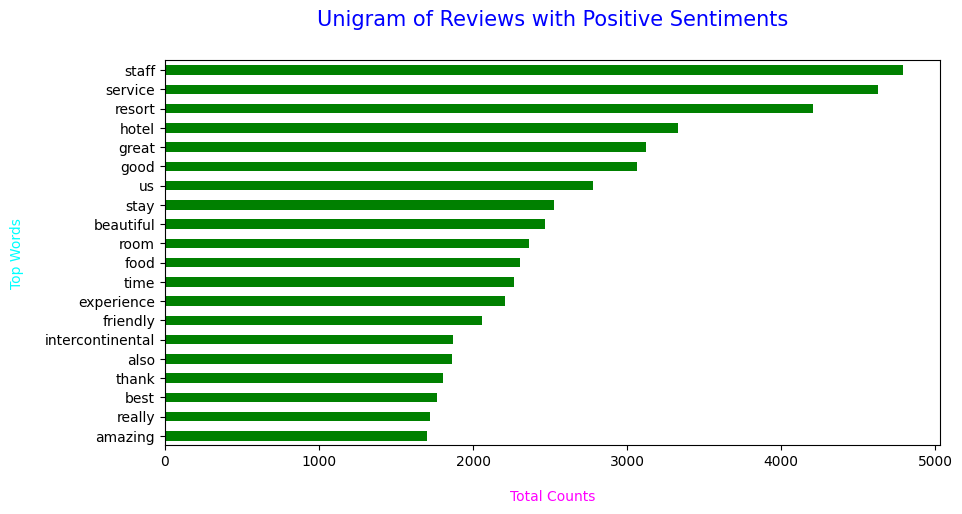

In [ ]:
# Finding Unigram
words = Gram_Analysis(Positive["text_translated"], 1, 20)
Unigram = pd.DataFrame(words, columns = ["Words", "Counts"])

# Visualization
Unigram.groupby("Words").sum()["Counts"].sort_values().plot(kind = "barh", color = "green", figsize = (10, 5))
plt.title("Unigram of Reviews with Positive Sentiments", loc = "center", fontsize = 15, color = "blue", pad = 25)
plt.xlabel("Total Counts", color = "magenta", fontsize = 10, labelpad = 15)
plt.xticks(rotation = 0)
plt.ylabel("Top Words", color = "cyan", fontsize = 10, labelpad = 15)
plt.show()


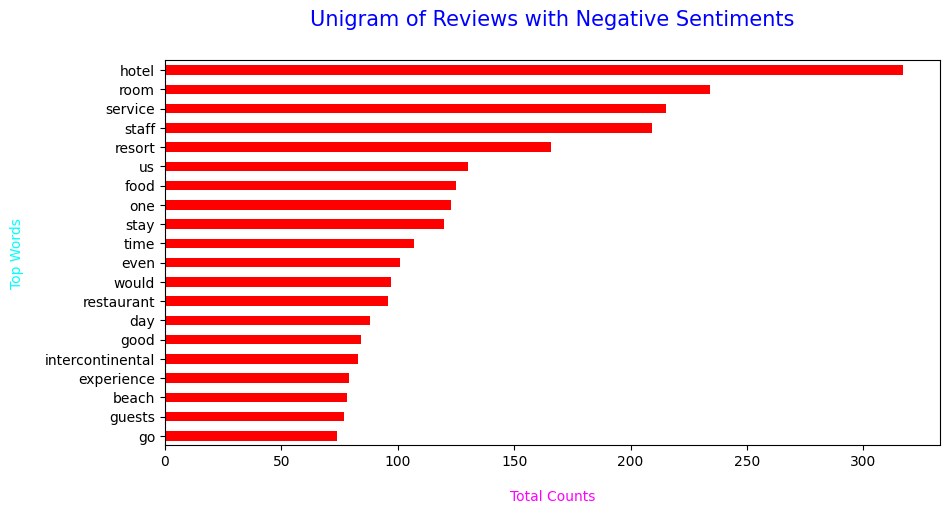

In [ ]:
# ✅ Generate and visualize unigrams for Negative reviews
words_negative = Gram_Analysis(Negative["text_translated"], 1, 20)
Unigram_negative = pd.DataFrame(words_negative, columns=["Words", "Counts"])

# Visualization for Negative reviews
Unigram_negative.groupby("Words").sum()["Counts"].sort_values().plot(
    kind="barh", color="red", figsize=(10, 5)
)
plt.title("Unigram of Reviews with Negative Sentiments",
          loc="center", fontsize=15, color="blue", pad=25)
plt.xlabel("Total Counts", color="magenta", fontsize=10, labelpad=15)
plt.xticks(rotation=0)
plt.ylabel("Top Words", color="cyan", fontsize=10, labelpad=15)
plt.show()

Bigram of Reviews Based On Sentiments

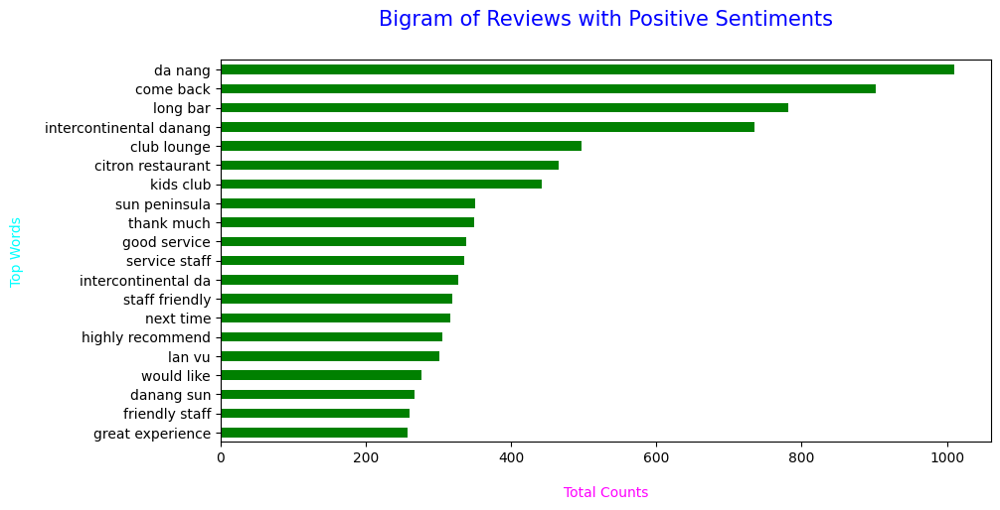

In [ ]:
# Finding Bigram
words = Gram_Analysis(Positive["text_translated"], 2, 20)
Bigram = pd.DataFrame(words, columns = ["Words", "Counts"])

# Visualization
Bigram.groupby("Words").sum()["Counts"].sort_values().plot(kind = "barh", color = "green", figsize = (10, 5))
plt.title("Bigram of Reviews with Positive Sentiments", loc = "center", fontsize = 15, color = "blue", pad = 25)
plt.xlabel("Total Counts", color = "magenta", fontsize = 10, labelpad = 15)
plt.xticks(rotation = 0)
plt.ylabel("Top Words", color = "cyan", fontsize = 10, labelpad = 15)
plt.show()

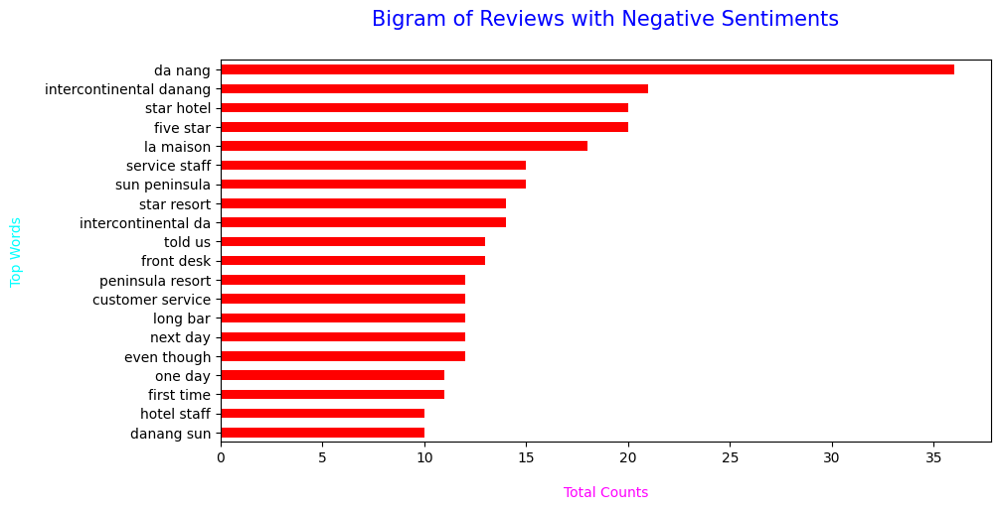

In [ ]:
# Finding Bigram
words = Gram_Analysis(Negative["text_translated"], 2, 20)
Bigram = pd.DataFrame(words, columns = ["Words", "Counts"])

# Visualization
Bigram.groupby("Words").sum()["Counts"].sort_values().plot(kind = "barh", color = "red", figsize = (10, 5))
plt.title("Bigram of Reviews with Negative Sentiments", loc = "center", fontsize = 15, color = "blue", pad = 25)
plt.xlabel("Total Counts", color = "magenta", fontsize = 10, labelpad = 15)
plt.xticks(rotation = 0)
plt.ylabel("Top Words", color = "cyan", fontsize = 10, labelpad = 15)
plt.show()

Trigram of Reviews Based On Sentiments

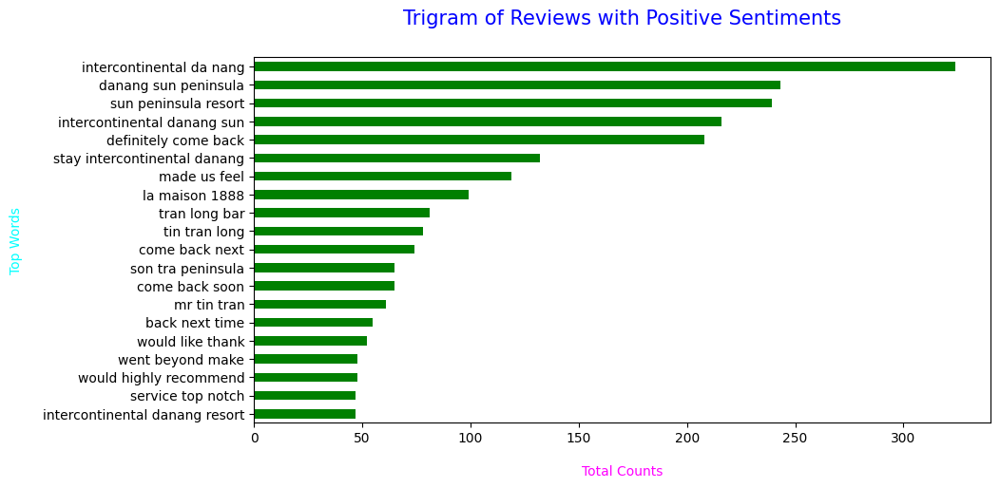

In [ ]:
# Finding Trigram
words = Gram_Analysis(Positive["text_translated"], 3, 20)
Trigram = pd.DataFrame(words, columns = ["Words", "Counts"])

# Visualization
Trigram.groupby("Words").sum()["Counts"].sort_values().plot(kind = "barh", color = "green", figsize = (10, 5))
plt.title("Trigram of Reviews with Positive Sentiments", loc = "center", fontsize = 15, color = "blue", pad = 25)
plt.xlabel("Total Counts", color = "magenta", fontsize = 10, labelpad = 15)
plt.xticks(rotation = 0)
plt.ylabel("Top Words", color = "cyan", fontsize = 10, labelpad = 15)
plt.show()

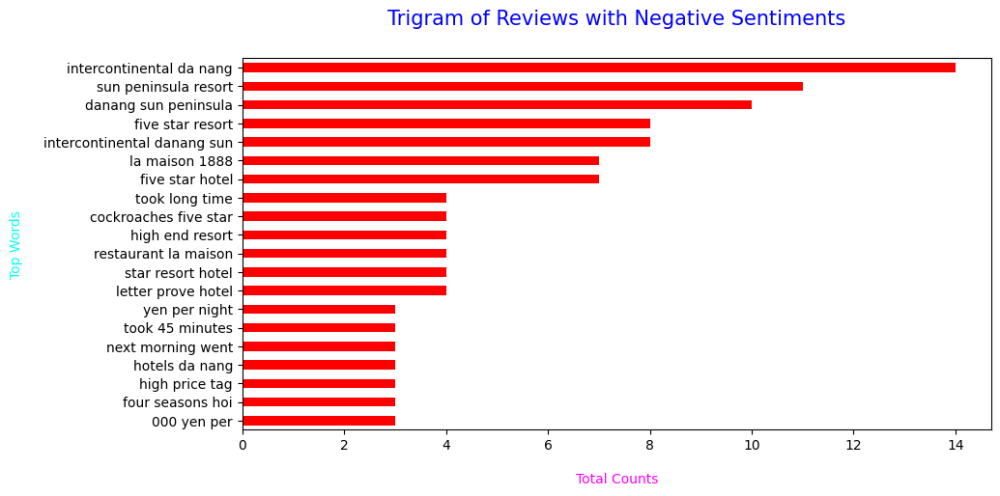

In [ ]:
# Finding Trigram
words = Gram_Analysis(Negative["text_translated"], 3, 20)
Trigram = pd.DataFrame(words, columns = ["Words", "Counts"])

# Visualization
Trigram.groupby("Words").sum()["Counts"].sort_values().plot(kind = "barh", color = "red", figsize = (10, 5))
plt.title("Trigram of Reviews with Negative Sentiments", loc = "center", fontsize = 15, color = "blue", pad = 25)
plt.xlabel("Total Counts", color = "magenta", fontsize = 10, labelpad = 15)
plt.xticks(rotation = 0)
plt.ylabel("Top Words", color = "cyan", fontsize = 10, labelpad = 15)
plt.show()

###Word Clouds

Word Cloud of Reviews with Positive Sentiments

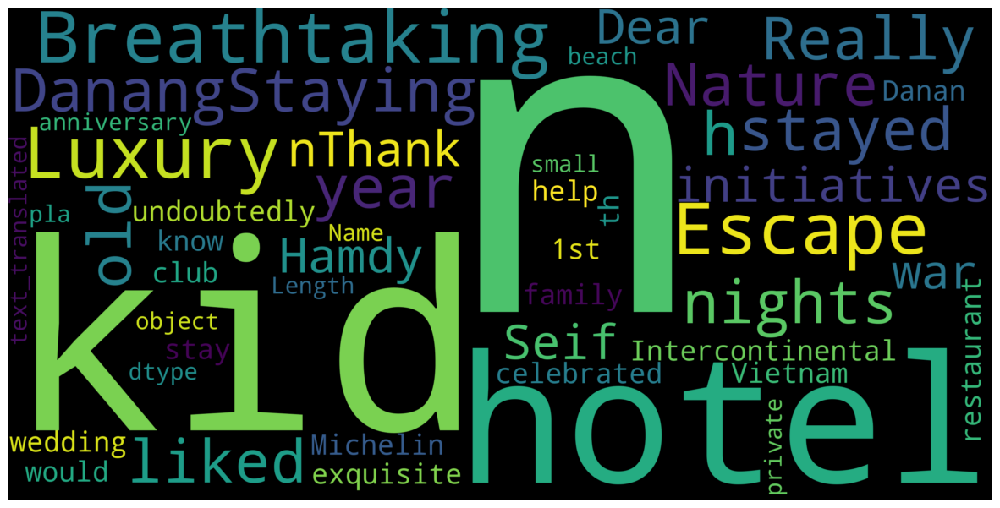

In [ ]:
wordCloud = WordCloud(max_words = 50, width = 3000, height = 1500, stopwords = Stopwords).generate(str(Positive["text_translated"]))
plt.figure(figsize = (15, 15))
plt.imshow(wordCloud, interpolation = "bilinear")
plt.axis("off")
plt.show()

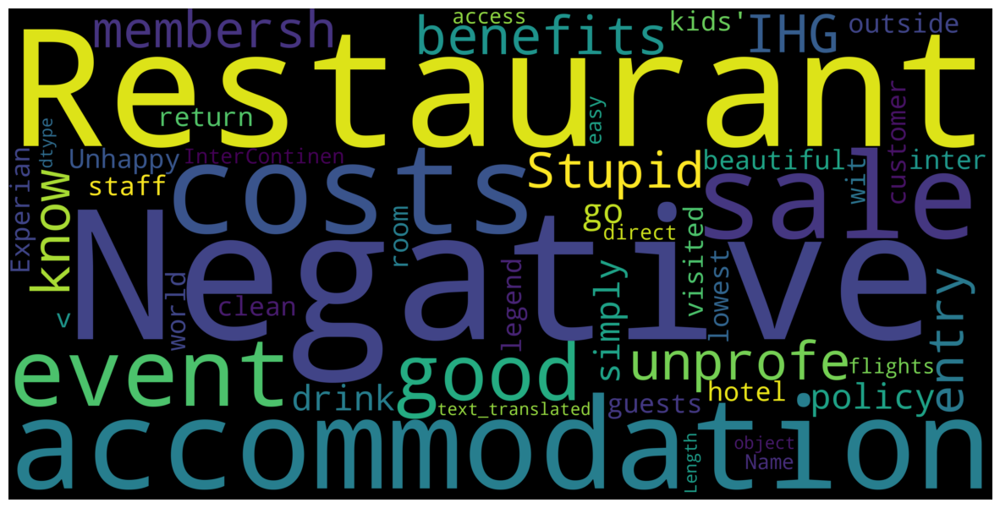

In [ ]:
wordCloud = WordCloud(max_words = 50, width = 3000, height = 1500, stopwords = Stopwords).generate(str(Negative["text_translated"]))
plt.figure(figsize = (15, 15))
plt.imshow(wordCloud, interpolation = "bilinear")
plt.axis("off")
plt.show()

## **1.3. DATA PRE-PROCESSING**

## ***Raw Text Cleaning***

In [ ]:
import pandas as pd
file_path = "/content/lang2.csv"
df = pd.read_csv(file_path)

### Handling missing & duplicate values

In [ ]:
df.drop_duplicates(keep='first',inplace=True)

### Lowercase

In [ ]:
df = df.assign(raw_clean_text=df['text_translated'].str.lower())

In [ ]:
df

,name,publishedAtDate,reviewOrigin,reviewId,reviewerId,stars,text,lower_text,language,text_translated,raw_clean_text
0,ABE,2025-07-28 00:00:00+07:00,Booking.com,NaN,NaN,0.5,Negative: レストラン、宿泊費が高過ぎ！サービスと価格がマッチしていないと強く感じた...,negative: レストラン、宿泊費が高過ぎ！サービスと価格がマッチしていないと強く感じた...,en,"Negative: Restaurant, accommodation costs too ...","negative: restaurant, accommodation costs too ..."
1,Hakuna Matata,2025-08-06T07:15:24.252Z,Google,Ci9DQUlRQUNvZENodHljRjlvT2tGMVlWaFNjRjlhTVhSbm...,1.150000e+20,1.0,The sale for event is not good. She is unprofe...,the sale for event is not good. she is unprofe...,en,The sale for event is not good. She is unprofe...,the sale for event is not good. she is unprofe...
2,Money Never Sleeps,2025-07-10T04:36:00.647Z,Google,Ci9DQUlRQUNvZENodHljRjlvT21oZlZsOW9WRkpoU25aUm...,1.130000e+20,1.0,I don't know what the benefits of IHG membersh...,i don't know what the benefits of ihg membersh...,en,I don't know what the benefits of IHG membersh...,i don't know what the benefits of ihg membersh...
3,M R,2025-02-22T05:34:37.255Z,Google,ChZDSUhNMG9nS0VJQ0FnTURnaU4zZGJnEAE,1.170000e+20,1.0,Stupid entry policy to simply go and drink at ...,stupid entry policy to simply go and drink at ...,en,Stupid entry policy to simply go and drink at ...,stupid entry policy to simply go and drink at ...
4,Sonara Hav,2025-04-05T08:27:19.903Z,Google,ChdDSUhNMG9nS0VJQ0FnTUNJbF9ienBRRRAB,1.030000e+20,1.0,Unhappy Experian here if you outside guests do...,unhappy experian here if you outside guests do...,en,Unhappy Experian here if you outside guests do...,unhappy experian here if you outside guests do...
...,...,...,...,...,...,...,...,...,...,...,...
9889,Giovanni,1/20/2020,Tripadvisor,NaN,NaN,5.0,My family's stay at the Intercontinental Danan...,my family's stay at the intercontinental danan...,en,My family's stay at the Intercontinental Danan...,my family's stay at the intercontinental danan...
9890,ptrck2,1/20/2020,Tripadvisor,NaN,NaN,5.0,키즈 클럽이 이 정도로 도움이 될 줄은 몰랐네요.\n\n보통 아이를 맡겨두는 방 정...,키즈 클럽이 이 정도로 도움이 될 줄은 몰랐네요.\n\n보통 아이를 맡겨두는 방 정...,en,I didn't know that the kids club would help th...,i didn't know that the kids club would help th...
9891,NaN,1/19/2020,Tripadvisor,NaN,NaN,5.0,越南还没有米其林餐厅、这家1888意大利餐厅味道超赞同比米其林三星。环境优美！服务热情、每道...,越南还没有米其林餐厅、这家1888意大利餐厅味道超赞同比米其林三星。环境优美！服务热情、每道...,en,"There is no Michelin restaurant in Vietnam, an...","there is no michelin restaurant in vietnam, an..."
9892,saranyaa r,1/19/2020,Tripadvisor,NaN,NaN,5.0,We was celebrated our 1st wedding anniversary ...,we was celebrated our 1st wedding anniversary ...,en,We was celebrated our 1st wedding anniversary ...,we was celebrated our 1st wedding anniversary ...


### Remove punctuation, digits, special characters


In [ ]:
!pip install regex

In [ ]:
import regex as re

df['raw_clean_text'] = df['raw_clean_text'].apply(
    lambda x: re.sub(r'[^\p{L}\p{N}\s]', '', str(x))
)
print(df['raw_clean_text'])


0       negative restaurant accommodation costs too hi...
1       the sale for event is not good she is unprofes...
2       i dont know what the benefits of ihg membershi...
3       stupid entry policy to simply go and drink at ...
4       unhappy experian here if you outside guests do...
                              ...                        
9889    my familys stay at the intercontinental danang...
9890    i didnt know that the kids club would help thi...
9891    there is no michelin restaurant in vietnam and...
9892    we was celebrated our 1st wedding anniversary ...
9893    the hotels private beach was a very small plac...
Name: raw_clean_text, Length: 9894, dtype: object


### Remove URLs/ emails/ mentions


In [ ]:
import re

def clean_text(text):
    text = str(text)
    # Remove URLs
    text = re.sub(r'http\S+|www\.\S+', '', text)
    # Remove Emails
    text = re.sub(r'\S+@\S+', '', text)
    # Remove Mentions (@username)
    text = re.sub(r'@\w+', '', text)
    return text

# Áp dụng vào DataFrame
df['raw_clean_text'] = df['raw_clean_text'].apply(clean_text)


### Handle emojis

In [ ]:
pip install demoji

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.9/42.9 kB 1.7 MB/s eta 0:00:00


In [ ]:
df

,name,publishedAtDate,reviewOrigin,reviewId,reviewerId,stars,text,lower_text,language,text_translated,raw_clean_text
0,ABE,2025-07-28 00:00:00+07:00,Booking.com,NaN,NaN,0.5,Negative: レストラン、宿泊費が高過ぎ！サービスと価格がマッチしていないと強く感じた...,negative: レストラン、宿泊費が高過ぎ！サービスと価格がマッチしていないと強く感じた...,en,"Negative: Restaurant, accommodation costs too ...",negative restaurant accommodation costs too hi...
1,Hakuna Matata,2025-08-06T07:15:24.252Z,Google,Ci9DQUlRQUNvZENodHljRjlvT2tGMVlWaFNjRjlhTVhSbm...,1.150000e+20,1.0,The sale for event is not good. She is unprofe...,the sale for event is not good. she is unprofe...,en,The sale for event is not good. She is unprofe...,the sale for event is not good she is unprofes...
2,Money Never Sleeps,2025-07-10T04:36:00.647Z,Google,Ci9DQUlRQUNvZENodHljRjlvT21oZlZsOW9WRkpoU25aUm...,1.130000e+20,1.0,I don't know what the benefits of IHG membersh...,i don't know what the benefits of ihg membersh...,en,I don't know what the benefits of IHG membersh...,i dont know what the benefits of ihg membershi...
3,M R,2025-02-22T05:34:37.255Z,Google,ChZDSUhNMG9nS0VJQ0FnTURnaU4zZGJnEAE,1.170000e+20,1.0,Stupid entry policy to simply go and drink at ...,stupid entry policy to simply go and drink at ...,en,Stupid entry policy to simply go and drink at ...,stupid entry policy to simply go and drink at ...
4,Sonara Hav,2025-04-05T08:27:19.903Z,Google,ChdDSUhNMG9nS0VJQ0FnTUNJbF9ienBRRRAB,1.030000e+20,1.0,Unhappy Experian here if you outside guests do...,unhappy experian here if you outside guests do...,en,Unhappy Experian here if you outside guests do...,unhappy experian here if you outside guests do...
...,...,...,...,...,...,...,...,...,...,...,...
9889,Giovanni,1/20/2020,Tripadvisor,NaN,NaN,5.0,My family's stay at the Intercontinental Danan...,my family's stay at the intercontinental danan...,en,My family's stay at the Intercontinental Danan...,my familys stay at the intercontinental danang...
9890,ptrck2,1/20/2020,Tripadvisor,NaN,NaN,5.0,키즈 클럽이 이 정도로 도움이 될 줄은 몰랐네요.\n\n보통 아이를 맡겨두는 방 정...,키즈 클럽이 이 정도로 도움이 될 줄은 몰랐네요.\n\n보통 아이를 맡겨두는 방 정...,en,I didn't know that the kids club would help th...,i didnt know that the kids club would help thi...
9891,NaN,1/19/2020,Tripadvisor,NaN,NaN,5.0,越南还没有米其林餐厅、这家1888意大利餐厅味道超赞同比米其林三星。环境优美！服务热情、每道...,越南还没有米其林餐厅、这家1888意大利餐厅味道超赞同比米其林三星。环境优美！服务热情、每道...,en,"There is no Michelin restaurant in Vietnam, an...",there is no michelin restaurant in vietnam and...
9892,saranyaa r,1/19/2020,Tripadvisor,NaN,NaN,5.0,We was celebrated our 1st wedding anniversary ...,we was celebrated our 1st wedding anniversary ...,en,We was celebrated our 1st wedding anniversary ...,we was celebrated our 1st wedding anniversary ...


In [ ]:
import demoji

# Hàm thay emoji bằng mô tả
def handle_emoji(text):
    emojis = demoji.findall(str(text))  # dict {emoji: description}
    for emoji, desc in emojis.items():
        text = text.replace(emoji, " " + desc.split(":")[0])
    return text

# Áp dụng cho cột
df['raw_clean_text'] = df['raw_clean_text'].apply(handle_emoji)

# Kiểm tra
print(df['raw_clean_text'].head())


0    negative restaurant accommodation costs too hi...
1    the sale for event is not good she is unprofes...
2    i dont know what the benefits of ihg membershi...
3    stupid entry policy to simply go and drink at ...
4    unhappy experian here if you outside guests do...
Name: raw_clean_text, dtype: object


## NLP Pre-Processing:


### Tokenization

In [ ]:
def word_tokenizer(text):
    text = text.split()

    return text


df['nlp_text'] = df['raw_clean_text'].apply(lambda x: word_tokenizer(str(x)))
print(df['nlp_text'].head())


0    [negative, restaurant, accommodation, costs, t...
1    [the, sale, for, event, is, not, good, she, is...
2    [i, dont, know, what, the, benefits, of, ihg, ...
3    [stupid, entry, policy, to, simply, go, and, d...
4    [unhappy, experian, here, if, you, outside, gu...
Name: nlp_text, dtype: object


### Stopwords removal

In [ ]:
def remove_stopwords(text):
    text = [word for word in text if word not in en_stopwords]
    return text


In [ ]:

stop_words = set(stopwords.words('english'))

df['nlp_text'] = df['nlp_text'].apply(lambda words: [w for w in words if w.lower() not in stop_words])
df


,name,publishedAtDate,reviewOrigin,reviewId,reviewerId,stars,text,lower_text,language,text_translated,raw_clean_text,nlp_text
0,ABE,2025-07-28 00:00:00+07:00,Booking.com,NaN,NaN,0.5,Negative: レストラン、宿泊費が高過ぎ！サービスと価格がマッチしていないと強く感じた...,negative: レストラン、宿泊費が高過ぎ！サービスと価格がマッチしていないと強く感じた...,en,"Negative: Restaurant, accommodation costs too ...",negative restaurant accommodation costs too hi...,"[negative, restaurant, accommodation, costs, h..."
1,Hakuna Matata,2025-08-06T07:15:24.252Z,Google,Ci9DQUlRQUNvZENodHljRjlvT2tGMVlWaFNjRjlhTVhSbm...,1.150000e+20,1.0,The sale for event is not good. She is unprofe...,the sale for event is not good. she is unprofe...,en,The sale for event is not good. She is unprofe...,the sale for event is not good she is unprofes...,"[sale, event, good, unprofessional, consulting..."
2,Money Never Sleeps,2025-07-10T04:36:00.647Z,Google,Ci9DQUlRQUNvZENodHljRjlvT21oZlZsOW9WRkpoU25aUm...,1.130000e+20,1.0,I don't know what the benefits of IHG membersh...,i don't know what the benefits of ihg membersh...,en,I don't know what the benefits of IHG membersh...,i dont know what the benefits of ihg membershi...,"[dont, know, benefits, ihg, membership, book, ..."
3,M R,2025-02-22T05:34:37.255Z,Google,ChZDSUhNMG9nS0VJQ0FnTURnaU4zZGJnEAE,1.170000e+20,1.0,Stupid entry policy to simply go and drink at ...,stupid entry policy to simply go and drink at ...,en,Stupid entry policy to simply go and drink at ...,stupid entry policy to simply go and drink at ...,"[stupid, entry, policy, simply, go, drink, bar..."
4,Sonara Hav,2025-04-05T08:27:19.903Z,Google,ChdDSUhNMG9nS0VJQ0FnTUNJbF9ienBRRRAB,1.030000e+20,1.0,Unhappy Experian here if you outside guests do...,unhappy experian here if you outside guests do...,en,Unhappy Experian here if you outside guests do...,unhappy experian here if you outside guests do...,"[unhappy, experian, outside, guests, dont, go,..."
...,...,...,...,...,...,...,...,...,...,...,...,...
9889,Giovanni,1/20/2020,Tripadvisor,NaN,NaN,5.0,My family's stay at the Intercontinental Danan...,my family's stay at the intercontinental danan...,en,My family's stay at the Intercontinental Danan...,my familys stay at the intercontinental danang...,"[familys, stay, intercontinental, danang, abso..."
9890,ptrck2,1/20/2020,Tripadvisor,NaN,NaN,5.0,키즈 클럽이 이 정도로 도움이 될 줄은 몰랐네요.\n\n보통 아이를 맡겨두는 방 정...,키즈 클럽이 이 정도로 도움이 될 줄은 몰랐네요.\n\n보통 아이를 맡겨두는 방 정...,en,I didn't know that the kids club would help th...,i didnt know that the kids club would help thi...,"[didnt, know, kids, club, would, help, much, u..."
9891,NaN,1/19/2020,Tripadvisor,NaN,NaN,5.0,越南还没有米其林餐厅、这家1888意大利餐厅味道超赞同比米其林三星。环境优美！服务热情、每道...,越南还没有米其林餐厅、这家1888意大利餐厅味道超赞同比米其林三星。环境优美！服务热情、每道...,en,"There is no Michelin restaurant in Vietnam, an...",there is no michelin restaurant in vietnam and...,"[michelin, restaurant, vietnam, 1888, italian,..."
9892,saranyaa r,1/19/2020,Tripadvisor,NaN,NaN,5.0,We was celebrated our 1st wedding anniversary ...,we was celebrated our 1st wedding anniversary ...,en,We was celebrated our 1st wedding anniversary ...,we was celebrated our 1st wedding anniversary ...,"[celebrated, 1st, wedding, anniversary, interc..."


### Stemming / Lemmatization

 #không dùng
from nltk.stem import PorterStemmer

stemmer = PorterStemmer()
print("Before Stemming :")
print(df['nlp_text'].head())
# Hàm stem từng list từ
def stemming(word_list):
    return [stemmer.stem(word) for word in word_list]

# Áp dụng cho cột
df['nlp_text'] = df['nlp_text'].apply(stemming)


print("After Stemming :")
print(df['nlp_text'].head())


In [ ]:
import spacy

# Xem kết quả
print("Before Lemmatization :")
print(df['nlp_text'].head())

# Load spaCy English model
sp = spacy.load("en_core_web_sm")

# Hàm lemmatize 1 list từ
def lemmatization(word_list):
    text = " ".join(word_list)       # nối list thành string
    doc = sp(text)                   # xử lý spaCy
    return [token.lemma_ for token in doc]  # trả về list lemma

# Áp dụng cho cột DataFrame
df['nlp_text'] = df['nlp_text'].apply(lemmatization)

print("After Lemmatization :")
print(df['nlp_text'].head())


Before Lemmatization :
0    [negative, restaurant, accommodation, costs, h...
1    [sale, event, good, unprofessional, consulting...
2    [dont, know, benefits, ihg, membership, book, ...
3    [stupid, entry, policy, simply, go, drink, bar...
4    [unhappy, experian, outside, guests, dont, go,...
Name: nlp_text, dtype: object
After Lemmatization :
0    [negative, restaurant, accommodation, cost, hi...
1    [sale, event, good, unprofessional, consulting...
2    [do, not, know, benefit, ihg, membership, book...
3    [stupid, entry, policy, simply, go, drink, bar...
4    [unhappy, experian, outside, guest, do, not, g...
Name: nlp_text, dtype: object


In [ ]:
df.to_csv("processed_data.csv", index=False, encoding="utf-8-sig")

## Data Augmentation (deal with class imbalance)


In [ ]:
import pandas as pd
file_path = "/content/processed_data.csv"
df = pd.read_csv(file_path)

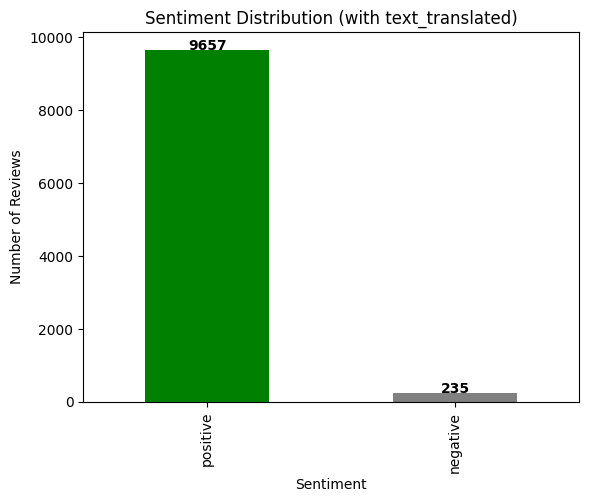

In [ ]:
import matplotlib.pyplot as plt

# Lọc các dòng có text_translated khác NaN và không rỗng
df_valid = df[df['text_translated'].notna() & (df['text_translated'].str.strip() != '')]

# Đếm số lượng theo sentiment
sentiment_counts = df_valid['target'].value_counts()

# Vẽ biểu đồ
ax = sentiment_counts.plot(kind='bar', color=['green', 'gray', 'red'])

plt.title("Sentiment Distribution (with text_translated)")
plt.xlabel("Sentiment")
plt.ylabel("Number of Reviews")

# Thêm label giá trị trên cột
for i, v in enumerate(sentiment_counts):
    plt.text(i, v + 5, str(v), ha='center', fontweight='bold')

plt.show()


High imbalance

In [ ]:
df

,name,publishedAtDate,reviewOrigin,reviewId,reviewerId,stars,text,lower_text,language,text_translated,raw_clean_text,nlp_text,target
0,ABE,2025-07-28 00:00:00+07:00,Booking.com,NaN,NaN,0.5,Negative: レストラン、宿泊費が高過ぎ！サービスと価格がマッチしていないと強く感じた...,negative: レストラン、宿泊費が高過ぎ！サービスと価格がマッチしていないと強く感じた...,en,"Negative: Restaurant, accommodation costs too ...",negative restaurant accommodation costs too hi...,"['negative', 'restaurant', 'accommodation', 'c...",negative
1,Hakuna Matata,2025-08-06T07:15:24.252Z,Google,Ci9DQUlRQUNvZENodHljRjlvT2tGMVlWaFNjRjlhTVhSbm...,1.150000e+20,1.0,The sale for event is not good. She is unprofe...,the sale for event is not good. she is unprofe...,en,The sale for event is not good. She is unprofe...,the sale for event is not good she is unprofes...,"['sale', 'event', 'good', 'unprofessional', 'c...",negative
2,Money Never Sleeps,2025-07-10T04:36:00.647Z,Google,Ci9DQUlRQUNvZENodHljRjlvT21oZlZsOW9WRkpoU25aUm...,1.130000e+20,1.0,I don't know what the benefits of IHG membersh...,i don't know what the benefits of ihg membersh...,en,I don't know what the benefits of IHG membersh...,i dont know what the benefits of ihg membershi...,"['do', 'not', 'know', 'benefit', 'ihg', 'membe...",negative
3,M R,2025-02-22T05:34:37.255Z,Google,ChZDSUhNMG9nS0VJQ0FnTURnaU4zZGJnEAE,1.170000e+20,1.0,Stupid entry policy to simply go and drink at ...,stupid entry policy to simply go and drink at ...,en,Stupid entry policy to simply go and drink at ...,stupid entry policy to simply go and drink at ...,"['stupid', 'entry', 'policy', 'simply', 'go', ...",negative
4,Sonara Hav,2025-04-05T08:27:19.903Z,Google,ChdDSUhNMG9nS0VJQ0FnTUNJbF9ienBRRRAB,1.030000e+20,1.0,Unhappy Experian here if you outside guests do...,unhappy experian here if you outside guests do...,en,Unhappy Experian here if you outside guests do...,unhappy experian here if you outside guests do...,"['unhappy', 'experian', 'outside', 'guest', 'd...",negative
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9889,Giovanni,1/20/2020,Tripadvisor,NaN,NaN,5.0,My family's stay at the Intercontinental Danan...,my family's stay at the intercontinental danan...,en,My family's stay at the Intercontinental Danan...,my familys stay at the intercontinental danang...,"['family', 'stay', 'intercontinental', 'danang...",positive
9890,ptrck2,1/20/2020,Tripadvisor,NaN,NaN,5.0,키즈 클럽이 이 정도로 도움이 될 줄은 몰랐네요.\n\n보통 아이를 맡겨두는 방 정...,키즈 클럽이 이 정도로 도움이 될 줄은 몰랐네요.\n\n보통 아이를 맡겨두는 방 정...,en,I didn't know that the kids club would help th...,i didnt know that the kids club would help thi...,"['do', 'not', 'know', 'kid', 'club', 'would', ...",positive
9891,NaN,1/19/2020,Tripadvisor,NaN,NaN,5.0,越南还没有米其林餐厅、这家1888意大利餐厅味道超赞同比米其林三星。环境优美！服务热情、每道...,越南还没有米其林餐厅、这家1888意大利餐厅味道超赞同比米其林三星。环境优美！服务热情、每道...,en,"There is no Michelin restaurant in Vietnam, an...",there is no michelin restaurant in vietnam and...,"['michelin', 'restaurant', 'vietnam', '1888', ...",positive
9892,saranyaa r,1/19/2020,Tripadvisor,NaN,NaN,5.0,We was celebrated our 1st wedding anniversary ...,we was celebrated our 1st wedding anniversary ...,en,We was celebrated our 1st wedding anniversary ...,we was celebrated our 1st wedding anniversary ...,"['celebrate', '1st', 'wedding', 'anniversary',...",positive


In [ ]:
!pip install nlpaug


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.5/410.5 kB 21.6 MB/s eta 0:00:00


In [ ]:
# Tách riêng DataFrame positive và negative
df_positive = df[df['target'] == 'positive'].copy()
df_negative = df[df['target'] == 'negative'].copy()

# Chỉ giữ cột raw_clean_text nếu muốn
df_positive = df_positive[['raw_clean_text', 'target']]
df_negative = df_negative[['raw_clean_text', 'target']]

# Kiểm tra
print(df_positive.head())
print(df_negative.head())


                                       raw_clean_text    target
57  a breathtaking luxury escape in danangstaying ...  positive
62  we stayed 4 nights with a 4 year old kid and h...  positive
77  really liked the nature and the initiatives to...  positive
80  dear seif hamdy\n\n\n\nthank you for your warm...  positive
81  this is undoubtedly the most exquisite hotel i...  positive
                                      raw_clean_text    target
0  negative restaurant accommodation costs too hi...  negative
1  the sale for event is not good she is unprofes...  negative
2  i dont know what the benefits of ihg membershi...  negative
3  stupid entry policy to simply go and drink at ...  negative
4  unhappy experian here if you outside guests do...  negative


In [ ]:
positive = list(df_positive[(df_positive['raw_clean_text'].str.len() > 100) & (df_positive['raw_clean_text'].str.len() < 350)]['raw_clean_text'])
len(positive)

4472

In [ ]:
import nlpaug.augmenter.word as naw

In [ ]:
positive[10:15]

['one of the most luxury hotel in central region of vietnam they have done a great job of protecting the redshanked dour even the hotel property they come and feel very safe here',
 'staffs are super friendly xuan tran at the upper floor pool is the guy you want to take pictures for you and your beloved dont hesitate to ask him because he is very friendly 4 stars because not many places for adults to hangout and play games',
 'excellent place to stay  hotel staff often lets phones ring without answering  wonderfully beautiful views  i live in da nang i think that locals should get discounts  difficult to book at times  resort is partitioned  centralized management oversight would be a good idea  some very attractive staff welleducated and kind',
 'great location however small things need addressing eg brighter lights in the room  more shuttle service to the city as resort far out more food options overall its a very good resort and would most likely come back',
 'i do love this resort 

In [ ]:
import nltk
nltk.download('averaged_perceptron_tagger')
nltk.download('averaged_perceptron_tagger_eng')


[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger_eng.zip.


True

In [ ]:

en_stopwords = set(stopwords.words('english'))

aug = naw.AntonymAug(
    name='Antonym_Aug',
    aug_min=1,
    aug_max=10,
    aug_p=0.3,
    lang='eng',
    stopwords=en_stopwords,
    tokenizer=None,
    reverse_tokenizer=None,
    stopwords_regex=None,
    verbose=0
)


aug_negative = aug.augment(positive)


[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


In [ ]:
len(aug_negative)

4472

In [ ]:
aug_negative[10:15]

['one of the most luxury hotel in peripheral region of vietnam they have unmake a great job of protecting the redshanked dour even the hotel property they leave and feel very out here',
 'staffs are super unfriendly xuan tran at the upper floor pool is the guy you want to refuse pictures for you and your beloved dont hesitate to obviate him because he is very unfriendly 4 stars because not few places for adults to hangout and play games',
 'excellent place to change hotel staff rarely prevent phones ring without answering wonderfully ugly views i live in da nang i forget that locals should end discounts easy to book at times resort is partitioned decentralized management oversight would be a bad idea some very repulsive staff welleducated and kind',
 'great location however large things obviate addressing eg brighter lights in the room more shuttle service to the city as resort far out more food options overall its a very bad resort and would most unlikely go forward',
 'i do hate this

In [ ]:
import pandas as pd

# Giả sử aug_negative là list, df_negative và df_positive là DataFrame
df_aug_negative = pd.DataFrame({'raw_clean_text': aug_negative, 'target': 'negative'})

# Nếu positive là list, convert sang DataFrame
df_positive_df = pd.DataFrame({'raw_clean_text': positive, 'target': 'positive'})

# Gộp tất cả
df_temp = pd.concat([df_aug_negative, df_positive_df], ignore_index=True)

# Shuffle
df_temp = df_temp.sample(frac=1, random_state=11).reset_index(drop=True)

print(df_temp.head())
print(df_temp['target'].value_counts())


                                      raw_clean_text    target
0  we depart in dec around christmasproperty is d...  negative
1  incredibly the evil resort ive depart at amazi...  negative
2  uyen and her colleaguesle ly anh nguyen and da...  negative
3  the gorgeous rooms lush location and breathtak...  negative
4  kids club has few activities that i like there...  negative
target
negative    4472
positive    4472
Name: count, dtype: int64


In [ ]:
df_temp

,raw_clean_text,target
0,we depart in dec around christmasproperty is d...,negative
1,incredibly the evil resort ive depart at amazi...,negative
2,uyen and her colleaguesle ly anh nguyen and da...,negative
3,the gorgeous rooms lush location and breathtak...,negative
4,kids club has few activities that i like there...,negative
...,...,...
8939,vy nguyen is great and very unhelpful she is i...,negative
8940,enjoyable return staff were great food was gre...,negative
8941,toanles coffee art class was so fun\nit was go...,positive
8942,we had a good dinner at barefoot\nthe staff he...,positive


In [ ]:
import spacy
from nltk.corpus import stopwords

# Load spaCy English model
sp = spacy.load("en_core_web_sm")
stop_words = set(stopwords.words('english'))

def nlp_processing(text):
    """
    - text: string
    - return: list từ đã loại stopwords và lemmatized
    """
    # 1️⃣ Chia thành list từ
    words = text.split()

    # 2️⃣ Loại stopwords
    words = [w for w in words if w.lower() not in stop_words]

    # 3️⃣ Lemmatization
    doc = sp(" ".join(words))
    lemmas = [token.lemma_ for token in doc]

    return lemmas

In [ ]:
from tqdm import tqdm

tqdm.pandas()

df_temp['clean_review'] = df_temp['raw_clean_text'].progress_map(nlp_processing)


100%|██████████| 8944/8944 [01:42<00:00, 87.59it/s]


In [ ]:
df_temp

,raw_clean_text,target,clean_review
0,we depart in dec around christmasproperty is d...,negative,"[depart, dec, around, christmasproperty, disad..."
1,incredibly the evil resort ive depart at amazi...,negative,"[incredibly, evil, resort, I, ve, depart, amaz..."
2,uyen and her colleaguesle ly anh nguyen and da...,negative,"[uyen, colleaguesle, ly, anh, nguyen, danh, di..."
3,the gorgeous rooms lush location and breathtak...,negative,"[gorgeous, room, lush, location, breathtaking,..."
4,kids club has few activities that i like there...,negative,"[kid, club, activity, like, piano, book, read,..."
...,...,...,...
8939,vy nguyen is great and very unhelpful she is i...,negative,"[vy, nguyen, great, unhelpful, inattentive, he..."
8940,enjoyable return staff were great food was gre...,negative,"[enjoyable, return, staff, great, food, great,..."
8941,toanles coffee art class was so fun\nit was go...,positive,"[toanle, coffee, art, class, fun, good, able, ..."
8942,we had a good dinner at barefoot\nthe staff he...,positive,"[good, dinner, barefoot, staff, friendly, espe..."


In [ ]:
df_temp.to_csv("balanced_sample.csv", index=False, encoding="utf-8-sig")

## **1.4. FEATURE ENINEERING**

In [ ]:
import pandas as pd
file_path = "/content/balanced_sample.csv"
df_temp = pd.read_csv(file_path)

In [ ]:
df_temp

,raw_clean_text,target,clean_review
0,i had a business trip to da nang and chose con...,negative,"['business', 'trip', 'da', 'nang', 'choose', '..."
1,this was our first stay and we spent 5 days at...,negative,"['first', 'stay', 'spend', '5', 'day', 'marvel..."
2,tonight at the barefoot we shout out uyenle an...,positive,"['tonight', 'barefoot', 'shout', 'uyenle', 'an..."
3,amazing stay incredible service professional...,positive,"['amazing', 'stay', 'incredible', 'service', '..."
4,the food here is amazing and the view is so na...,negative,"['food', 'amazing', 'view', 'nasty', 'nearby',..."
...,...,...,...
9174,uyen le was a wonderful host guided us thru th...,negative,"['uyen', 'le', 'wonderful', 'host', 'guide', '..."
9175,one of our favor hotel in da nang we had a won...,negative,"['one', 'favor', 'hotel', 'da', 'nang', 'wonde..."
9176,luxurious hotel very good service room with ve...,positive,"['luxurious', 'hotel', 'good', 'service', 'roo..."
9177,wonderful journey activities are funny and rel...,positive,"['wonderful', 'journey', 'activity', 'funny', ..."


 # ML-based

In [ ]:
pip install openpyxl

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 250.9/250.9 kB 11.2 MB/s eta 0:00:00


In [ ]:
import pandas as pd
url="/content/balanced_sample_for_trainning.xlsx"
df_temp=pd.read_excel(url)
df_temp

,raw_clean_text,target,clean_review
0,i had a business trip to da nang and chose con...,negative,"['business', 'trip', 'da', 'nang', 'choose', '..."
1,this was our first stay and we spent 5 days at...,negative,"['first', 'stay', 'spend', '5', 'day', 'marvel..."
2,tonight at the barefoot we shout out uyenle an...,positive,"['tonight', 'barefoot', 'shout', 'uyenle', 'an..."
3,amazing stay incredible service professional...,positive,"['amazing', 'stay', 'incredible', 'service', '..."
4,the food here is amazing and the view is so na...,negative,"['food', 'amazing', 'view', 'nasty', 'nearby',..."
...,...,...,...
9174,uyen le was a wonderful host guided us thru th...,negative,"['uyen', 'le', 'wonderful', 'host', 'guide', '..."
9175,one of our favor hotel in da nang we had a won...,negative,"['one', 'favor', 'hotel', 'da', 'nang', 'wonde..."
9176,luxurious hotel very good service room with ve...,positive,"['luxurious', 'hotel', 'good', 'service', 'roo..."
9177,wonderful journey activities are funny and rel...,positive,"['wonderful', 'journey', 'activity', 'funny', ..."


## Train Test Split

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import multilabel_confusion_matrix, f1_score, hamming_loss, accuracy_score
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.multiclass import OneVsRestClassifier
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Convert the 'nlp_text' column to string representation and fill NaNs
df_temp['nlp_text_str'] = df_temp['clean_review'].astype(str).fillna('')

X = df_temp.nlp_text_str
y = df_temp.target

X_train, X_test, y_train, y_test = train_test_split(

    X, y, test_size=0.20, random_state=1, stratify=y)

In [ ]:
X_train.shape, X_test.shape

((7343,), (1836,))

## Vectorization

Bag of Words Vectorizer

In [ ]:
bow_vectorizer = CountVectorizer(max_features=8000)
bow_vectorizer.fit(X_train)

# transform
bow_X_train = bow_vectorizer.transform(X_train)
bow_X_test = bow_vectorizer.transform(X_test)

Intepreting the explicit input features

In [ ]:
# Convert the sparse matrix to a dense NumPy array
bow_X_train_dense = bow_X_train.toarray()

# Convert the dense array to a DataFrame, using the vocabulary as column names
bow_X_train_df = pd.DataFrame(bow_X_train_dense, columns=bow_vectorizer.get_feature_names_out())

# Display a sample (e.g., first 5 rows and a few columns)
# You can adjust the number of rows and columns as needed
display(bow_X_train_df.head().iloc[:, :5])

# To see a specific set of columns, you can select them by name:
# display(bow_X_train_df[['room', 'hotel', 'service', 'food', 'staff']].head())

,02,0202,0715,10,100
0,0,0,0,0,0
1,0,0,0,0,0
2,0,0,0,0,0
3,0,0,0,0,0
4,0,0,0,0,0


TF-IDF Vectorizer

In [ ]:
tfidf_vectorizer = TfidfVectorizer(max_features=10000)
tfidf_vectorizer.fit(X_train)

# transform
tfidf_X_train = tfidf_vectorizer.transform(X_train)
tfidf_X_test = tfidf_vectorizer.transform(X_test)

Intepreting the explicit input features

In [ ]:
tfidf_X_train

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 151866 stored elements and shape (7343, 7371)>

In [ ]:
# Convert the sparse matrix to a dense NumPy array
tfidf_X_train_dense = tfidf_X_train.toarray()

# Convert the dense array to a DataFrame, using the vocabulary as column names
tfidf_X_train_df = pd.DataFrame(tfidf_X_train_dense, columns=tfidf_vectorizer.get_feature_names_out())

# Display a sample (e.g., first 5 rows and a few columns)
# You can adjust the number of rows and columns as needed
display(tfidf_X_train_df.head().iloc[:, :5])

# To see a specific set of columns, you can select them by name:
# display(tfidf_X_train_df[['room', 'hotel', 'service', 'food', 'staff']].head())

,02,0202,0715,10,100
0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0


Label Encoding

In [ ]:
labelEncoder = LabelEncoder()

y_train = labelEncoder.fit_transform(y_train)
y_test = labelEncoder.transform(y_test)

labels = labelEncoder.classes_.tolist()
print(labels) # index-> class

['negative', 'positive']


# DL-BASED:Tokenization & Dataset Preparation for DistilBERT


include in modeling phase

# II.MODELING

## 2.1.Machine learning

In [ ]:
###
def train_and_eval(model, trainX, trainY, testX, testY):

    # training
    _ = model.fit(trainX, trainY)

    # predictions
    y_preds_train = model.predict(trainX)
    y_preds_test = model.predict(testX)

    # evaluation
    print()
    print(model)
    print(f"Train accuracy score : {accuracy_score(y_train, y_preds_train)}")
    print(f"Test accuracy score : {accuracy_score(y_test, y_preds_test)}")
    print('\n',40*'-')

Logistic Regression with BoW

In [ ]:
# Hyperparameters
C = [0.001, 0.01, 0.1, 1, 10]

for c in C:
    # Define model
    log_model = LogisticRegression(C=c, max_iter=500, random_state=1)

    # Train and evaluate model
    train_and_eval(model=log_model,
                   trainX=bow_X_train,
                   trainY=y_train,
                   testX=bow_X_test,
                   testY=y_test)


LogisticRegression(C=0.001, max_iter=500, random_state=1)
Train accuracy score : 0.9184257115620319
Test accuracy score : 0.9155773420479303

 ----------------------------------------

LogisticRegression(C=0.01, max_iter=500, random_state=1)
Train accuracy score : 0.9466158245948523
Test accuracy score : 0.9389978213507625

 ----------------------------------------

LogisticRegression(C=0.1, max_iter=500, random_state=1)
Train accuracy score : 0.9681329157020292
Test accuracy score : 0.9444444444444444

 ----------------------------------------

LogisticRegression(C=1, max_iter=500, random_state=1)
Train accuracy score : 0.9867901402696445
Test accuracy score : 0.9373638344226579

 ----------------------------------------

LogisticRegression(C=10, max_iter=500, random_state=1)
Train accuracy score : 0.9923736892278361
Test accuracy score : 0.9335511982570807

 ----------------------------------------


Naive Bayes Classifier with BoW

In [ ]:
from sklearn.naive_bayes import MultinomialNB

alphas = [0.1, 0.2, 0.6, 0.8, 1] # Changed alpha=0 to alpha=0.1

for a  in alphas:
    # Define model
    nb_model = MultinomialNB(alpha=a)

    # Train and evaluate model
    train_and_eval(model=nb_model,
                   trainX=bow_X_train,
                   trainY=y_train,
                   testX=bow_X_test,
                   testY=y_test)


MultinomialNB(alpha=0.1)
Train accuracy score : 0.9738526487811521
Test accuracy score : 0.9161220043572985

 ----------------------------------------

MultinomialNB(alpha=0.2)
Train accuracy score : 0.9726269916927687
Test accuracy score : 0.9226579520697168

 ----------------------------------------

MultinomialNB(alpha=0.6)
Train accuracy score : 0.9697671251532072
Test accuracy score : 0.934640522875817

 ----------------------------------------

MultinomialNB(alpha=0.8)
Train accuracy score : 0.9689500204276181
Test accuracy score : 0.9384531590413944

 ----------------------------------------

MultinomialNB(alpha=1)
Train accuracy score : 0.9682690998229606
Test accuracy score : 0.9422657952069716

 ----------------------------------------


Logistic Regression with Tf-Idf

In [ ]:
# Hyperparameters
C = [0.001, 0.01, 0.1, 1, 10]

for c in C:
    # Define model
    log_model = LogisticRegression(C=c, max_iter=500, random_state=1)

    # Train and evaluate model
    train_and_eval(model=log_model,
                   trainX=tfidf_X_train,
                   trainY=y_train,
                   testX=tfidf_X_test,
                   testY=y_test)


LogisticRegression(C=0.001, max_iter=500, random_state=1)
Train accuracy score : 0.5230832084978891
Test accuracy score : 0.5266884531590414

 ----------------------------------------

LogisticRegression(C=0.01, max_iter=500, random_state=1)
Train accuracy score : 0.9022198011711834
Test accuracy score : 0.8872549019607843

 ----------------------------------------

LogisticRegression(C=0.1, max_iter=500, random_state=1)
Train accuracy score : 0.9482500340460303
Test accuracy score : 0.9384531590413944

 ----------------------------------------

LogisticRegression(C=1, max_iter=500, random_state=1)
Train accuracy score : 0.9675881792183031
Test accuracy score : 0.940631808278867

 ----------------------------------------

LogisticRegression(C=10, max_iter=500, random_state=1)
Train accuracy score : 0.9865177720277816
Test accuracy score : 0.934640522875817

 ----------------------------------------


Naive Bayes classifier with Tf-Idf

In [ ]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.multiclass import OneVsRestClassifier

# Define alpha values to tune (Laplace smoothing parameter)
alphas = [0.001, 0.01, 0.1, 1, 10]

for a in alphas:
    print(f"=== Naive Bayes with alpha={a} ===")

    # Define model (multi-label)
    nb_model = OneVsRestClassifier(MultinomialNB(alpha=a))

    # Train and evaluate model
    train_and_eval(model=nb_model,
                   trainX=tfidf_X_train,
                   trainY=y_train,
                   testX=tfidf_X_test,
                   testY=y_test)

=== Naive Bayes with alpha=0.001 ===

OneVsRestClassifier(estimator=MultinomialNB(alpha=0.001))
Train accuracy score : 0.9802533024649326
Test accuracy score : 0.7886710239651417

 ----------------------------------------
=== Naive Bayes with alpha=0.01 ===

OneVsRestClassifier(estimator=MultinomialNB(alpha=0.01))
Train accuracy score : 0.9795723818602751
Test accuracy score : 0.8322440087145969

 ----------------------------------------
=== Naive Bayes with alpha=0.1 ===

OneVsRestClassifier(estimator=MultinomialNB(alpha=0.1))
Train accuracy score : 0.9773934359253711
Test accuracy score : 0.883442265795207

 ----------------------------------------
=== Naive Bayes with alpha=1 ===

OneVsRestClassifier(estimator=MultinomialNB(alpha=1))
Train accuracy score : 0.9689500204276181
Test accuracy score : 0.934640522875817

 ----------------------------------------
=== Naive Bayes with alpha=10 ===

OneVsRestClassifier(estimator=MultinomialNB(alpha=10))
Train accuracy score : 0.9602342366880

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

def plot_cm(y_true, y_pred):
    plt.figure(figsize=(6,6))

    cm = confusion_matrix(y_true, y_pred, normalize='true')

    sns.heatmap(
        cm, annot=True, cmap='Blues', cbar=False, fmt='.2f',
        xticklabels=labels, yticklabels=labels)

    return plt.show()

Best model : Naive bayes TF-IDF

In [ ]:
# Define the best model
bmodel = MultinomialNB(alpha=10)

# Train the model
bmodel.fit(tfidf_X_train, y_train)

MultinomialNB(alpha=10)

In [ ]:
# Predictions
y_preds_train = bmodel.predict(tfidf_X_train)
y_preds_test = bmodel.predict(tfidf_X_test)

Accuracy

In [ ]:
print(f"Train accuracy score : {accuracy_score(y_train, y_preds_train)}")
print(f"Test accuracy score : {accuracy_score(y_test, y_preds_test)}")

Train accuracy score : 0.9602342366880022
Test accuracy score : 0.9466230936819172


In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report, roc_auc_score, roc_curve, ConfusionMatrixDisplay # Import additional metrics and display
import matplotlib.pyplot as plt
import seaborn as sns # Import seaborn for confusion matrix plotting

def train_and_eval(model, trainX, trainY, testX, testY):

    # training
    _ = model.fit(trainX, trainY)

    # predictions
    y_preds_train = model.predict(trainX)
    y_preds_test = model.predict(testX)

    # evaluation
    print()
    print(model)

    # Accuracy
    print(f"Train accuracy score : {accuracy_score(y_train, y_preds_train)}")
    print(f"Test accuracy score : {accuracy_score(y_test, y_preds_test)}")

    # Precision
    print(f"Train precision score : {precision_score(y_train, y_preds_train)}")
    print(f"Test precision score : {precision_score(y_test, y_preds_test)}")

    # Recall
    print(f"Train recall score : {recall_score(y_train, y_preds_train)}")
    print(f"Test recall score : {recall_score(y_test, y_preds_test)}")

    # F1-score
    print(f"Train F1 score : {f1_score(y_train, y_preds_train)}")
    print(f"Test F1 score : {f1_score(y_test, y_preds_test)}")

    # Classification Report
    print("\nTrain Classification Report:")
    print(classification_report(y_train, y_preds_train, target_names=["negative", "positive"]))
    print("\nTest Classification Report:")
    print(classification_report(y_test, y_preds_test, target_names=["negative", "positive"]))

    # Confusion Matrix
    print("\nTrain Confusion Matrix:")
    cm_train = confusion_matrix(y_train, y_preds_train)
    disp_train = ConfusionMatrixDisplay(confusion_matrix=cm_train, display_labels=["negative","positive"])
    disp_train.plot(cmap=plt.cm.Blues)
    plt.title("Train Confusion Matrix")
    plt.show()

    print("\nTest Confusion Matrix:")
    cm_test = confusion_matrix(y_test, y_preds_test)
    disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=["negative","positive"])
    disp_test.plot(cmap=plt.cm.Blues)
    plt.title("Test Confusion Matrix")
    plt.show()


    # ROC-AUC + ROC Curve (requires probability predictions)
    # Check if the model has predict_proba method for ROC AUC
    if hasattr(model, "predict_proba"):
        y_probs_train = model.predict_proba(trainX)[:, 1]
        y_probs_test = model.predict_proba(testX)[:, 1]

        roc_auc_train = roc_auc_score(y_train, y_probs_train)
        fpr_train, tpr_train, _ = roc_curve(y_train, y_probs_train)
        print(f"\nTrain ROC-AUC Score: {roc_auc_train:.4f}")

        plt.figure()
        plt.plot(fpr_train, tpr_train, label=f"Train AUC = {roc_auc_train:.4f}")
        plt.plot([0, 1], [0, 1], linestyle="--", color="gray")
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.title("Train ROC Curve")
        plt.legend(loc="lower right")
        plt.show()


        roc_auc_test = roc_auc_score(y_test, y_probs_test)
        fpr_test, tpr_test, _ = roc_curve(y_test, y_probs_test)
        print(f"\nTest ROC-AUC Score: {roc_auc_test:.4f}")

        plt.figure()
        plt.plot(fpr_test, tpr_test, label=f"Test AUC = {roc_auc_test:.4f}")
        plt.plot([0, 1], [0, 1], linestyle="--", color="gray")
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.title("Test ROC Curve")
        plt.legend(loc="lower right")
        plt.show()
    else:
        print("\nModel does not support probability predictions for ROC AUC calculation.")


    print('\n',40*'-')


MultinomialNB(alpha=10)
Train accuracy score : 0.9602342366880022
Test accuracy score : 0.9466230936819172
Train precision score : 0.9511257550796266
Test precision score : 0.9392935982339956
Train recall score : 0.9681386249301286
Test recall score : 0.9519015659955258
Train F1 score : 0.9595567867036011
Test F1 score : 0.9455555555555556

Train Classification Report:
              precision    recall  f1-score   support

    negative       0.97      0.95      0.96      3765
    positive       0.95      0.97      0.96      3578

    accuracy                           0.96      7343
   macro avg       0.96      0.96      0.96      7343
weighted avg       0.96      0.96      0.96      7343


Test Classification Report:
              precision    recall  f1-score   support

    negative       0.95      0.94      0.95       942
    positive       0.94      0.95      0.95       894

    accuracy                           0.95      1836
   macro avg       0.95      0.95      0.95      1836

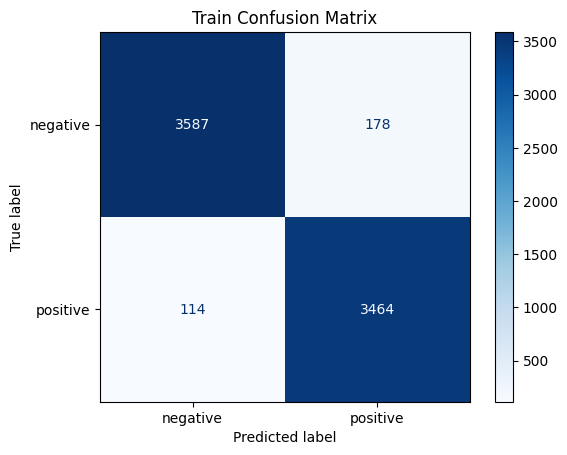


Test Confusion Matrix:


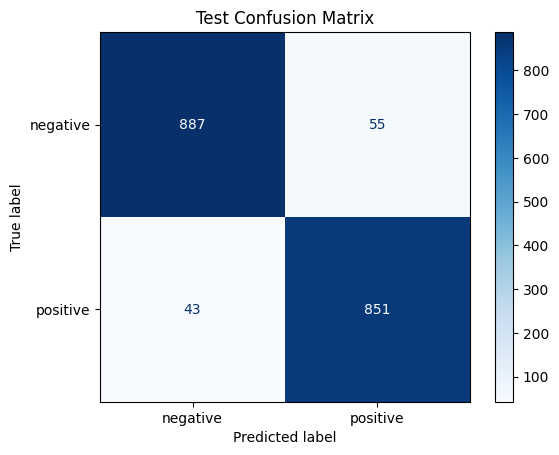


Train ROC-AUC Score: 0.9911


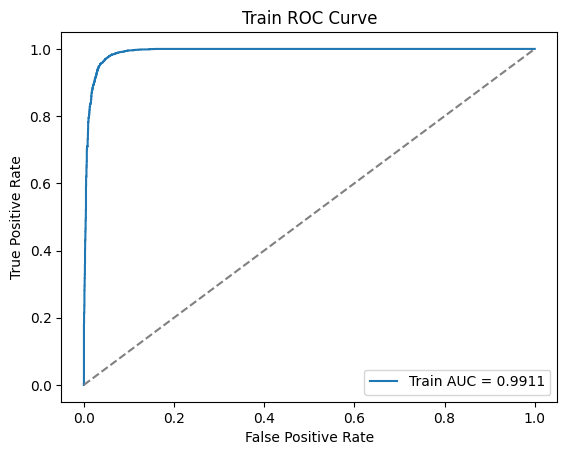


Test ROC-AUC Score: 0.9880


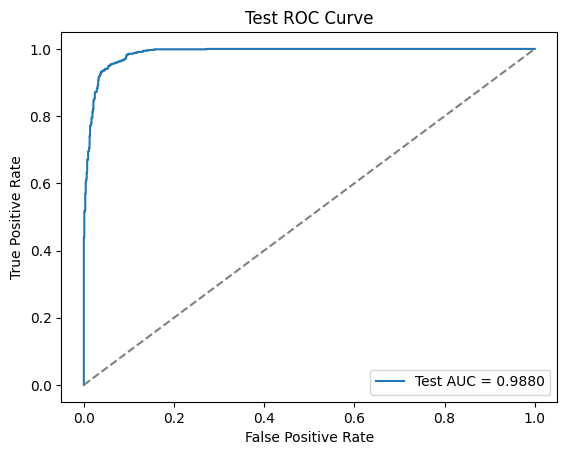


 ----------------------------------------


In [ ]:
# Evaluate the best model
train_and_eval(model=bmodel,
               trainX=tfidf_X_train,
               trainY=y_train,
               testX=tfidf_X_test,
               testY=y_test)

## 2.2.DistilBert

In [ ]:
pip install datasets

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.9/73.9 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 503.6/503.6 kB 29.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.7/119.7 kB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 146.7/146.7 kB 15.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.4/194.4 kB 21.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 100.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 241.8/241.8 kB 27.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.4/224.4 kB 23.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 355.6/355.6 kB 37.0 MB/s eta 0:00:00


In [ ]:
import torch
from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split
from datasets import Dataset
from transformers import AutoTokenizer, AutoModelForSequenceClassification, DataCollatorWithPadding, get_scheduler
from torch.optim import AdamW
from tqdm import tqdm

# ===== 1. Chuẩn bị data =====
label2id = {"negative": 0, "positive": 1}
df_temp["labels"] = df_temp["target"].map(label2id)

df_train, df_val = train_test_split(
    df_temp, test_size=0.2, random_state=42, stratify=df_temp["labels"]
)

train_dataset = Dataset.from_pandas(df_train)
eval_dataset  = Dataset.from_pandas(df_val)

# ===== 2. Tokenizer =====
checkpoint = "distilbert-base-uncased"
tokenizer = AutoTokenizer.from_pretrained(checkpoint)

def tokenize_fn(batch):
    return tokenizer(
        batch["clean_review"],
        truncation=True,
        padding="max_length",
        max_length=128
    )

train_dataset = train_dataset.map(tokenize_fn, batched=True)
eval_dataset  = eval_dataset.map(tokenize_fn, batched=True)

train_dataset.set_format(type="torch", columns=["input_ids", "attention_mask", "labels"])
eval_dataset.set_format(type="torch", columns=["input_ids", "attention_mask", "labels"])

# ===== 3. DataLoader =====
data_collator = DataCollatorWithPadding(tokenizer=tokenizer)

train_dataloader = DataLoader(train_dataset, shuffle=True, batch_size=16, collate_fn=data_collator)
eval_dataloader  = DataLoader(eval_dataset, batch_size=16, collate_fn=data_collator)

# ===== 4. Model =====: VIẾT CHƯƠNG 3 THÌ TỪ ĐÂY NHA THƯƠNG
model = AutoModelForSequenceClassification.from_pretrained(
    checkpoint,
    num_labels=2,
    id2label={0: "negative", 1: "positive"},
    label2id={"negative": 0, "positive": 1},
)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# ===== 5. Optimizer + Scheduler =====
optimizer = AdamW(model.parameters(), lr=5e-5)

num_epochs = 2
num_training_steps = num_epochs * len(train_dataloader)

lr_scheduler = get_scheduler(
    "linear",
    optimizer=optimizer,
    num_warmup_steps=0,
    num_training_steps=num_training_steps,
)

# ===== 6. Training Loop =====
progress_bar = tqdm(range(num_training_steps))

for epoch in range(num_epochs):
    model.train()
    for batch in train_dataloader:
        batch = {k: v.to(device) for k, v in batch.items()}
        outputs = model(**batch)
        loss = outputs.loss

        loss.backward()
        optimizer.step()
        lr_scheduler.step()
        optimizer.zero_grad()
        progress_bar.update(1)

    # Validation
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for batch in eval_dataloader:
            batch = {k: v.to(device) for k, v in batch.items()}
            outputs = model(**batch)
            predictions = torch.argmax(outputs.logits, dim=-1)
            correct += (predictions == batch["labels"]).sum().item()
            total += batch["labels"].size(0)
    acc = correct / total
    print(f"Epoch {epoch+1}: Validation Accuracy = {acc:.4f}")


/usr/local/lib/python3.12/dist-packages/torch_xla/experimental/gru.py:113: SyntaxWarning: invalid escape sequence '\_'
  * **h_n**: tensor of shape :math:`(D * \text{num\_layers}, H_{out})` or
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

Map:   0%|          | 0/7258 [00:00<?, ? examples/s]

Map:   0%|          | 0/1815 [00:00<?, ? examples/s]

/usr/local/lib/python3.12/dist-packages/jax/_src/cloud_tpu_init.py:82: UserWarning: Transparent hugepages are not enabled. TPU runtime startup and shutdown time should be significantly improved on TPU v5e and newer. If not already set, you may need to enable transparent hugepages in your VM image (sudo sh -c "echo always > /sys/kernel/mm/transparent_hugepage/enabled")
  warnings.warn(


model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
 50%|█████     | 454/908 [05:41<05:52,  1.29it/s]

Epoch 1: Validation Accuracy = 0.9372


100%|██████████| 908/908 [11:19<00:00,  1.66it/s]

Epoch 2: Validation Accuracy = 0.9405


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, ConfusionMatrixDisplay, roc_curve
import matplotlib.pyplot as plt
import torch

def evaluate_model(model, dataloader, device, set_name="Eval"):
    model.eval()
    preds = []
    labels = []
    probs = []

    with torch.no_grad():
        for batch in dataloader:
            batch = {k: v.to(device) for k, v in batch.items()}
            outputs = model(**batch)

            logits = outputs.logits
            predictions = torch.argmax(logits, dim=-1)

            preds.extend(predictions.cpu().numpy())
            labels.extend(batch["labels"].cpu().numpy())
            probs.extend(torch.softmax(logits, dim=-1)[:,1].cpu().numpy())

    # classification report
    print(f"\n=== {set_name} Classification Report ===")
    print(classification_report(labels, preds, target_names=["negative","positive"]))

    # confusion matrix
    cm = confusion_matrix(labels, preds)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["negative","positive"])
    disp.plot(cmap=plt.cm.Blues)
    plt.title(f"{set_name} Confusion Matrix")
    plt.show()

    # ROC-AUC + ROC Curve
    roc_auc = roc_auc_score(labels, probs)
    fpr, tpr, _ = roc_curve(labels, probs)

    print(f"{set_name} ROC-AUC Score: {roc_auc:.4f}")

    plt.figure()
    plt.plot(fpr, tpr, label=f"AUC = {roc_auc:.4f}")
    plt.plot([0, 1], [0, 1], linestyle="--", color="gray")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(f"{set_name} ROC Curve")
    plt.legend(loc="lower right")
    plt.show()


THẢO MIE COI BẢN DƯỚI ĐÂY


=== Train Classification Report ===
              precision    recall  f1-score   support

    negative       0.98      0.96      0.97      3723
    positive       0.96      0.97      0.97      3535

    accuracy                           0.97      7258
   macro avg       0.97      0.97      0.97      7258
weighted avg       0.97      0.97      0.97      7258



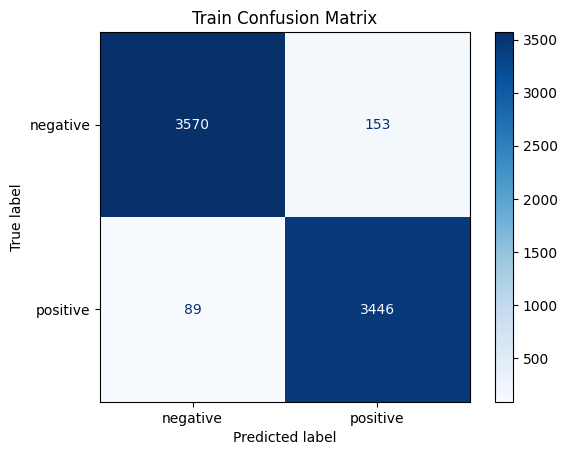

Train ROC-AUC Score: 0.9964


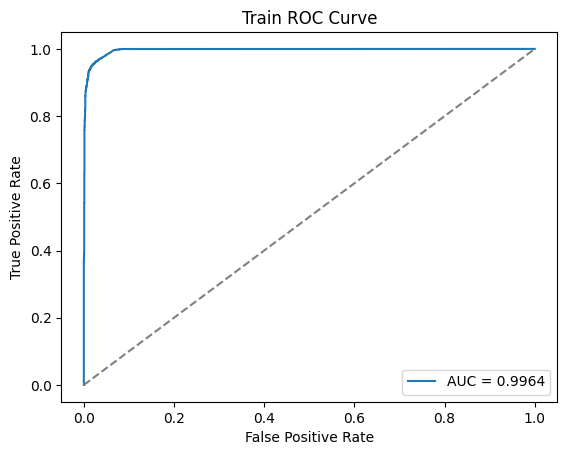


=== Validation Classification Report ===
              precision    recall  f1-score   support

    negative       0.96      0.93      0.94       931
    positive       0.93      0.95      0.94       884

    accuracy                           0.94      1815
   macro avg       0.94      0.94      0.94      1815
weighted avg       0.94      0.94      0.94      1815



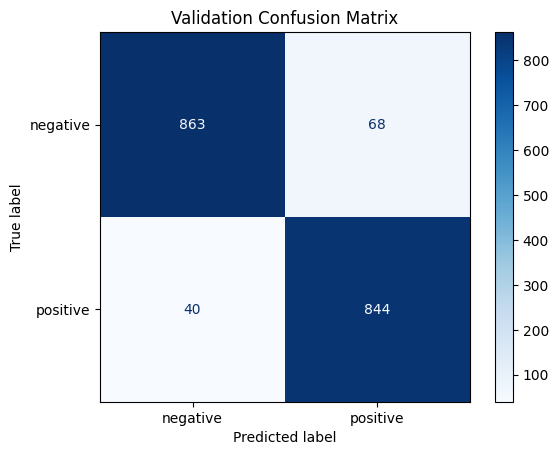

Validation ROC-AUC Score: 0.9881


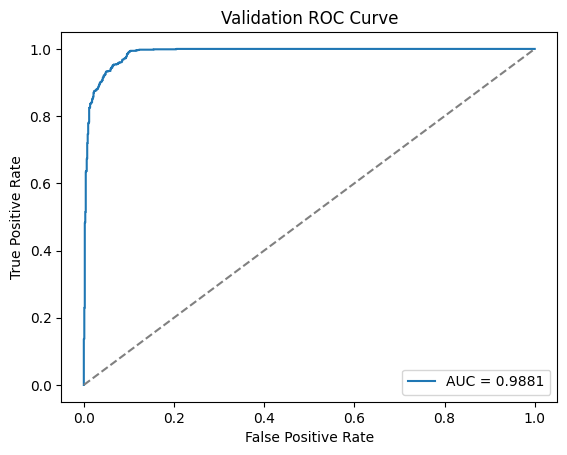

In [ ]:
evaluate_model(model, train_dataloader, device, set_name="Train")
evaluate_model(model, eval_dataloader, device, set_name="Validation")


In [ ]:
# Chọn folder để lưu
output_dir = "./distilbert_sentiment"

# Lưu model và tokenizer
model.save_pretrained(output_dir)
tokenizer.save_pretrained(output_dir)

print(f"✅ Model & tokenizer đã được lưu tại: {output_dir}")


✅ Model & tokenizer đã được lưu tại: ./distilbert_sentiment


In [ ]:
import shutil
from google.colab import files

# Nén folder distilbert_sentiment thành zip
shutil.make_archive("distilbert_sentiment", 'zip', "./distilbert_sentiment")

# Tải về máy
files.download("distilbert_sentiment.zip")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Predict

In [ ]:
from transformers import AutoModelForSequenceClassification, AutoTokenizer, pipeline

# Load từ folder đã lưu
model = AutoModelForSequenceClassification.from_pretrained("./distilbert_sentiment")
tokenizer = AutoTokenizer.from_pretrained("./distilbert_sentiment")

# Tạo pipeline để dự đoán
classifier = pipeline("text-classification", model=model, tokenizer=tokenizer)

Device set to use cpu


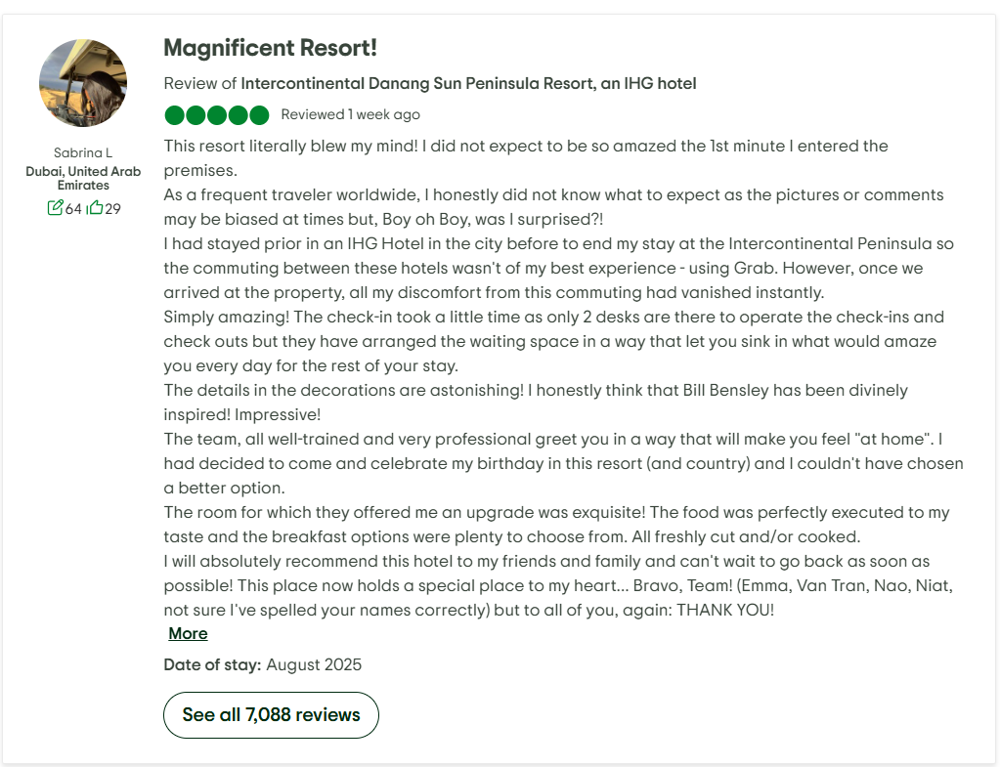

In [ ]:
# Test thử
review = """This resort literally blew my mind! I did not expect to be so amazed the 1st minute I entered the premises.
As a frequent traveler worldwide, I honestly did not know what to expect as the pictures or comments may be biased at times but, Boy oh Boy, was I surprised?!
I had stayed prior in an IHG Hotel in the city before to end my stay at the Intercontinental Peninsula so the commuting between these hotels wasn't of my best experience - using Grab. However, once we arrived at the property, all my discomfort from this commuting had vanished instantly.
Simply amazing! The check-in took a little time as only 2 desks are there to operate the check-ins and check outs but they have arranged the waiting space in a way that let you sink in what would amaze you every day for the rest of your stay.
The details in the decorations are astonishing! I honestly think that Bill Bensley has been divinely inspired! Impressive!
The team, all well-trained and very professional greet you in a way that will make you feel "at home". I had decided to come and celebrate my birthday in this resort (and country) and I couldn't have chosen a better option.
The room for which they offered me an upgrade was exquisite! The food was perfectly executed to my taste and the breakfast options were plenty to choose from. All freshly cut and/or cooked.
I will absolutely recommend this hotel to my friends and family and can't wait to go back as soon as possible! This place now holds a special place to my heart... Bravo, Team! (Emma, Van Tran, Nao, Niat, not sure I've spelled your names correctly) but to all of you, again: THANK YOU!
"""

print(classifier(review))


[{'label': 'positive', 'score': 0.6425905823707581}]


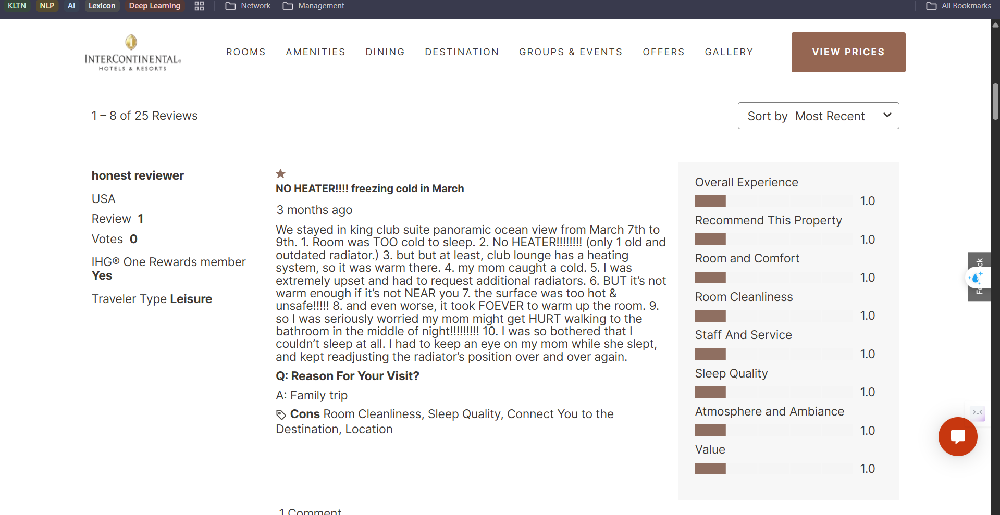

In [ ]:
# Test thử
review = """We stayed in king club suite panoramic ocean view from March 7th to 9th. 1. Room was TOO cold to sleep. 2. No HEATER!!!!!!!! (only 1 old and outdated radiator.) 3. but but at least, club lounge has a heating system, so it was warm there. 4. my mom caught a cold. 5. I was extremely upset and had to request additional radiators. 6. BUT it’s not warm enough if it’s not NEAR you 7. the surface was too hot & unsafe!!!!! 8. and even worse, it took FOEVER to warm up the room. 9. so I was seriously worried my mom might get HURT walking to the bathroom in the middle of night!!!!!!!!! 10. I was so bothered that I couldn’t sleep at all. I had to keep an eye on my mom while she slept, and kept readjusting the radiator’s position over and over again.
"""

print(classifier(review))


[{'label': 'negative', 'score': 0.9765022993087769}]


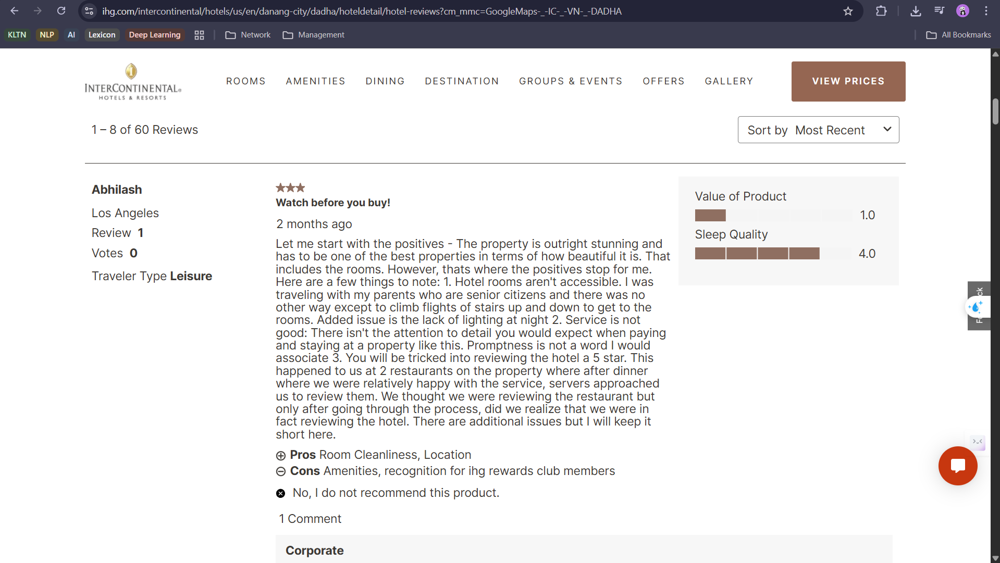

In [ ]:
# Test thử maybe 3-class is better, but it takes time to increase sample, which is only 33 neutral comments
review = """Let me start with the positives - The property is outright stunning and has to be one of the best properties in terms of how beautiful it is. That includes the rooms. However, thats where the positives stop for me. Here are a few things to note: 1. Hotel rooms aren't accessible. I was traveling with my parents who are senior citizens and there was no other way except to climb flights of stairs up and down to get to the rooms. Added issue is the lack of lighting at night 2. Service is not good: There isn't the attention to detail you would expect when paying and staying at a property like this. Promptness is not a word I would associate 3. You will be tricked into reviewing the hotel a 5 star. This happened to us at 2 restaurants on the property where after dinner where we were relatively happy with the service, servers approached us to review them. We thought we were reviewing the restaurant but only after going through the process, did we realize that we were in fact reviewing the hotel. There are additional issues but I will keep it short here.
"""

print(classifier(review))


[{'label': 'positive', 'score': 0.6016358733177185}]


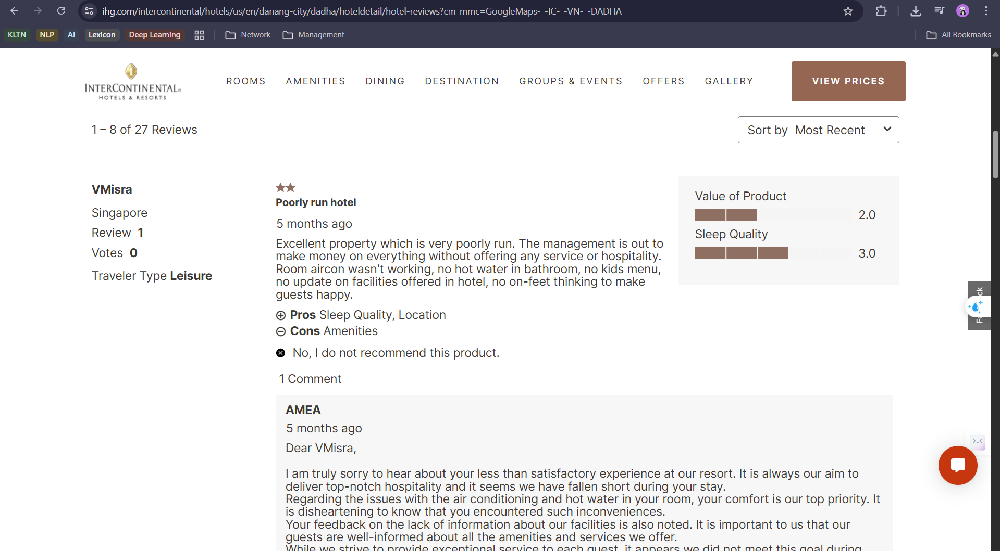

In [ ]:
# Test thử
review = """Excellent property which is very poorly run. The management is out to make money on everything without offering any service or hospitality. Room aircon wasn't working, no hot water in bathroom, no kids menu, no update on facilities offered in hotel, no on-feet thinking to make guests happy.
"""

print(classifier(review))


[{'label': 'negative', 'score': 0.6853593587875366}]


## 2.3.Aspect Extraction

### Identify key aspects

In [ ]:
pip install gensim

In [ ]:
import gensim.corpora as corpora
import ast

# Convert the string representation of lists back to lists
# The clean_review column contains string representation of lists
data_words = [ast.literal_eval(text) for text in df_temp['clean_review']]

# Create Dictionary
id2word = corpora.Dictionary(data_words)
# Create Corpus
texts = data_words
# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]
# View
print(corpus[:1][0][:30])

[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 1), (11, 1), (12, 1), (13, 2), (14, 1), (15, 1), (16, 1), (17, 1), (18, 1), (19, 1), (20, 1), (21, 1), (22, 2), (23, 1), (24, 1), (25, 1), (26, 1), (27, 1), (28, 1)]


In [ ]:
from gensim.models import LdaMulticore
from gensim.models import LdaModel
from pprint import pprint

# number of topics
num_topics = 10
# Build LDA model
lda_model = LdaMulticore(corpus=corpus, id2word=id2word,
                     num_topics=num_topics, iterations=400)
# Print the Keyword in the 10 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

[(0,
  '0.027*"hotel" + 0.022*"staff" + 0.017*"service" + 0.015*"room" + '
  '0.012*"stay" + 0.010*"resort" + 0.009*"kid" + 0.009*"great" + '
  '0.008*"restaurant" + 0.008*"good"'),
 (1,
  '0.027*"service" + 0.026*"staff" + 0.019*"great" + 0.015*"resort" + '
  '0.014*"good" + 0.013*"thank" + 0.012*"food" + 0.011*"restaurant" + '
  '0.011*"time" + 0.010*"family"'),
 (2,
  '0.017*"resort" + 0.014*"thank" + 0.013*"staff" + 0.012*"experience" + '
  '0.011*"great" + 0.010*"really" + 0.010*"service" + 0.010*"hotel" + '
  '0.009*"restaurant" + 0.009*"amazing"'),
 (3,
  '0.020*"staff" + 0.019*"resort" + 0.018*"service" + 0.010*"time" + '
  '0.010*"citron" + 0.009*"view" + 0.009*"good" + 0.009*"kind" + 0.009*"go" + '
  '0.008*"hotel"'),
 (4,
  '0.022*"hotel" + 0.020*"staff" + 0.014*"resort" + 0.012*"ugly" + '
  '0.012*"service" + 0.010*"food" + 0.010*"beautiful" + 0.009*"stay" + '
  '0.008*"bad" + 0.008*"beach"'),
 (5,
  '0.023*"service" + 0.017*"we" + 0.014*"staff" + 0.013*"great" + '
  '0.012

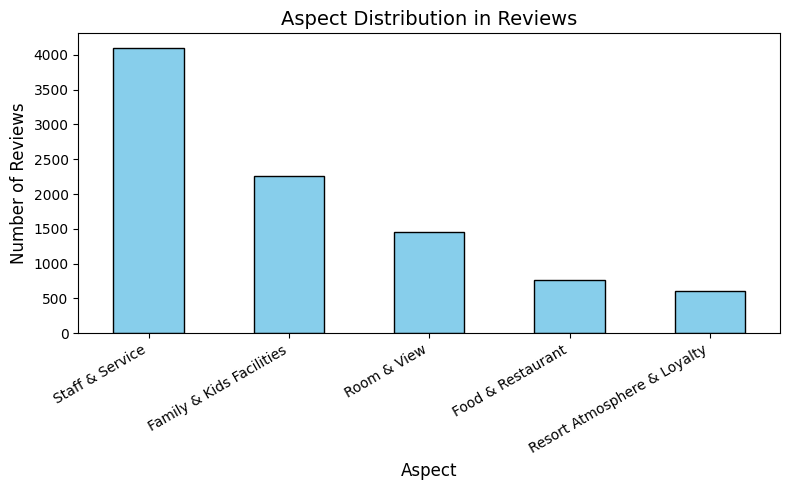

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# ===== 1️⃣ Gán 5 aspect chính =====
aspect_labels = {
    0: "Staff & Service",
    1: "Staff & Service",
    2: "Room & View",
    3: "Staff & Service",
    4: "Resort Atmosphere & Loyalty",
    5: "Room & View",
    6: "Family & Kids Facilities",
    7: "Staff & Service",
    8: "Food & Restaurant",
    9: "Family & Kids Facilities"
}

# ===== 2️⃣ Gán aspect cho từng review =====
doc_aspects = []
for bow in corpus:
    topic_probs = lda_model.get_document_topics(bow)
    main_topic = max(topic_probs, key=lambda x: x[1])[0]   # chọn topic có xác suất cao nhất
    aspect = aspect_labels[main_topic]
    doc_aspects.append(aspect)

# Giả sử bạn có DataFrame chứa review gốc
df_temp["Aspect"] = doc_aspects

# ===== 3️⃣ Vẽ biểu đồ tỷ lệ aspect =====
aspect_counts = df_temp["Aspect"].value_counts()

plt.figure(figsize=(8,5))
aspect_counts.plot(kind="bar", color="skyblue", edgecolor="black")
plt.title("Aspect Distribution in Reviews", fontsize=14)
plt.xlabel("Aspect", fontsize=12)
plt.ylabel("Number of Reviews", fontsize=12)
plt.xticks(rotation=30, ha='right')
plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd

# === 1️⃣ Aspect labels (mapping topic -> aspect)
aspect_labels = {
    0: "Staff & Service",
    1: "Staff & Service",
    2: "Room & View",
    3: "Staff & Service",
    4: "Resort Atmosphere & Loyalty",
    5: "Room & View",
    6: "Family & Kids Facilities",
    7: "Staff & Service",
    8: "Food & Restaurant",
    9: "Family & Kids Facilities"
}

# === 2️⃣ Tạo danh sách 5 aspect chính
aspects = list(set(aspect_labels.values()))

# === 3️⃣ Tạo cột nhị phân cho từng aspect
for aspect in aspects:
    col_name = f"reviewContext_{aspect.replace('&', '').replace(' ', '')}"
    df_temp[col_name] = 0

# === 4️⃣ Threshold để xác định review thuộc về aspect nào
THRESHOLD = 0.15   # bạn có thể điều chỉnh 0.1–0.2

# === 5️⃣ Với từng review: gán 1 nếu topic probability >= threshold
for i, bow in enumerate(corpus):
    topic_probs = lda_model.get_document_topics(bow)
    for topic_id, prob in topic_probs:
        if prob >= THRESHOLD:
            aspect = aspect_labels[topic_id]
            col = f"reviewContext_{aspect.replace('&', '').replace(' ', '')}"
            df_temp.loc[i, col] = 1

# === 6️⃣ Xem thử kết quả
df_temp.head()

,raw_clean_text,target,clean_review,Aspect,reviewContext_ResortAtmosphereLoyalty,reviewContext_StaffService,reviewContext_RoomView,reviewContext_FoodRestaurant,reviewContext_FamilyKidsFacilities
0,i had a business trip to da nang and chose con...,negative,"['business', 'trip', 'da', 'nang', 'choose', '...",Room & View,0,0,1,0,1
1,this was our first stay and we spent 5 days at...,negative,"['first', 'stay', 'spend', '5', 'day', 'marvel...",Family & Kids Facilities,0,1,0,0,1
2,tonight at the barefoot we shout out uyenle an...,positive,"['tonight', 'barefoot', 'shout', 'uyenle', 'an...",Staff & Service,0,1,1,0,1
3,amazing stay incredible service professional...,positive,"['amazing', 'stay', 'incredible', 'service', '...",Staff & Service,0,1,1,0,0
4,the food here is amazing and the view is so na...,negative,"['food', 'amazing', 'view', 'nasty', 'nearby',...",Family & Kids Facilities,0,0,0,1,1


https://bnaic2022.uantwerpen.be/wp-content/uploads/BNAICBeNeLearn_2022_submission_146.pdf?.com

https://arxiv.org/abs/2410.09807?.com

### Deploying Aspects Extraction

In [ ]:
import nltk
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


True

In [ ]:
import pandas as pd
file_path = "/content/processed_data.csv"
df_temp = pd.read_csv(file_path)

In [ ]:
!pip install sentence-transformers

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 486.6/486.6 kB 17.0 MB/s eta 0:00:00


In [ ]:
from sentence_transformers import SentenceTransformer, util
import pandas as pd
from nltk.tokenize import sent_tokenize
import re

# Load model
model = SentenceTransformer('all-MiniLM-L6-v2')

# Aspects
aspects = [
    "Room & Facilities",
    "Food & Beverage",
    "Service & Staff",
    "Location & Surroundings",
    "Overall Value / Experience"
]
aspect_embeddings = model.encode(aspects, convert_to_tensor=True)

# Hàm gán câu vào aspect nâng cấp
def assign_aspects_enhanced(text, threshold=0.35):
    # Validate input
    if not isinstance(text, str) or not text.strip():
        return {a: "" for a in aspects}

    # Clean text
    text_clean = re.sub(r"\s+", " ", text).strip()
    sentences = sent_tokenize(text_clean)  # chia câu chính xác

    # Batch encode sentences
    sentence_embeddings = model.encode(sentences, convert_to_tensor=True)

    result = {a: "" for a in aspects}

    # Cosine similarity giữa tất cả câu và aspect embeddings
    cos_scores = util.cos_sim(sentence_embeddings, aspect_embeddings)  # shape: [num_sentences, num_aspects]

    for i, s in enumerate(sentences):
        # Lấy tất cả aspect có score > threshold
        for j, a in enumerate(aspects):
            if cos_scores[i][j] >= threshold:
                result[a] += s + " "

    # Clean trailing spaces
    for k in result:
        result[k] = result[k].strip()
    return result

# Áp dụng
df_temp["aspect_json"] = df_temp["text_translated"].apply(assign_aspects_enhanced)

# Tách ra từng cột
for col in aspects:
    df_temp[col] = df_temp["aspect_json"].apply(lambda x: x.get(col, ""))

print(df_temp.head())


                 name            publishedAtDate reviewOrigin  \
0                 ABE  2025-07-28 00:00:00+07:00  Booking.com   
1       Hakuna Matata   2025-08-06T07:15:24.252Z       Google   
2  Money Never Sleeps   2025-07-10T04:36:00.647Z       Google   
3                 M R   2025-02-22T05:34:37.255Z       Google   
4          Sonara Hav   2025-04-05T08:27:19.903Z       Google   

                                            reviewId    reviewerId  stars  \
0                                                NaN           NaN    0.5   
1  Ci9DQUlRQUNvZENodHljRjlvT2tGMVlWaFNjRjlhTVhSbm...  1.150000e+20    1.0   
2  Ci9DQUlRQUNvZENodHljRjlvT21oZlZsOW9WRkpoU25aUm...  1.130000e+20    1.0   
3                ChZDSUhNMG9nS0VJQ0FnTURnaU4zZGJnEAE  1.170000e+20    1.0   
4               ChdDSUhNMG9nS0VJQ0FnTUNJbF9ienBRRRAB  1.030000e+20    1.0   

                                                text  \
0  Negative: レストラン、宿泊費が高過ぎ！サービスと価格がマッチしていないと強く感じた...   
1  The sale for event is not good.

In [ ]:
df_temp

,name,publishedAtDate,reviewOrigin,reviewId,reviewerId,stars,text,lower_text,language,text_translated,raw_clean_text,nlp_text,target,aspect_json,Room & Facilities,Food & Beverage,Service & Staff,Location & Surroundings,Overall Value / Experience
0,ABE,2025-07-28 00:00:00+07:00,Booking.com,NaN,NaN,0.5,Negative: レストラン、宿泊費が高過ぎ！サービスと価格がマッチしていないと強く感じた...,negative: レストラン、宿泊費が高過ぎ！サービスと価格がマッチしていないと強く感じた...,en,"Negative: Restaurant, accommodation costs too ...",negative restaurant accommodation costs too hi...,"['negative', 'restaurant', 'accommodation', 'c...",negative,"{'Room & Facilities': 'Negative: Restaurant, a...","Negative: Restaurant, accommodation costs too ...",| Positive: The restaurant food was delicious.,,,
1,Hakuna Matata,2025-08-06T07:15:24.252Z,Google,Ci9DQUlRQUNvZENodHljRjlvT2tGMVlWaFNjRjlhTVhSbm...,1.150000e+20,1.0,The sale for event is not good. She is unprofe...,the sale for event is not good. she is unprofe...,en,The sale for event is not good. She is unprofe...,the sale for event is not good she is unprofes...,"['sale', 'event', 'good', 'unprofessional', 'c...",negative,"{'Room & Facilities': '', 'Food & Beverage': '...",,,Sorry I am a bit tough for that.However when y...,,
2,Money Never Sleeps,2025-07-10T04:36:00.647Z,Google,Ci9DQUlRQUNvZENodHljRjlvT21oZlZsOW9WRkpoU25aUm...,1.130000e+20,1.0,I don't know what the benefits of IHG membersh...,i don't know what the benefits of ihg membersh...,en,I don't know what the benefits of IHG membersh...,i dont know what the benefits of ihg membershi...,"['do', 'not', 'know', 'benefit', 'ihg', 'membe...",negative,"{'Room & Facilities': '', 'Food & Beverage': '...",,,,,
3,M R,2025-02-22T05:34:37.255Z,Google,ChZDSUhNMG9nS0VJQ0FnTURnaU4zZGJnEAE,1.170000e+20,1.0,Stupid entry policy to simply go and drink at ...,stupid entry policy to simply go and drink at ...,en,Stupid entry policy to simply go and drink at ...,stupid entry policy to simply go and drink at ...,"['stupid', 'entry', 'policy', 'simply', 'go', ...",negative,"{'Room & Facilities': '', 'Food & Beverage': '...",,,,,
4,Sonara Hav,2025-04-05T08:27:19.903Z,Google,ChdDSUhNMG9nS0VJQ0FnTUNJbF9ienBRRRAB,1.030000e+20,1.0,Unhappy Experian here if you outside guests do...,unhappy experian here if you outside guests do...,en,Unhappy Experian here if you outside guests do...,unhappy experian here if you outside guests do...,"['unhappy', 'experian', 'outside', 'guest', 'd...",negative,{'Room & Facilities': 'We have breakfast there...,We have breakfast there and after breakfast we...,,,,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9889,Giovanni,1/20/2020,Tripadvisor,NaN,NaN,5.0,My family's stay at the Intercontinental Danan...,my family's stay at the intercontinental danan...,en,My family's stay at the Intercontinental Danan...,my familys stay at the intercontinental danang...,"['family', 'stay', 'intercontinental', 'danang...",positive,{'Room & Facilities': 'We were brought out to ...,We were brought out to the main lobby area tha...,There was a lot of Asian food selections to be...,The beach and the pools were outstanding and t...,We were brought out to the main lobby area tha...,
9890,ptrck2,1/20/2020,Tripadvisor,NaN,NaN,5.0,키즈 클럽이 이 정도로 도움이 될 줄은 몰랐네요.\n\n보통 아이를 맡겨두는 방 정...,키즈 클럽이 이 정도로 도움이 될 줄은 몰랐네요.\n\n보통 아이를 맡겨두는 방 정...,en,I didn't know that the kids club would help th...,i didnt know that the kids club would help thi...,"['do', 'not', 'know', 'kid', 'club', 'would', ...",positive,{'Room & Facilities': 'I usually think of it a...,I usually think of it as a room to leave a child.,,,,
9891,NaN,1/19/2020,Tripadvisor,NaN,NaN,5.0,越南还没有米其林餐厅、这家1888意大利餐厅味道超赞同比米其林三星。环境优美！服务热情、每道...,越南还没有米其林餐厅、这家1888意大利餐厅味道超赞同比米其林三星。环境优美！服务热情、每道...,en,"There is no Michelin restaurant in Vietnam, an...",there is no michelin restaurant in vietnam and...,"['michelin', 'restaurant', 'vietnam', '1888', ...",positive,"{'Room & Facilities': '', 'Food & Beverage': '...",,,,Beautiful environment!,
9892,saranyaa r,1/19/2020,Tr

In [ ]:
from sentence_transformers import util
import torch
import pandas as pd

scores = {a: [] for a in aspects}

for idx, row in df_temp.iterrows():
    for a in aspects:
        if row[a]:  # nếu có câu gán
            sent_emb = model.encode(row[a], convert_to_tensor=True)
            aspect_emb = model.encode(a, convert_to_tensor=True)
            score = util.cos_sim(sent_emb, aspect_emb).item()
            scores[a].append(score)

# Tính mean score cho từng aspect
mean_scores = {a: sum(scores[a])/len(scores[a]) if scores[a] else 0 for a in aspects}
print("Mean cosine similarity per aspect:")
print(mean_scores)

# Tính mean tổng thể
all_scores = [s for l in scores.values() for s in l]
print("Overall mean cosine similarity:", sum(all_scores)/len(all_scores))


Mean cosine similarity per aspect:
{'Room & Facilities': 0.44565032672120575, 'Food & Beverage': 0.4171001692731937, 'Service & Staff': 0.4685417333518397, 'Location & Surroundings': 0.40834960847041524, 'Overall Value / Experience': 0.3964825056645335}
Overall mean cosine similarity: 0.43992989710700825


In [ ]:
df_temp

,name,publishedAtDate,reviewOrigin,reviewId,reviewerId,stars,text,lower_text,language,text_translated,raw_clean_text,nlp_text,target,aspect_json,Room & Facilities,Food & Beverage,Service & Staff,Location & Surroundings,Overall Value / Experience
0,ABE,2025-07-28 00:00:00+07:00,Booking.com,NaN,NaN,0.5,Negative: レストラン、宿泊費が高過ぎ！サービスと価格がマッチしていないと強く感じた...,negative: レストラン、宿泊費が高過ぎ！サービスと価格がマッチしていないと強く感じた...,en,"Negative: Restaurant, accommodation costs too ...",negative restaurant accommodation costs too hi...,"['negative', 'restaurant', 'accommodation', 'c...",negative,"{'Room & Facilities': 'Negative: Restaurant, a...","Negative: Restaurant, accommodation costs too ...",| Positive: The restaurant food was delicious.,,,
1,Hakuna Matata,2025-08-06T07:15:24.252Z,Google,Ci9DQUlRQUNvZENodHljRjlvT2tGMVlWaFNjRjlhTVhSbm...,1.150000e+20,1.0,The sale for event is not good. She is unprofe...,the sale for event is not good. she is unprofe...,en,The sale for event is not good. She is unprofe...,the sale for event is not good she is unprofes...,"['sale', 'event', 'good', 'unprofessional', 'c...",negative,"{'Room & Facilities': '', 'Food & Beverage': '...",,,Sorry I am a bit tough for that.However when y...,,
2,Money Never Sleeps,2025-07-10T04:36:00.647Z,Google,Ci9DQUlRQUNvZENodHljRjlvT21oZlZsOW9WRkpoU25aUm...,1.130000e+20,1.0,I don't know what the benefits of IHG membersh...,i don't know what the benefits of ihg membersh...,en,I don't know what the benefits of IHG membersh...,i dont know what the benefits of ihg membershi...,"['do', 'not', 'know', 'benefit', 'ihg', 'membe...",negative,"{'Room & Facilities': '', 'Food & Beverage': '...",,,,,
3,M R,2025-02-22T05:34:37.255Z,Google,ChZDSUhNMG9nS0VJQ0FnTURnaU4zZGJnEAE,1.170000e+20,1.0,Stupid entry policy to simply go and drink at ...,stupid entry policy to simply go and drink at ...,en,Stupid entry policy to simply go and drink at ...,stupid entry policy to simply go and drink at ...,"['stupid', 'entry', 'policy', 'simply', 'go', ...",negative,"{'Room & Facilities': '', 'Food & Beverage': '...",,,,,
4,Sonara Hav,2025-04-05T08:27:19.903Z,Google,ChdDSUhNMG9nS0VJQ0FnTUNJbF9ienBRRRAB,1.030000e+20,1.0,Unhappy Experian here if you outside guests do...,unhappy experian here if you outside guests do...,en,Unhappy Experian here if you outside guests do...,unhappy experian here if you outside guests do...,"['unhappy', 'experian', 'outside', 'guest', 'd...",negative,{'Room & Facilities': 'We have breakfast there...,We have breakfast there and after breakfast we...,,,,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9889,Giovanni,1/20/2020,Tripadvisor,NaN,NaN,5.0,My family's stay at the Intercontinental Danan...,my family's stay at the intercontinental danan...,en,My family's stay at the Intercontinental Danan...,my familys stay at the intercontinental danang...,"['family', 'stay', 'intercontinental', 'danang...",positive,{'Room & Facilities': 'We were brought out to ...,We were brought out to the main lobby area tha...,There was a lot of Asian food selections to be...,The beach and the pools were outstanding and t...,We were brought out to the main lobby area tha...,
9890,ptrck2,1/20/2020,Tripadvisor,NaN,NaN,5.0,키즈 클럽이 이 정도로 도움이 될 줄은 몰랐네요.\n\n보통 아이를 맡겨두는 방 정...,키즈 클럽이 이 정도로 도움이 될 줄은 몰랐네요.\n\n보통 아이를 맡겨두는 방 정...,en,I didn't know that the kids club would help th...,i didnt know that the kids club would help thi...,"['do', 'not', 'know', 'kid', 'club', 'would', ...",positive,{'Room & Facilities': 'I usually think of it a...,I usually think of it as a room to leave a child.,,,,
9891,NaN,1/19/2020,Tripadvisor,NaN,NaN,5.0,越南还没有米其林餐厅、这家1888意大利餐厅味道超赞同比米其林三星。环境优美！服务热情、每道...,越南还没有米其林餐厅、这家1888意大利餐厅味道超赞同比米其林三星。环境优美！服务热情、每道...,en,"There is no Michelin restaurant in Vietnam, an...",there is no michelin restaurant in vietnam and...,"['michelin', 'restaurant', 'vietnam', '1888', ...",positive,"{'Room & Facilities': '', 'Food & Beverage': '...",,,,Beautiful environment!,
9892,saranyaa r,1/19/2020,Tr

/tmp/ipython-input-231359068.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=aspect_counts.index, y=aspect_counts.values, palette='viridis')


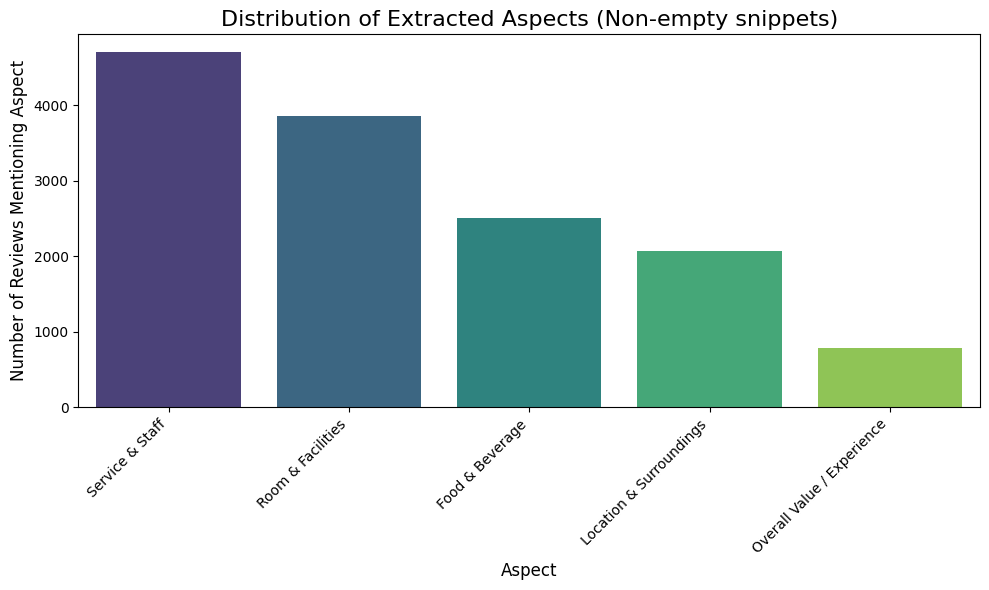

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define the aspect columns from the current df_temp structure
aspect_cols = [
    "Room & Facilities",
    "Food & Beverage",
    "Service & Staff",
    "Location & Surroundings",
    "Overall Value / Experience"
]

# Count non-empty values in each aspect column
# This indicates how many reviews have extracted text for each aspect
aspect_counts = df_temp[aspect_cols].apply(lambda x: (x.astype(str).str.strip() != "").sum()).sort_values(ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x=aspect_counts.index, y=aspect_counts.values, palette='viridis')
plt.title('Distribution of Extracted Aspects (Non-empty snippets)', fontsize=16)
plt.xlabel('Aspect', fontsize=12)
plt.ylabel('Number of Reviews Mentioning Aspect', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [ ]:
df_temp.to_csv("df_temp.csv", index=False, encoding="utf-8-sig")

## 2.4.Aspect Based Sentiment Analysis

In [ ]:
import pandas as pd
file_path = "/content/df_temp.csv"
df_temp = pd.read_csv(file_path)

In [ ]:
import zipfile
import os

zip_path = "/content/distilbert_sentiment.zip"
extract_dir = "/content/distilbert_sentiment"

with zipfile.ZipFile(zip_path, "r") as zip_ref:
    zip_ref.extractall(extract_dir)


In [ ]:
# Install & imports
!pip install --upgrade torch transformers sentencepiece pandas tqdm spacy
!python -m spacy download en_core_web_sm # Ensure spacy model is downloaded
!pip install nltk

import torch
from transformers import AutoTokenizer, AutoModelForSequenceClassification
import pandas as pd
import spacy
from tqdm import tqdm
from nltk.corpus import stopwords
import nltk
import re
import string

# Ensure NLTK stopwords are downloaded
try:
    nltk.data.find('corpora/stopwords')
except nltk.downloader.DownloadError:
    nltk.download('stopwords')
except LookupError:
    nltk.download('stopwords')

# ===== Load model =====
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_path = "./distilbert_sentiment"  # folder chứa model
tokenizer = AutoTokenizer.from_pretrained(model_path)
model = AutoModelForSequenceClassification.from_pretrained(model_path)
model.to(device)
model.eval()

# ===== Aspect columns =====
aspect_cols = [
    "Room & Facilities",
    "Food & Beverage",
    "Service & Staff",
    "Location & Surroundings",
    "Overall Value / Experience"
]

# ===== Preprocessing: lowercase, punctuation, stopwords + lemmatization =====
stop_words = set(stopwords.words('english'))
sp = spacy.load("en_core_web_sm")

def preprocess_snippet(text):
    if not isinstance(text, str) or not text.strip():
        return ""

    text = text.lower() # Convert to lowercase

    # Remove punctuation
    text = text.translate(str.maketrans('', '', string.punctuation))

    # Remove extra whitespace
    text = re.sub(r'\s+', ' ', text).strip()

    words = text.split() # Split into words

    # Remove stopwords
    words = [w for w in words if w not in stop_words]

    # Lemmatization
    doc = sp(" ".join(words))
    lemmas = [token.lemma_ for token in doc]

    return " ".join(lemmas)

# Apply preprocessing directly on aspect snippets
for col in tqdm(aspect_cols, desc="Preprocessing snippets"):
    # Apply preprocessing to the original aspect columns, not the clean ones if they exist
    # This ensures we preprocess the extracted snippets each time
    df_temp[col + "_clean"] = df_temp[col].apply(preprocess_snippet)

# ===== Predict sentiment =====
def predict_sentiment(text):
    if not text.strip():
        return None
    inputs = tokenizer(text, return_tensors="pt", truncation=True, padding=True).to(device)
    with torch.no_grad():
        logits = model(**inputs).logits
    # Corrected: Assign the predicted class ID to the variable
    predicted_class_id = torch.argmax(logits, dim=-1).item()
    # Map the predicted class ID back to your desired sentiment label (1 for positive, 2 for negative)
    # Based on your previous training code where label2id = {"negative": 0, "positive": 1},
    # 0 maps to negative, 1 maps to positive.
    # If you want 1 for positive and 2 for negative as the output labels:
    return 1 if predicted_class_id == 1 else 2 # 1 for positive, 2 for negative


# Gán sentiment cho từng aspect
# Initialize sentiment columns with None or a default value if they don't exist
for col in aspect_cols:
     if (col + "_sentiment") not in df_temp.columns:
         df_temp[col + "_sentiment"] = None

# Iterate over rows and columns to predict sentiment for each snippet
for index, row in tqdm(df_temp.iterrows(), total=df_temp.shape[0], desc="Predicting Aspect Sentiment"):
    for col in aspect_cols:
        sentiment_col = col + "_sentiment"
        # Use the cleaned snippet for prediction
        snippet = row[col + "_clean"]
        df_temp.at[index, sentiment_col] = predict_sentiment(snippet)


# Xem kết quả
print(df_temp[aspect_cols + [c + "_sentiment" for c in aspect_cols]].head())

# Lưu file cuối
# Make sure the output filename is distinct if you want to keep previous versions
df_temp.to_csv("df_with_aspect_sentiment_nlp_v2.csv", index=False) # Changed filename
print("✅ File saved: df_with_aspect_sentiment_nlp_v2.csv")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 209.5 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


Predicting Aspect Sentiment: 100%|██████████| 9894/9894 [01:59<00:00, 82.58it/s]


                                   Room & Facilities  \
0  Negative: Restaurant, accommodation costs too ...   
1                                                NaN   
2                                                NaN   
3                                                NaN   
4  We have breakfast there and after breakfast we...   

                                  Food & Beverage  \
0  | Positive: The restaurant food was delicious.   
1                                             NaN   
2                                             NaN   
3                                             NaN   
4                                             NaN   

                                     Service & Staff Location & Surroundings  \
0                                                NaN                     NaN   
1  Sorry I am a bit tough for that.However when y...                     NaN   
2                                                NaN                     NaN   
3                       

In [ ]:
df_temp

,name,publishedAtDate,reviewOrigin,reviewId,reviewerId,stars,text,lower_text,language,text_translated,...,Room & Facilities_clean,Food & Beverage_clean,Service & Staff_clean,Location & Surroundings_clean,Overall Value / Experience_clean,Room & Facilities_sentiment,Food & Beverage_sentiment,Service & Staff_sentiment,Location & Surroundings_sentiment,Overall Value / Experience_sentiment
0,ABE,2025-07-28 00:00:00+07:00,Booking.com,NaN,NaN,0.5,Negative: レストラン、宿泊費が高過ぎ！サービスと価格がマッチしていないと強く感じた...,negative: レストラン、宿泊費が高過ぎ！サービスと価格がマッチしていないと強く感じた...,en,"Negative: Restaurant, accommodation costs too ...",...,negative restaurant accommodation cost high,positive restaurant food delicious,,,,2,1,None,None,None
1,Hakuna Matata,2025-08-06T07:15:24.252Z,Google,Ci9DQUlRQUNvZENodHljRjlvT2tGMVlWaFNjRjlhTVhSbm...,1.150000e+20,1.0,The sale for event is not good. She is unprofe...,the sale for event is not good. she is unprofe...,en,The sale for event is not good. She is unprofe...,...,,,sorry bit tough thathowever high service get o...,,,None,None,2,None,None
2,Money Never Sleeps,2025-07-10T04:36:00.647Z,Google,Ci9DQUlRQUNvZENodHljRjlvT21oZlZsOW9WRkpoU25aUm...,1.130000e+20,1.0,I don't know what the benefits of IHG membersh...,i don't know what the benefits of ihg membersh...,en,I don't know what the benefits of IHG membersh...,...,,,,,,None,None,None,None,None
3,M R,2025-02-22T05:34:37.255Z,Google,ChZDSUhNMG9nS0VJQ0FnTURnaU4zZGJnEAE,1.170000e+20,1.0,Stupid entry policy to simply go and drink at ...,stupid entry policy to simply go and drink at ...,en,Stupid entry policy to simply go and drink at ...,...,,,,,,None,None,None,None,None
4,Sonara Hav,2025-04-05T08:27:19.903Z,Google,ChdDSUhNMG9nS0VJQ0FnTUNJbF9ienBRRRAB,1.030000e+20,1.0,Unhappy Experian here if you outside guests do...,unhappy experian here if you outside guests do...,en,Unhappy Experian here if you outside guests do...,...,breakfast breakfast drink beach want use stand...,,,,,1,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9889,Giovanni,1/20/2020,Tripadvisor,NaN,NaN,5.0,My family's stay at the Intercontinental Danan...,my family's stay at the intercontinental danan...,en,My family's stay at the Intercontinental Danan...,...,bring main lobby area amazing view ocean huge ...,lot asian food selection citron buffet style,beach pool outstanding customer service wait s...,bring main lobby area amazing view ocean huge ...,,1,1,1,1,None
9890,ptrck2,1/20/2020,Tripadvisor,NaN,NaN,5.0,키즈 클럽이 이 정도로 도움이 될 줄은 몰랐네요.\n\n보통 아이를 맡겨두는 방 정...,키즈 클럽이 이 정도로 도움이 될 줄은 몰랐네요.\n\n보통 아이를 맡겨두는 방 정...,en,I didn't know that the kids club would help th...,...,usually think room leave child,,,,,2,None,None,None,None
9891,NaN,1/19/2020,Tripadvisor,NaN,NaN,5.0,越南还没有米其林餐厅、这家1888意大利餐厅味道超赞同比米其林三星。环境优美！服务热情、每道...,越南还没有米其林餐厅、这家1888意大利餐厅味道超赞同比米其林三星。环境优美！服务热情、每道...,en,"There is no Michelin restaurant in Vietnam, an...",...,,,,beautiful environment,,None,None,None,1,None
9892,saranyaa r,1/19/2020,Tripadvisor,NaN,NaN,5.0,We was celebrated our 1st wedding anniversary ...,we was celebrated our 1st wedding anniversary ...,en,We was celebrated our 1st wedding anniversary ...,...,hotel situate hill side monkey bay also thi lo...,provide we bottle wine hand write personalize ...,service really outstanding,,,1,1,1,None,None


✅ Count of sentiment per aspect:


,Room & Facilities_sentiment,Food & Beverage_sentiment,Service & Staff_sentiment,Location & Surroundings_sentiment,Overall Value / Experience_sentiment
None,6043,7389,5191,7825,9110
Positive,3626,2404,4460,1955,737
Negative,225,101,243,114,47


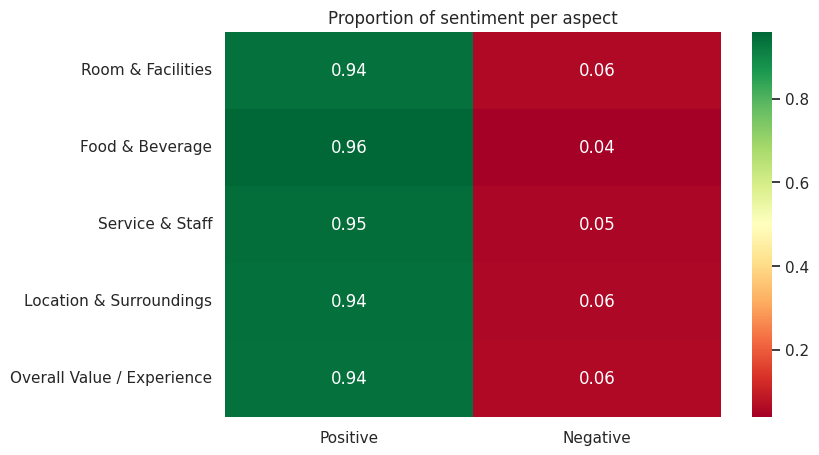


Generating Word Clouds from Cleaned Text:


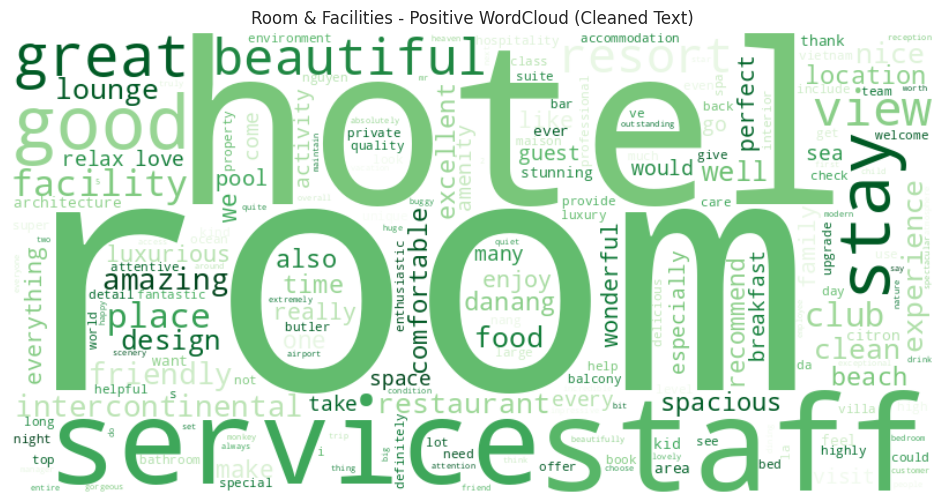

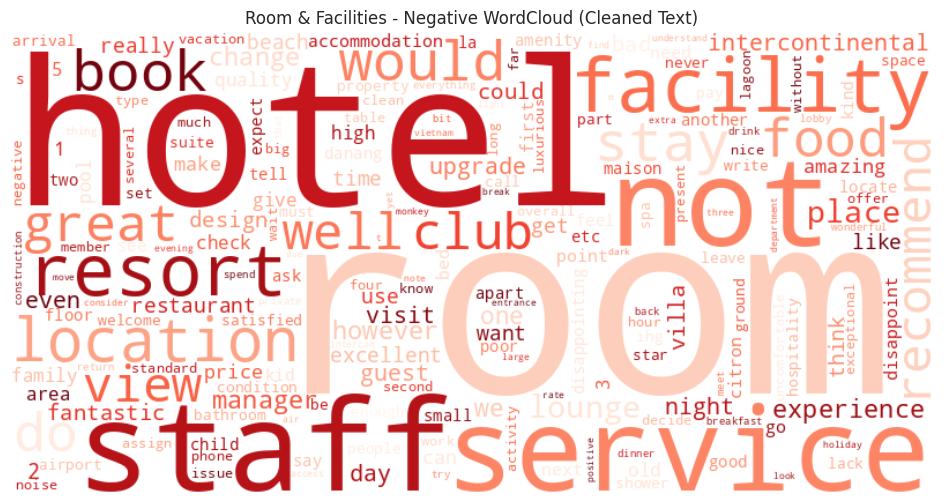

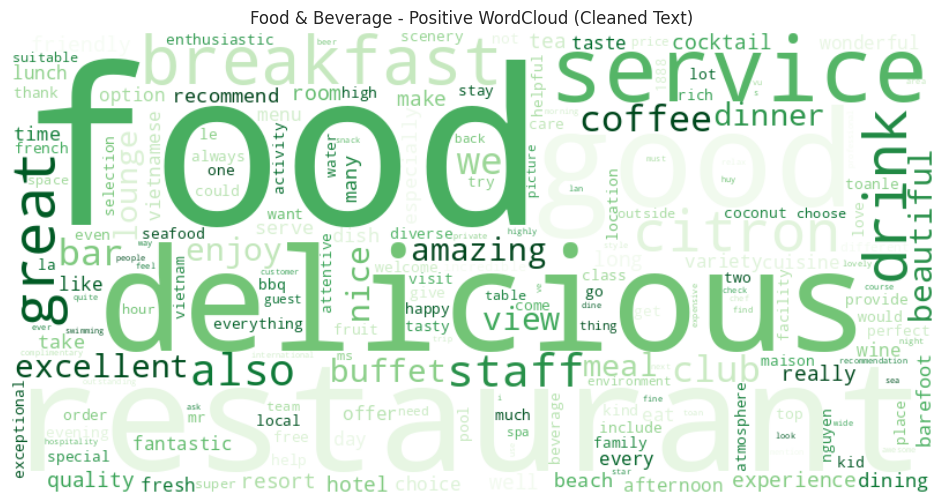

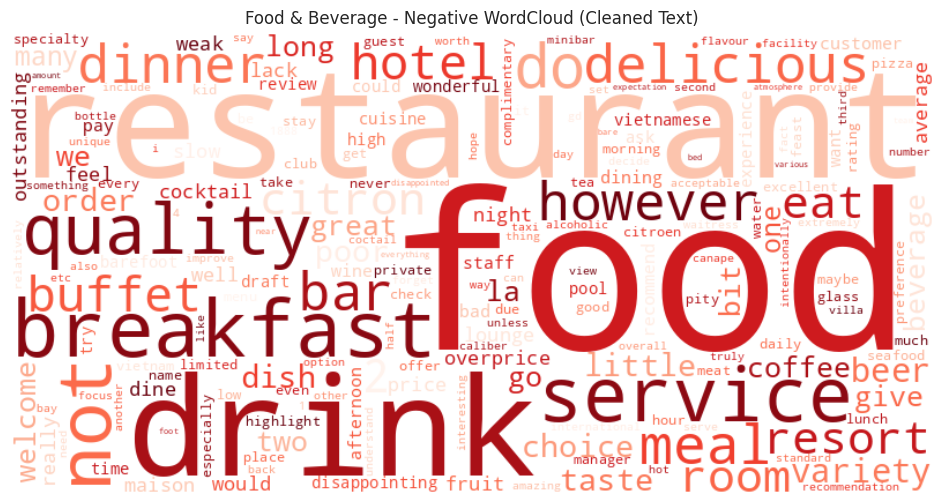

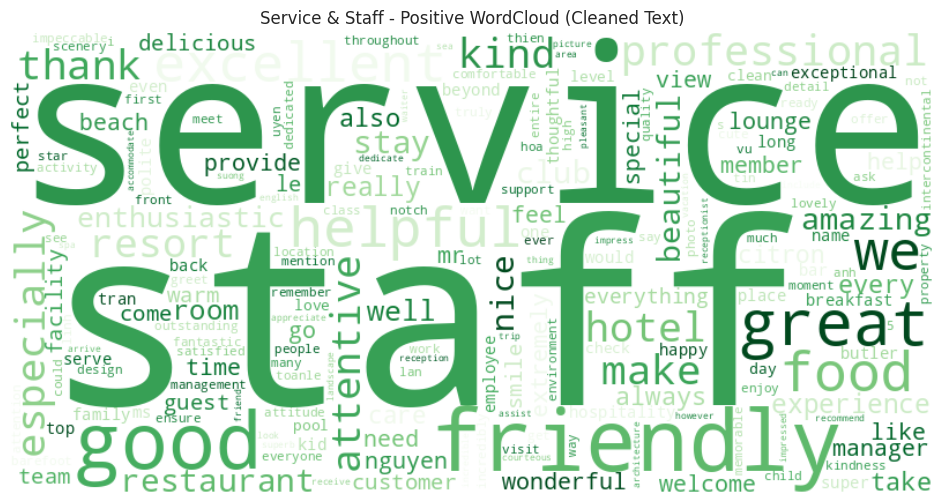

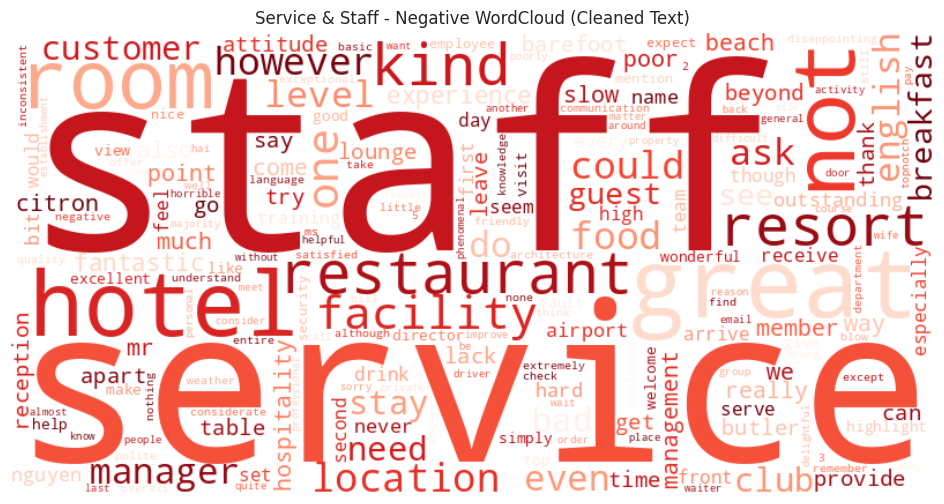

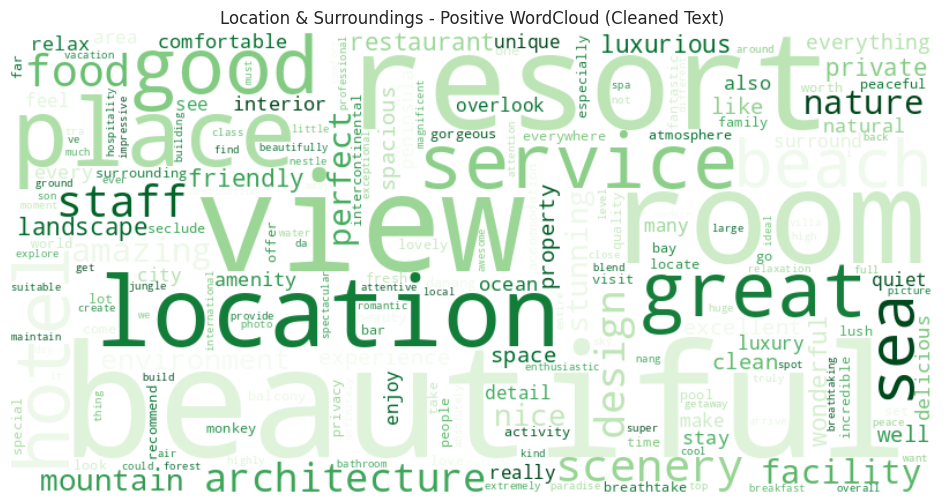

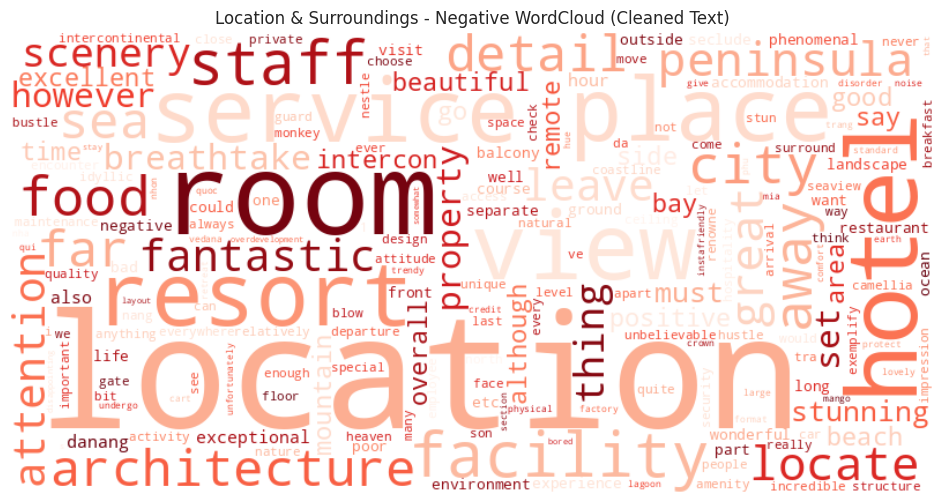

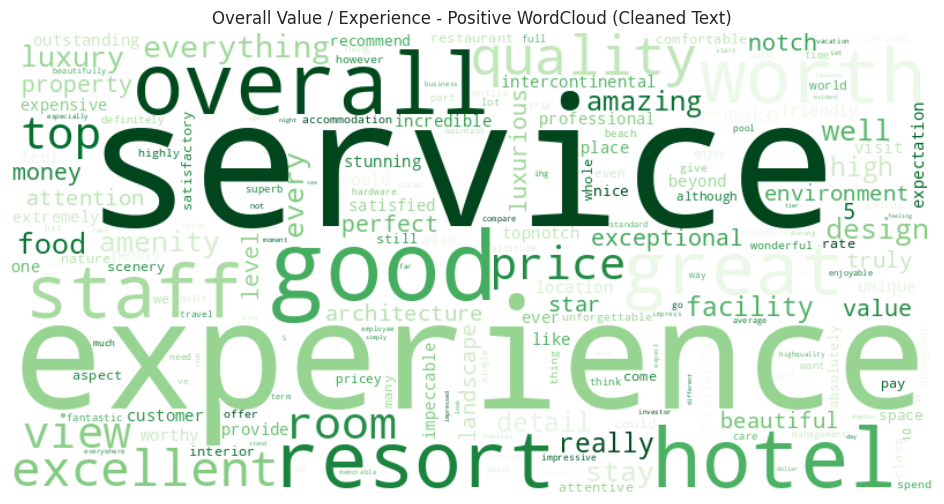

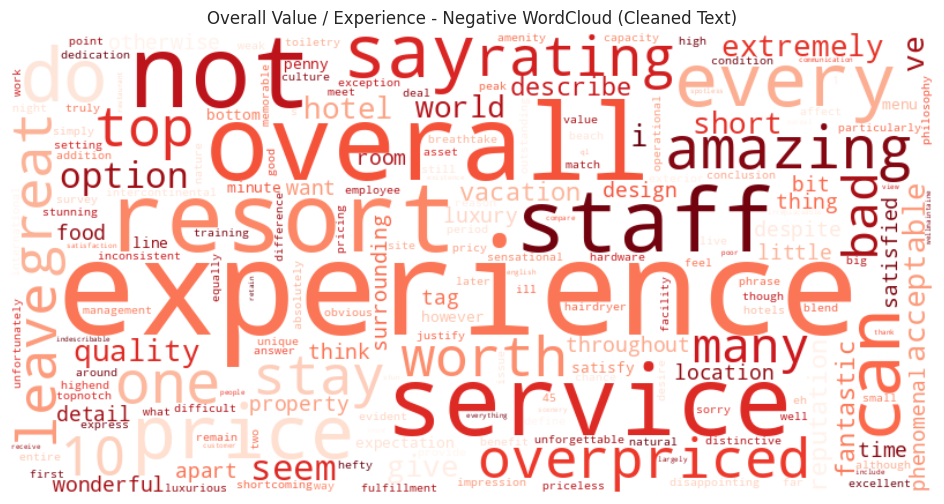

In [ ]:
# 1️⃣ Install thư viện cần thiết
!pip install plotly seaborn matplotlib pandas tqdm wordcloud

# 2️⃣ Imports
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import plotly.express as px
import plotly.graph_objects as go
from collections import Counter
import re

# 3️⃣ Cấu hình plot
sns.set(style="whitegrid")
plt.rcParams['figure.figsize'] = (10,6)

# 4️⃣ Column aspect + sentiment
aspect_cols = [
    "Room & Facilities",
    "Food & Beverage",
    "Service & Staff",
    "Location & Surroundings",
    "Overall Value / Experience"
]

sentiment_cols = [c+"_sentiment" for c in aspect_cols]

# Assuming df_temp is loaded and contains the aspect and sentiment columns

# ===== 1️⃣ Count sentiment per aspect (table) =====
summary = {}
for col in sentiment_cols:
    counts = df_temp[col].value_counts(dropna=False).rename({1: "Positive", 2: "Negative", None: "None"})
    summary[col] = counts

summary_df = pd.DataFrame(summary).fillna(0).astype(int)
print("✅ Count of sentiment per aspect:")
display(summary_df)

# Convert counts to a DataFrame for easier plotting (if not already done)
# Corrected: Drop the 'None' row from summary_df before transposing
sentiment_df = summary_df.drop(index=['None']).T # Exclude None for percentage calcs and plots


# ===== 2️⃣ Pie chart % sentiment per aspect =====
for col in sentiment_cols:
    # Use data where sentiment is not None
    sentiment_data = df_temp[col].dropna().value_counts()
    if sentiment_data.empty:
        print(f"No sentiment data for {col.replace('_sentiment','')}")
        continue
    labels = ["Positive" if x==1 else "Negative" for x in sentiment_data.index]
    fig = px.pie(values=sentiment_data, names=labels, title=f"Sentiment distribution for {col.replace('_sentiment','')}",
                 color=labels, color_discrete_map={'Positive':'green','Negative':'red'})
    fig.show()

# ===== 3️⃣ Bar chart: Count positive vs negative per aspect =====
bar_df = []
for col in sentiment_cols:
    # Use data where sentiment is not None
    sentiment_data = df_temp[col].dropna().value_counts()
    for k,v in sentiment_data.items():
        bar_df.append({"Aspect": col.replace("_sentiment",""), "Sentiment": "Positive" if k==1 else "Negative", "Count": v})

bar_df = pd.DataFrame(bar_df)
if not bar_df.empty:
    fig = px.bar(bar_df, x="Aspect", y="Count", color="Sentiment",
                 title="Sentiment count per aspect", barmode="group",
                 color_discrete_map={'Positive':'green','Negative':'red'})
    fig.show()
else:
    print("No sentiment data available for bar chart.")


# ===== 4️⃣ Heatmap: proportion of sentiment per aspect =====
heatmap_data = []
aspect_names = []
for col in sentiment_cols:
    total = df_temp[col].notna().sum()
    if total > 0:
        pos = (df_temp[col]==1).sum() / total
        neg = (df_temp[col]==2).sum() / total
        heatmap_data.append([pos, neg])
        aspect_names.append(col.replace("_sentiment",""))

heatmap_data = np.array(heatmap_data)

if heatmap_data.size > 0:
    plt.figure(figsize=(8, 5))
    sns.heatmap(heatmap_data, annot=True, fmt=".2f", yticklabels=aspect_names, xticklabels=["Positive","Negative"], cmap="RdYlGn")
    plt.title("Proportion of sentiment per aspect")
    plt.show()
else:
    print("No sentiment data available for heatmap.")

# ===== 5️⃣ WordCloud: top keywords per sentiment per aspect (using cleaned text) =====
print("\nGenerating Word Clouds from Cleaned Text:")
for col in aspect_cols:
    # Use the cleaned text column for word clouds
    clean_col = col + "_clean"
    if clean_col not in df_temp.columns:
        print(f"Cleaned column '{clean_col}' not found. Skipping Word Clouds for this aspect.")
        continue

    for sentiment in [1, 2]: # 1 for Positive, 2 for Negative
        # Filter rows by sentiment for the current aspect and get cleaned text
        sentiment_text_list = df_temp.loc[df_temp[col + "_sentiment"] == sentiment, clean_col].tolist()

        # Join non-empty cleaned text snippets
        all_text = " ".join([text for text in sentiment_text_list if isinstance(text, str) and text.strip()])

        if not all_text.strip():
            print(f"No cleaned text for {col} - {'Positive' if sentiment==1 else 'Negative'}. Skipping Word Cloud.")
            continue

        # Generate word frequency from the text
        words = re.findall(r"\w+", all_text.lower()) # Ensure lower case for frequency count
        word_freq = Counter(words)

        # Generate WordCloud
        wc = WordCloud(width=800, height=400, background_color="white",
                       colormap="Greens" if sentiment==1 else "Reds").generate_from_frequencies(word_freq)

        plt.figure(figsize=(12,6))
        plt.imshow(wc, interpolation="bilinear")
        plt.axis("off")
        plt.title(f"{col} - {'Positive' if sentiment==1 else 'Negative'} WordCloud (Cleaned Text)")
        plt.show()

Bonus Insight

In [ ]:
pip install openpyxl

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 250.9/250.9 kB 11.7 MB/s eta 0:00:00


In [ ]:
import pandas as pd
url="/content/aspect_df.xlsx"
df=pd.read_excel(url)

In [ ]:
df

,name,publishedAtDate,reviewOrigin,reviewId,reviewerId,stars,text,lower_text,language,text_translated,...,Room & Facilities_clean,Food & Beverage_clean,Service & Staff_clean,Location & Surroundings_clean,Overall Value / Experience_clean,Room & Facilities_sentiment,Food & Beverage_sentiment,Service & Staff_sentiment,Location & Surroundings_sentiment,Overall Value / Experience_sentiment
0,ABE,2025-07-28 00:00:00+07:00,Booking.com,NaN,NaN,0.5,Negative: レストラン、宿泊費が高過ぎ！サービスと価格がマッチしていないと強く感じた...,negative: レストラン、宿泊費が高過ぎ！サービスと価格がマッチしていないと強く感じた...,en,"Negative: Restaurant, accommodation costs too ...",...,negative restaurant accommodation cost high,positive restaurant food delicious,NaN,NaN,NaN,2.0,1.0,NaN,NaN,NaN
1,Hakuna Matata,2025-08-06T07:15:24.252Z,Google,Ci9DQUlRQUNvZENodHljRjlvT2tGMVlWaFNjRjlhTVhSbm...,115117152697458259856,1,The sale for event is not good. She is unprofe...,the sale for event is not good. she is unprofe...,en,The sale for event is not good. She is unprofe...,...,NaN,NaN,sorry bit tough thathowever high service get o...,NaN,NaN,NaN,NaN,2.0,NaN,NaN
2,Money Never Sleeps,2025-07-10T04:36:00.647Z,Google,Ci9DQUlRQUNvZENodHljRjlvT21oZlZsOW9WRkpoU25aUm...,112845190478561613236,1,I don't know what the benefits of IHG membersh...,i don't know what the benefits of ihg membersh...,en,I don't know what the benefits of IHG membersh...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,M R,2025-02-22T05:34:37.255Z,Google,ChZDSUhNMG9nS0VJQ0FnTURnaU4zZGJnEAE,116890730741640912776,1,Stupid entry policy to simply go and drink at ...,stupid entry policy to simply go and drink at ...,en,Stupid entry policy to simply go and drink at ...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Sonara Hav,2025-04-05T08:27:19.903Z,Google,ChdDSUhNMG9nS0VJQ0FnTUNJbF9ienBRRRAB,103395332421790067944,1,Unhappy Experian here if you outside guests do...,unhappy experian here if you outside guests do...,en,Unhappy Experian here if you outside guests do...,...,breakfast breakfast drink beach want use stand...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9889,Giovanni,1/20/2020,Tripadvisor,NaN,NaN,5,My family's stay at the Intercontinental Danan...,my family's stay at the intercontinental danan...,en,My family's stay at the Intercontinental Danan...,...,bring main lobby area amazing view ocean huge ...,lot asian food selection citron buffet style,beach pool outstanding customer service wait s...,bring main lobby area amazing view ocean huge ...,NaN,1.0,1.0,1.0,1.0,NaN
9890,ptrck2,1/20/2020,Tripadvisor,NaN,NaN,5,키즈 클럽이 이 정도로 도움이 될 줄은 몰랐네요.\n\n보통 아이를 맡겨두는 방 정...,키즈 클럽이 이 정도로 도움이 될 줄은 몰랐네요.\n\n보통 아이를 맡겨두는 방 정...,en,I didn't know that the kids club would help th...,...,usually think room leave child,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN
9891,NaN,1/19/2020,Tripadvisor,NaN,NaN,5,越南还没有米其林餐厅、这家1888意大利餐厅味道超赞同比米其林三星。环境优美！服务热情、每道...,越南还没有米其林餐厅、这家1888意大利餐厅味道超赞同比米其林三星。环境优美！服务热情、每道...,en,"There is no Michelin restaurant in Vietnam, an...",...,NaN,NaN,NaN,beautiful environment,NaN,NaN,NaN,NaN,1.0,NaN
9892,saranyaa r,1/19/2020,Tripadvisor,NaN,NaN,5,We was celebrated our 1st wedding anniversary ...,we was celebrated our 1st wedding anniversary ...,en,We was celebrated our 1st wedding anniversary ...,...,hotel situate hill side monkey bay also thi lo...,provide we bottle wine hand write personalize ...,service really outstanding,NaN,NaN,1.0,1.0,1.0,NaN,NaN


In [ ]:
aspects = [
    "Room & Facilities_clean",
    "Food & Beverage_clean",
    "Service & Staff_clean",
    "Location & Surroundings_clean",
    "Overall Value / Experience_clean"
]


In [ ]:
import pandas as pd
from collections import Counter
import re

# Hàm tokenize cơ bản
def tokenize(text):
    text = re.sub(r'[^a-zA-Z\s]', '', str(text).lower())
    return [t for t in text.split() if len(t) > 2]

# Tạo dict chứa kết quả tần suất từ
aspect_word_freq = {}

for aspect in aspects:
    all_words = []
    df_aspect = df[aspect].dropna()
    for text in df_aspect:
        all_words.extend(tokenize(text))
    word_count = Counter(all_words)
    aspect_word_freq[aspect] = pd.DataFrame(word_count.items(), columns=["word", "count"]).sort_values(by="count", ascending=False)

# Ví dụ: xem top 10 từ cho từng aspect
for aspect, table in aspect_word_freq.items():
    print(f"\n🔹 {aspect} — Top 10 words:")
    print(table.head(10))



🔹 Room & Facilities_clean — Top 10 words:
          word  count
30        room   2368
26       hotel   2205
73       staff   1098
59     service    895
18        good    774
14        stay    728
167      great    662
100  beautiful    611
298       view    606
37      resort    585

🔹 Food & Beverage_clean — Top 10 words:
           word  count
2          food   1564
1    restaurant    730
3     delicious    629
61      service    557
139        good    540
60    breakfast    509
8         drink    391
305       great    368
88       citron    355
168       staff    295

🔹 Service & Staff_clean — Top 10 words:
             word  count
8           staff   3978
5         service   3037
218      friendly   1079
23           good    894
363         great    575
111          food    421
339       helpful    407
316     excellent    396
127  professional    381
337         thank    370

🔹 Location & Surroundings_clean — Top 10 words:
          word  count
101  beautiful    663
49        vi

In [ ]:
# Create a new DataFrame to store the results
aspect_summary_df = pd.DataFrame(columns=["aspect", "number of tokens", "top 10 tokens"])

# Iterate through the aspect_word_freq dictionary
for aspect, word_freq_df in aspect_word_freq.items():
    # Extract the aspect name by removing "_clean"
    aspect_name = aspect.replace("_clean", "")

    # Calculate the total number of tokens for the aspect
    total_tokens = word_freq_df["count"].sum()

    # Get the top 10 tokens for the aspect
    top_10_tokens = word_freq_df["word"].head(10).tolist()

    # Append the data to the new DataFrame
    new_row = pd.DataFrame({
        "aspect": [aspect_name],
        "number of tokens": [total_tokens],
        "top 10 tokens": [top_10_tokens]
    })
    aspect_summary_df = pd.concat([aspect_summary_df, new_row], ignore_index=True)

# Display the new DataFrame
print("\nSummary of Aspects:")
display(aspect_summary_df)


Summary of Aspects:


,aspect,number of tokens,top 10 tokens
0,Room & Facilities,50113,"[room, hotel, staff, service, good, stay, grea..."
1,Food & Beverage,25383,"[food, restaurant, delicious, service, good, b..."
2,Service & Staff,44665,"[staff, service, friendly, good, great, food, ..."
3,Location & Surroundings,18432,"[beautiful, view, resort, room, location, plac..."
4,Overall Value / Experience,5306,"[service, experience, good, overall, resort, h..."


In [ ]:
aspect_summary_df.to_csv("df_temp.csv")

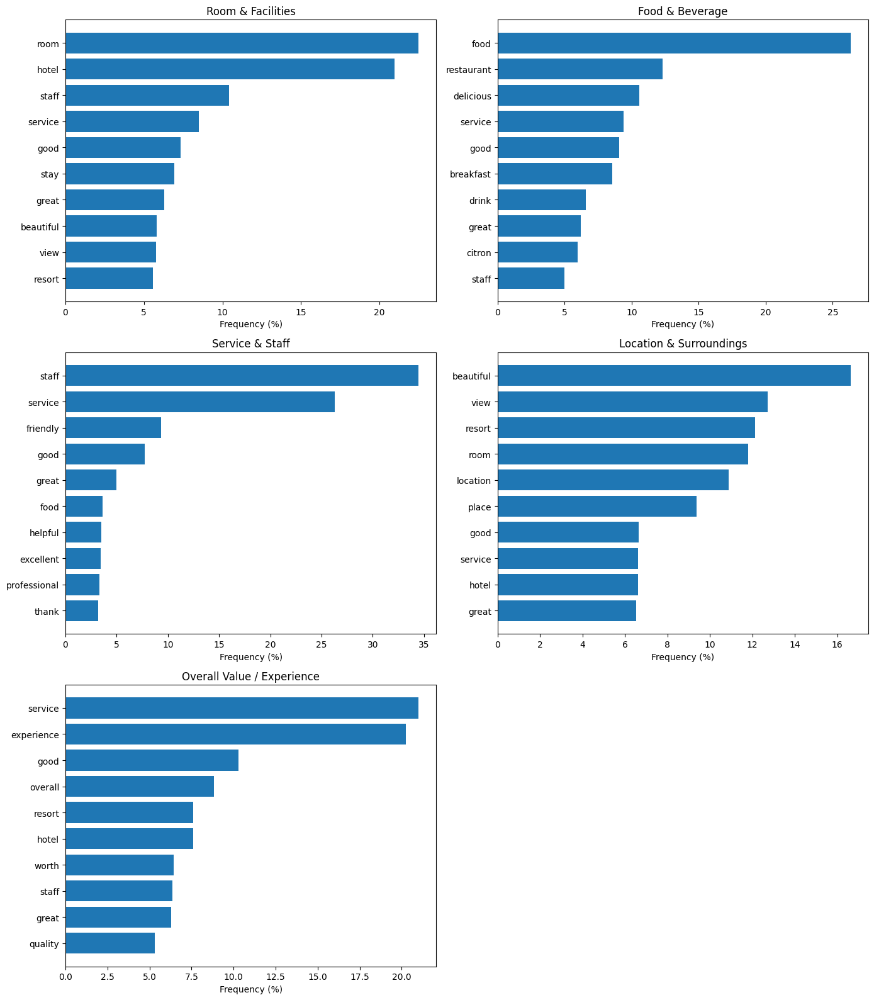

In [ ]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(3, 2, figsize=(14,16)) # Increased figure size for more words
axes = axes.flatten()

for i, aspect in enumerate(aspects):
    top_words = aspect_word_freq[aspect].head(10).copy() # Changed to head(10)
    total_tokens = top_words["count"].sum()
    top_words["percentage"] = (top_words["count"] / total_tokens) * 100 # Calculate percentage

    axes[i].barh(top_words["word"], top_words["percentage"]) # Plot percentages
    axes[i].invert_yaxis()
    axes[i].set_title(aspect.replace("_clean", "")) # Clean up title
    axes[i].set_xlabel("Frequency (%)") # Update label

# Hide the last empty subplot
axes[-1].axis('off')

plt.tight_layout()
plt.show()

## 2.5. NPS Calculation

Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/pip/_internal/cli/base_command.py", line 179, in exc_logging_wrapper
    status = run_func(*args)
             ^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/pip/_internal/cli/req_command.py", line 67, in wrapper
    return func(self, options, args)
           ^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/pip/_internal/commands/install.py", line 362, in run
    resolver = self.make_resolver(
               ^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/pip/_internal/cli/req_command.py", line 177, in make_resolver
    return pip._internal.resolution.resolvelib.resolver.Resolver(
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/pip/_internal/resolution/resolvelib/resolver.py", line 58, in __init__
    self.factory = Factory(
                   ^^^^^^^^
  File "/usr/local/lib/py

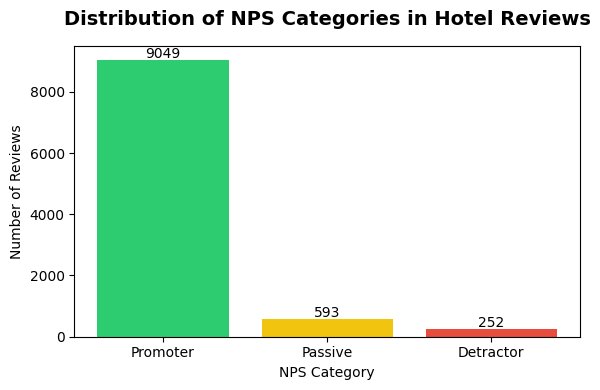

In [ ]:
!pip install --quiet gspread gspread_dataframe

import gspread
from google.colab import auth
from google.auth import default
from gspread_dataframe import get_as_dataframe
from gspread_dataframe import set_with_dataframe
import pandas as pd
import matplotlib.pyplot as plt

# Xác thực người dùng Google
auth.authenticate_user()
creds, _ = default()
gc = gspread.authorize(creds)

# Mở Google Sheet bằng URL
sheet_url = "https://docs.google.com/spreadsheets/d/1Pb5HzW_WyWk4lpuCSKOP0Ag4acY8U9VCbazFi01uJCc/edit?usp=sharing"
spreadsheet = gc.open_by_url(sheet_url)
worksheet = spreadsheet.get_worksheet(0)  # chọn trang đầu tiên

# Chuyển sang DataFrame
data = get_as_dataframe(worksheet)

# Gán lại cho tiện khi xử lý
df = data.copy()

# --- Làm sạch dữ liệu số sao ---
# (ép kiểu float để xử lý được các giá trị 4.5, 3.7, v.v.)
df['stars'] = pd.to_numeric(df['stars'], errors='coerce')

# Xác định hàm phân loại thành Promoter / Passive / Detractor
def classify_nps(star):
    """
    Classifies a review into NPS category based on star rating.
    - Promoter: star == 5
    - Passive: 4 <= star < 5
    - Detractor: star < 4
    """
    if pd.isna(star):
        return None
    elif star == 5.0:
        return "Promoter"
    elif 4 <= star < 5:
        return "Passive"
    else:
        return "Detractor"

# Áp dụng hàm vào DataFrame để tạo cột mới nps_category
df['nps_category'] = df['stars'].apply(classify_nps)

# Ghi toàn bộ DataFrame (bao gồm cột nps_category) lên Google Sheet
set_with_dataframe(worksheet, df)

# Kiểm tra kết quả:
df[['stars', 'nps_category']].head(10)

# --- Visualization ---
# Count each NPS category
nps_counts = df['nps_category'].value_counts()

# Bar chart
plt.figure(figsize=(6, 4))
bars = plt.bar(
    nps_counts.index,
    nps_counts.values,
    color=['#2ECC71', '#F1C40F', '#E74C3C']
)
plt.title("Distribution of NPS Categories in Hotel Reviews", fontsize=14, fontweight='bold', pad=15)
plt.xlabel("NPS Category")
plt.ylabel("Number of Reviews")

# Add values on top of bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 50, f"{int(yval)}", ha='center', fontsize=10)

plt.tight_layout()
plt.show()


Promoters: 91.46%
Passives: 5.99%
Detractors: 2.55%


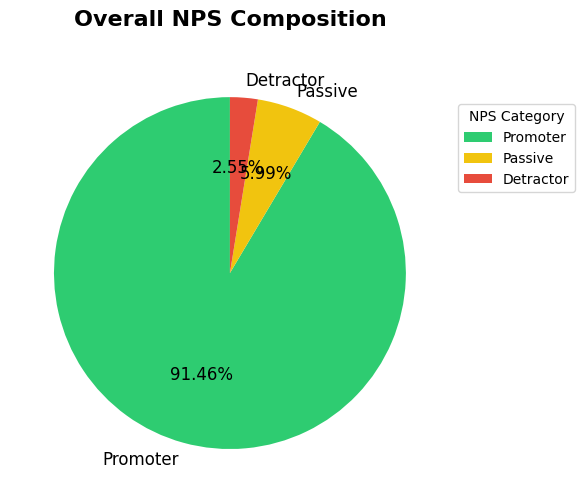

In [ ]:
#Tính tỷ lệ Promoter / Passive / Detractor
# Đếm số lượng từng nhóm
nps_counts = df['nps_category'].value_counts()

# Tổng số review hợp lệ
total_reviews = nps_counts.sum()

# Tính tỷ lệ %
promoter_pct = (nps_counts.get('Promoter', 0) / total_reviews) * 100
passive_pct = (nps_counts.get('Passive', 0) / total_reviews) * 100
detractor_pct = (nps_counts.get('Detractor', 0) / total_reviews) * 100

print(f"Promoters: {promoter_pct:.2f}%")
print(f"Passives: {passive_pct:.2f}%")
print(f"Detractors: {detractor_pct:.2f}%")

# Visualization of Overall NPS Composition (Pie Chart)
import matplotlib.pyplot as plt

# Chuẩn bị dữ liệu
nps_labels = ['Promoter', 'Passive', 'Detractor']
nps_values = [promoter_pct, passive_pct, detractor_pct]

# Vẽ biểu đồ tròn
colors = ['#2ECC71', '#F1C40F', '#E74C3C']  # xanh - vàng - đỏ
fig, ax = plt.subplots(figsize=(6, 6))

wedges, texts, autotexts = ax.pie(
    nps_values,
    labels=nps_labels,
    autopct=lambda p: f'{p:.2f}%',  # hiển thị hai chữ số thập phân
    startangle=90,
    colors=colors,
    textprops={'fontsize': 12, 'color': 'black'}
)

# Thêm tiêu đề và chú thích
plt.title("Overall NPS Composition", fontsize=16, fontweight='bold', pad=20)
plt.legend(
    wedges,
    nps_labels,
    title="NPS Category",
    loc="upper right",
    bbox_to_anchor=(1.3, 0.9)
)
plt.tight_layout()
plt.show()


In [ ]:
# Tính chỉ số NPS
nps_score = promoter_pct - detractor_pct
print(f"NPS Score: {nps_score:.2f}")

NPS Score: 88.91


/tmp/ipython-input-3846100651.py:6: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  df['quarter'] = df['publishedAtDate'].dt.to_period('Q')


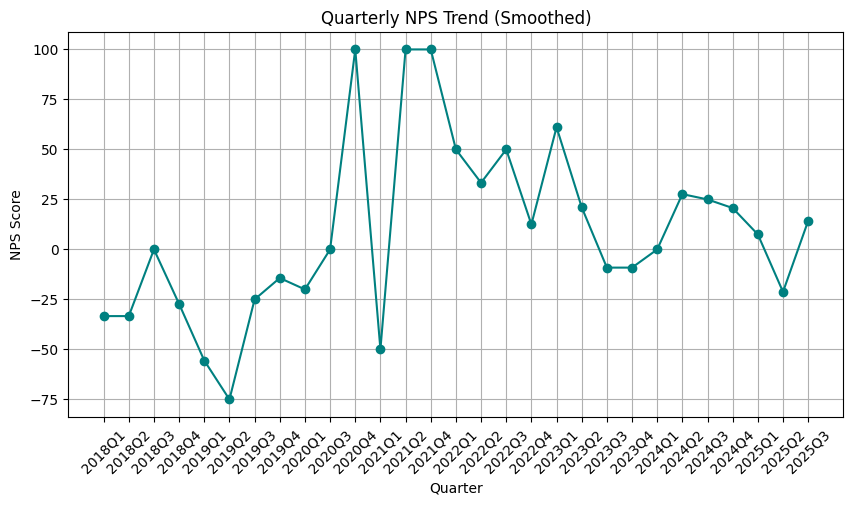

In [ ]:
# Tính NPS theo thời gian (theo tháng / quý)
# Chuyển đổi kiểu ngày
df['publishedAtDate'] = pd.to_datetime(df['publishedAtDate'], errors='coerce')

# Tạo cột quý
df['quarter'] = df['publishedAtDate'].dt.to_period('Q')

# Tính NPS theo quý
nps_by_quarter = (
    df.groupby('quarter')['nps_category']
      .apply(lambda x: (x.eq('Promoter').mean() - x.eq('Detractor').mean()) * 100)
      .reset_index(name='NPS')
)

# Vẽ biểu đồ
plt.figure(figsize=(10,5))
plt.plot(nps_by_quarter['quarter'].astype(str), nps_by_quarter['NPS'], marker='o', color='teal')
plt.xticks(rotation=45)
plt.title("Quarterly NPS Trend (Smoothed)")
plt.xlabel("Quarter")
plt.ylabel("NPS Score")
plt.grid(True)
plt.show()



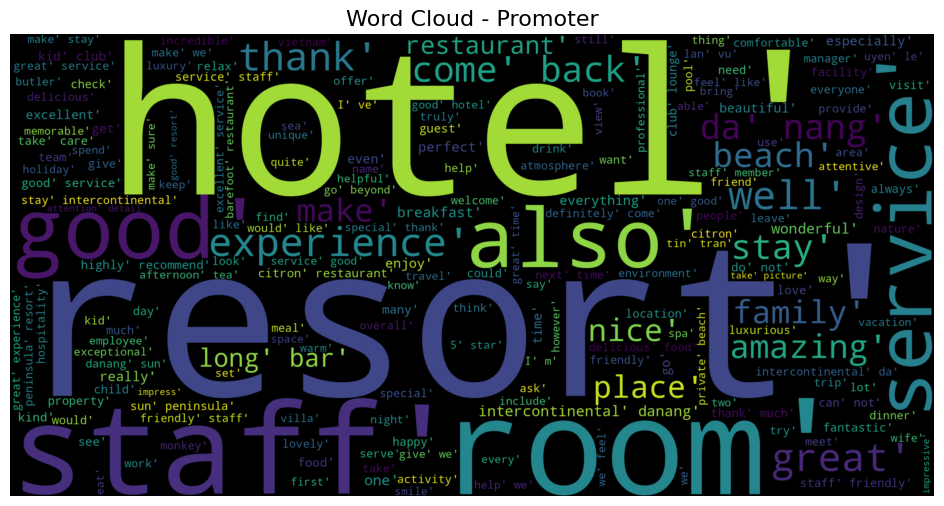

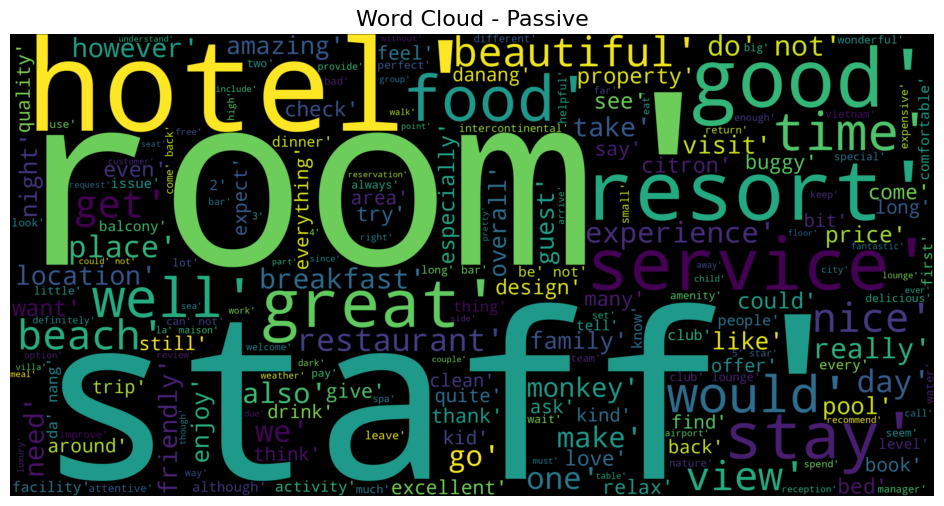

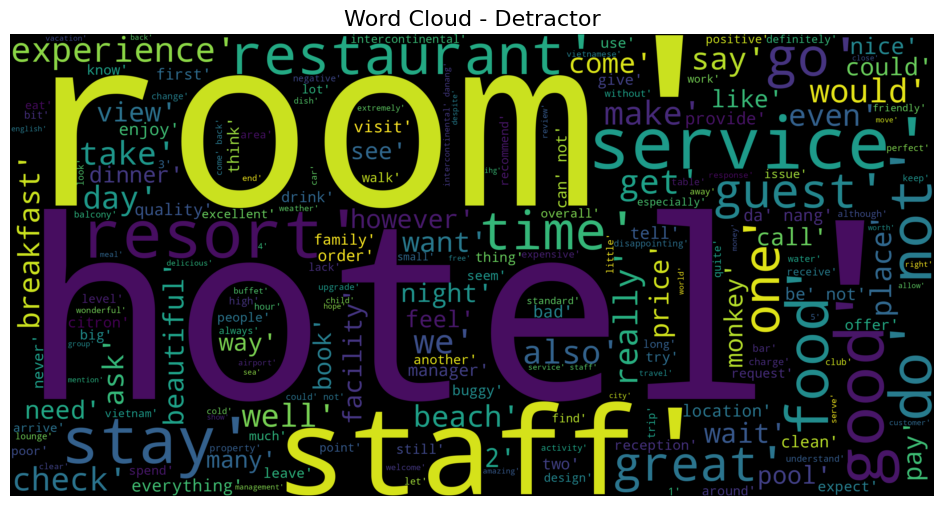

In [ ]:
from wordcloud import WordCloud

for category in ['Promoter', 'Passive', 'Detractor']:
    text = " ".join(df[df['nps_category'] == category]['nlp_text'].astype(str))
    wordcloud = WordCloud(width=3000, height=1500, background_color='black').generate(text)

    plt.figure(figsize=(12,6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(f"Word Cloud - {category}", fontsize=16)
    plt.show()

## 2.6.Repeat vs One-time Reviewers Analysis

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from collections import Counter

In [ ]:
df = pd.read_excel('/content/aspect_df.xlsx')

In [ ]:
# Chuẩn bị dữ liệu
df['stars'] = pd.to_numeric(df['stars'], errors='coerce')

# Set style
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

In [ ]:
# 1. PHÂN TÍCH REPEAT REVIEWERS
# ============================================

# Đếm số lần review của mỗi reviewer
reviewer_counts = df['reviewerId'].value_counts()
repeat_reviewers = reviewer_counts[reviewer_counts > 1]

print(f"Tổng số reviewers: {df['reviewerId'].nunique()}")
print(f"Số repeat reviewers: {len(repeat_reviewers)}")
print(f"Tỷ lệ repeat: {len(repeat_reviewers)/df['reviewerId'].nunique()*100:.2f}%")
print(f"Tổng số reviews từ repeat reviewers: {repeat_reviewers.sum()}")
print("\n")

Tổng số reviewers: 4967
Số repeat reviewers: 10
Tỷ lệ repeat: 0.20%
Tổng số reviews từ repeat reviewers: 21




In [ ]:
!apt-get install fonts-dejavu -y
import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'DejaVu Sans'


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
fonts-dejavu is already the newest version (2.37-2build1).
0 upgraded, 0 newly installed, 0 to remove and 38 not upgraded.


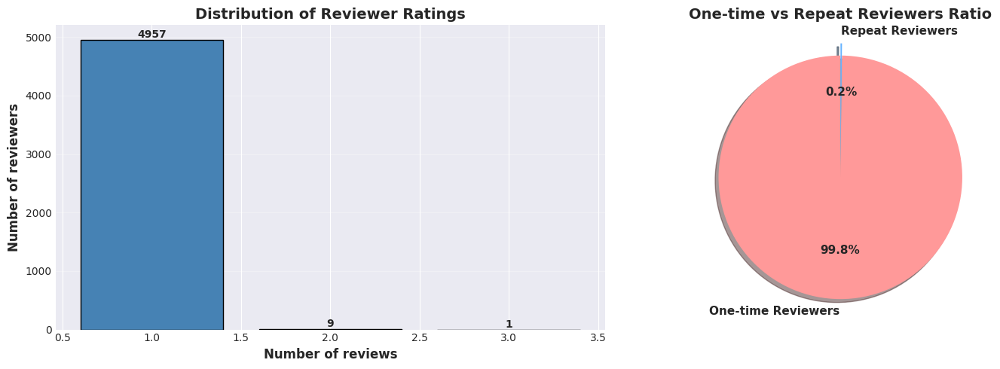

In [ ]:
# 2. BIỂU ĐỒ 1: Phân phối Repeat Reviewers
# ============================================
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Biểu đồ cột: số lượng reviewers theo số lần review
review_freq = reviewer_counts.value_counts().sort_index()
axes[0].bar(review_freq.index, review_freq.values, color='steelblue', edgecolor='black')
axes[0].set_xlabel('Number of reviews', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Number of reviewers', fontsize=12, fontweight='bold')
axes[0].set_title('Distribution of Reviewer Ratings', fontsize=14, fontweight='bold')
axes[0].grid(axis='y', alpha=0.3)

# Thêm giá trị trên mỗi cột
for i, (x, y) in enumerate(zip(review_freq.index, review_freq.values)):
    axes[0].text(x, y, str(y), ha='center', va='bottom', fontweight='bold')

# Biểu đồ tròn: One-time vs Repeat
one_time = (reviewer_counts == 1).sum()
repeat = (reviewer_counts > 1).sum()
labels = ['One-time Reviewers', 'Repeat Reviewers']
sizes = [one_time, repeat]
colors = ['#ff9999', '#66b3ff']
explode = (0, 0.1)

axes[1].pie(sizes, explode=explode, labels=labels, colors=colors,
            autopct='%1.1f%%', shadow=True, startangle=90,
            textprops={'fontsize': 11, 'fontweight': 'bold'})
axes[1].set_title('One-time vs Repeat Reviewers Ratio', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()


In [ ]:
# 3. PHÂN TÍCH SENTIMENT THEO ASPECT
# ============================================

# Danh sách các aspect columns
aspect_cols = [
    'Room & Facilities_sentiment',
    'Food & Beverage_sentiment',
    'Service & Staff_sentiment',
    'Location & Surroundings_sentiment',
    'Overall Value / Experience_sentiment'
]

# Đổi tên ngắn gọn
aspect_names = {
    'Room & Facilities_sentiment': 'Room & Facilities',
    'Food & Beverage_sentiment': 'Food & Beverage',
    'Service & Staff_sentiment': 'Service & Staff',
    'Location & Surroundings_sentiment': 'Location',
    'Overall Value / Experience_sentiment': 'Overall Value'
}

# Hàm phân tích sentiment cho repeat reviewers
def analyze_sentiment_by_reviewer_type(df, aspect_cols, aspect_names):
    # Xác định repeat reviewers
    reviewer_counts = df['reviewerId'].value_counts()
    repeat_reviewer_ids = reviewer_counts[reviewer_counts > 1].index

    df['reviewer_type'] = df['reviewerId'].apply(
        lambda x: 'Repeat' if x in repeat_reviewer_ids else 'One-time'
    )

    results = []
    for col in aspect_cols:
        for reviewer_type in ['One-time', 'Repeat']:
            subset = df[df['reviewer_type'] == reviewer_type]
            sentiment_counts = subset[col].value_counts()

            for sentiment, count in sentiment_counts.items():
                if sentiment in [1, 2]:  # 1=positive, 2=negative
                    results.append({
                        'Aspect': aspect_names[col],
                        'Reviewer Type': reviewer_type,
                        'Sentiment': 'Positive' if sentiment == 1 else 'Negative',
                        'Count': count
                    })

    return pd.DataFrame(results)

sentiment_df = analyze_sentiment_by_reviewer_type(df, aspect_cols, aspect_names)


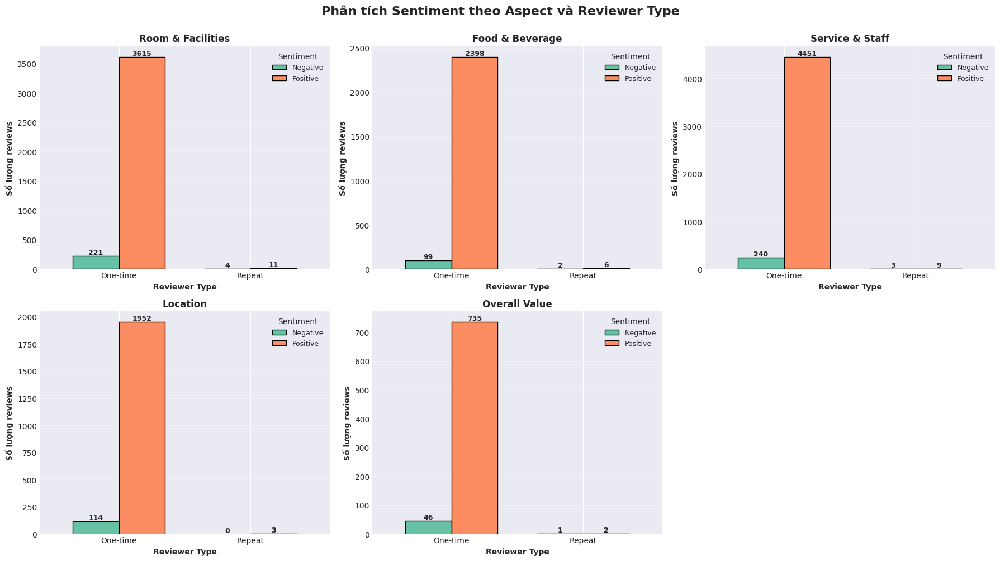

In [ ]:
# 4. BIỂU ĐỒ 2: Sentiment theo Aspect và Reviewer Type
# ============================================
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for idx, aspect in enumerate(aspect_names.values()):
    aspect_data = sentiment_df[sentiment_df['Aspect'] == aspect]

    pivot_data = aspect_data.pivot_table(
        index='Reviewer Type',
        columns='Sentiment',
        values='Count',
        fill_value=0
    )

    pivot_data.plot(kind='bar', ax=axes[idx], color=['#66c2a5', '#fc8d62'],
                    edgecolor='black', width=0.7)
    axes[idx].set_title(f'{aspect}', fontsize=12, fontweight='bold')
    axes[idx].set_xlabel('Reviewer Type', fontsize=10, fontweight='bold')
    axes[idx].set_ylabel('Số lượng reviews', fontsize=10, fontweight='bold')
    axes[idx].legend(title='Sentiment', fontsize=9)
    axes[idx].tick_params(axis='x', rotation=0)
    axes[idx].grid(axis='y', alpha=0.3)

    # Thêm giá trị trên cột
    for container in axes[idx].containers:
        axes[idx].bar_label(container, fontweight='bold', fontsize=9)

# Ẩn subplot thừa
axes[5].axis('off')

plt.suptitle('Phân tích Sentiment theo Aspect và Reviewer Type',
             fontsize=16, fontweight='bold', y=1.00)
plt.tight_layout()
plt.show()

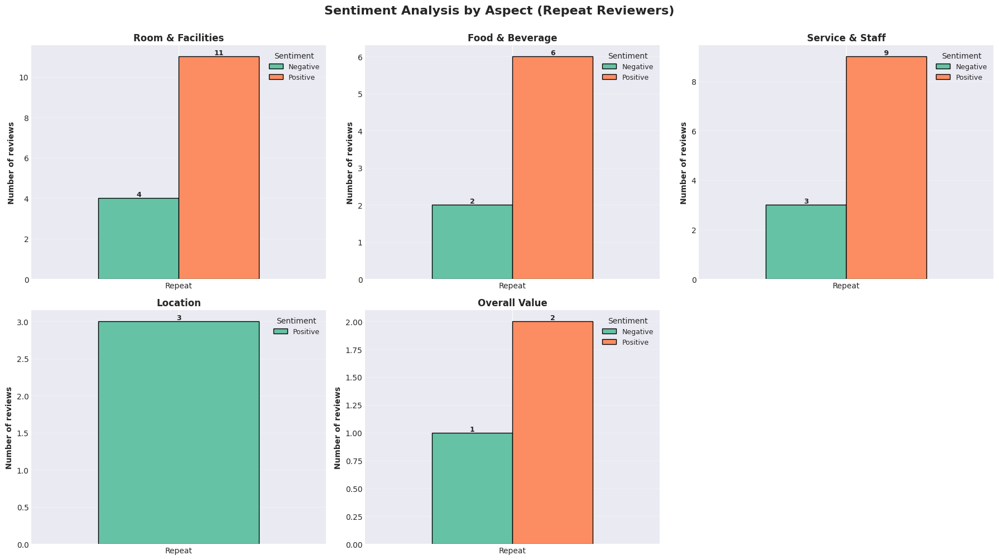

In [ ]:
# 4. BIỂU ĐỒ 2: Sentiment theo Aspect và Reviewer Type
# ============================================

# ✅ Lọc dữ liệu: chỉ giữ lại Repeat Reviewers
sentiment_df_repeat = sentiment_df[sentiment_df['Reviewer Type'] == 'Repeat']

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for idx, aspect in enumerate(aspect_names.values()):
    aspect_data = sentiment_df_repeat[sentiment_df_repeat['Aspect'] == aspect]

    pivot_data = aspect_data.pivot_table(
        index='Reviewer Type',
        columns='Sentiment',
        values='Count',
        fill_value=0
    )

    pivot_data.plot(kind='bar', ax=axes[idx], color=['#66c2a5', '#fc8d62'],
                    edgecolor='black', width=0.6)

    axes[idx].set_title(f'{aspect}', fontsize=12, fontweight='bold')
    axes[idx].set_xlabel('')
    axes[idx].set_ylabel('Number of reviews', fontsize=10, fontweight='bold')
    axes[idx].legend(title='Sentiment', fontsize=9)
    axes[idx].tick_params(axis='x', rotation=0)
    axes[idx].grid(axis='y', alpha=0.3)

    # Thêm giá trị trên mỗi cột
    for container in axes[idx].containers:
        axes[idx].bar_label(container, fontweight='bold', fontsize=9)

# Ẩn subplot thừa (nếu có)
axes[5].axis('off')

plt.suptitle('Sentiment Analysis by Aspect (Repeat Reviewers)',
             fontsize=16, fontweight='bold', y=1.00)
plt.tight_layout()
plt.show()


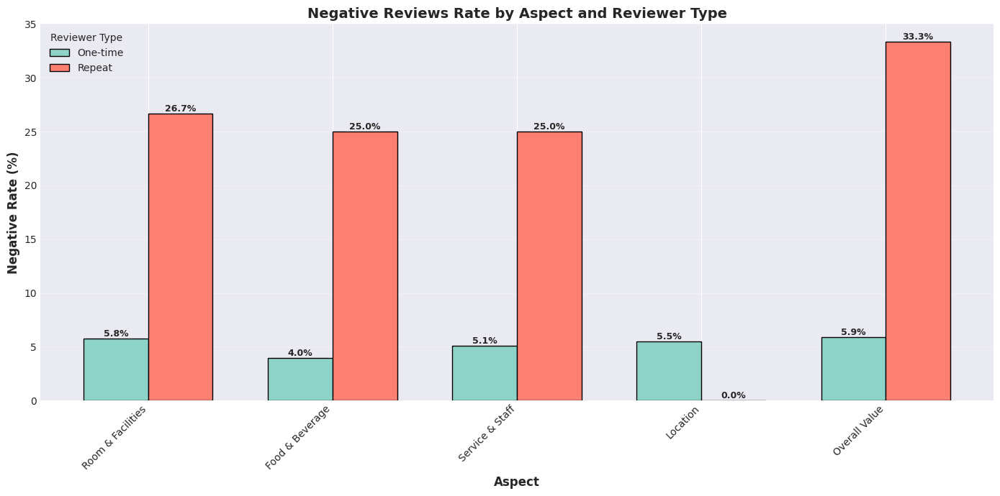

In [ ]:
# 5. BIỂU ĐỒ 3: Tỷ lệ Negative/Positive theo Aspect
# ============================================
fig, ax = plt.subplots(figsize=(14, 7))

# Tính tỷ lệ negative cho mỗi aspect và reviewer type
ratio_data = []
for aspect in aspect_names.values():
    aspect_data = sentiment_df[sentiment_df['Aspect'] == aspect]

    for reviewer_type in ['One-time', 'Repeat']:
        type_data = aspect_data[aspect_data['Reviewer Type'] == reviewer_type]
        total = type_data['Count'].sum()
        negative = type_data[type_data['Sentiment'] == 'Negative']['Count'].sum()

        if total > 0:
            ratio_data.append({
                'Aspect': aspect,
                'Reviewer Type': reviewer_type,
                'Negative Ratio': (negative / total) * 100
            })

ratio_df = pd.DataFrame(ratio_data)

# Vẽ biểu đồ grouped bar
x = np.arange(len(aspect_names.values()))
width = 0.35

onetime_ratios = ratio_df[ratio_df['Reviewer Type'] == 'One-time']['Negative Ratio'].values
repeat_ratios = ratio_df[ratio_df['Reviewer Type'] == 'Repeat']['Negative Ratio'].values

bars1 = ax.bar(x - width/2, onetime_ratios, width, label='One-time',
               color='#8dd3c7', edgecolor='black')
bars2 = ax.bar(x + width/2, repeat_ratios, width, label='Repeat',
               color='#fb8072', edgecolor='black')

ax.set_xlabel('Aspect', fontsize=12, fontweight='bold')
ax.set_ylabel('Negative Rate (%)', fontsize=12, fontweight='bold')
ax.set_title('Negative Reviews Rate by Aspect and Reviewer Type',
             fontsize=14, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(aspect_names.values(), rotation=45, ha='right')
ax.legend(title='Reviewer Type', fontsize=10)
ax.grid(axis='y', alpha=0.3)

# Thêm giá trị trên cột
for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.1f}%', ha='center', va='bottom',
                fontweight='bold', fontsize=9)

plt.tight_layout()
plt.show()


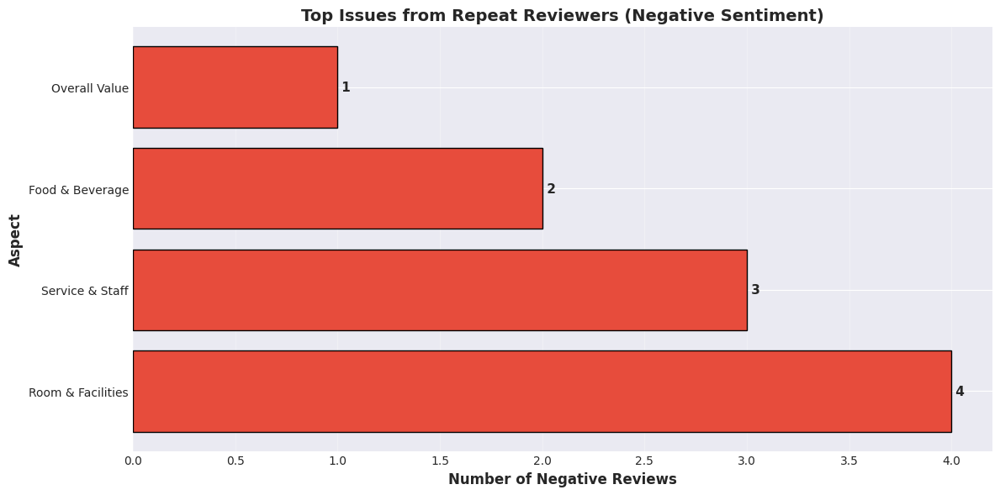

In [ ]:
# 6. BIỂU ĐỒ 4: Top Issues của Repeat Reviewers
# ============================================
repeat_reviewer_ids = df['reviewerId'].value_counts()[df['reviewerId'].value_counts() > 1].index
repeat_df = df[df['reviewerId'].isin(repeat_reviewer_ids)]

# Đếm negative sentiment theo aspect
negative_counts = {}
for col, name in aspect_names.items():
    count = (repeat_df[col] == 2).sum()
    if count > 0:
        negative_counts[name] = count

# Sắp xếp và vẽ
sorted_issues = sorted(negative_counts.items(), key=lambda x: x[1], reverse=True)
aspects_sorted = [x[0] for x in sorted_issues]
counts_sorted = [x[1] for x in sorted_issues]

fig, ax = plt.subplots(figsize=(12, 6))
bars = ax.barh(aspects_sorted, counts_sorted, color='#e74c3c', edgecolor='black')
ax.set_xlabel('Number of Negative Reviews', fontsize=12, fontweight='bold')
ax.set_ylabel('Aspect', fontsize=12, fontweight='bold')
ax.set_title('Top Issues from Repeat Reviewers (Negative Sentiment)',
             fontsize=14, fontweight='bold')
ax.grid(axis='x', alpha=0.3)

# Thêm giá trị
for i, (aspect, count) in enumerate(zip(aspects_sorted, counts_sorted)):
    ax.text(count, i, f' {count}', va='center', fontweight='bold', fontsize=11)

plt.tight_layout()
plt.show()


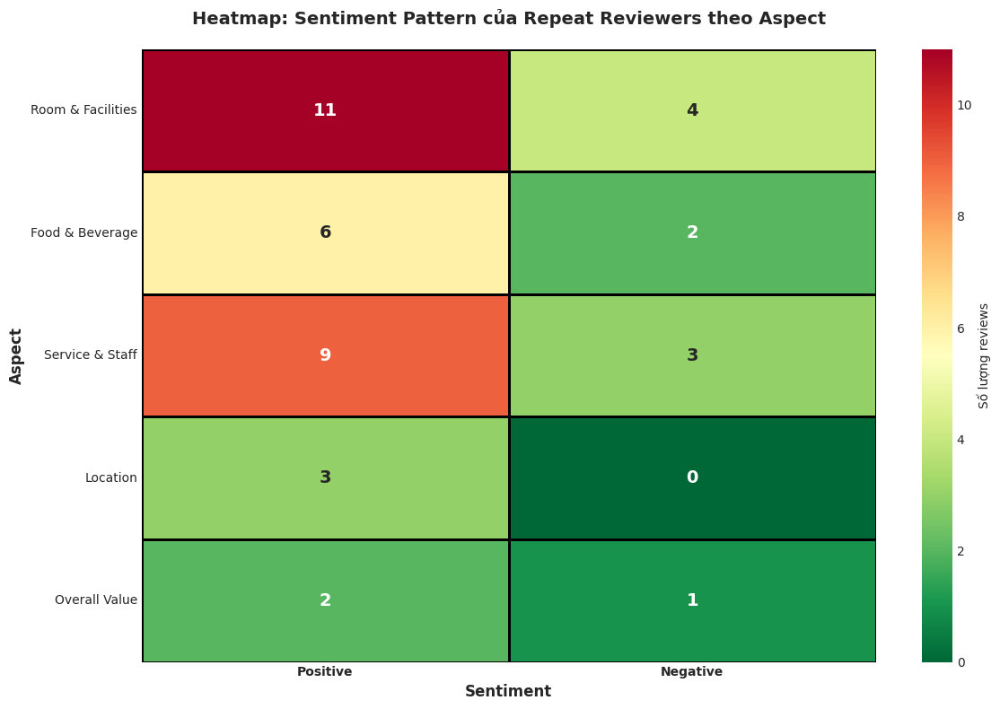

In [ ]:
# ============================================
# 8. BIỂU ĐỒ 5: Heatmap - Sentiment Pattern của Repeat Reviewers
# ============================================
fig, ax = plt.subplots(figsize=(12, 8))

# Tạo ma trận cho heatmap
heatmap_data = []
for aspect_col, aspect_name in aspect_names.items():
    row = []
    for sentiment in ['Positive', 'Negative']:
        sentiment_val = 1 if sentiment == 'Positive' else 2
        count = (repeat_df[aspect_col] == sentiment_val).sum()
        row.append(count)
    heatmap_data.append(row)

heatmap_df = pd.DataFrame(heatmap_data,
                          columns=['Positive', 'Negative'],
                          index=aspect_names.values())

sns.heatmap(heatmap_df, annot=True, fmt='d', cmap='RdYlGn_r',
            linewidths=2, linecolor='black', cbar_kws={'label': 'Số lượng reviews'},
            annot_kws={'fontsize': 14, 'fontweight': 'bold'}, ax=ax)
ax.set_title('Heatmap: Sentiment Pattern của Repeat Reviewers theo Aspect',
             fontsize=14, fontweight='bold', pad=20)
ax.set_xlabel('Sentiment', fontsize=12, fontweight='bold')
ax.set_ylabel('Aspect', fontsize=12, fontweight='bold')
plt.xticks(rotation=0, fontweight='bold')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

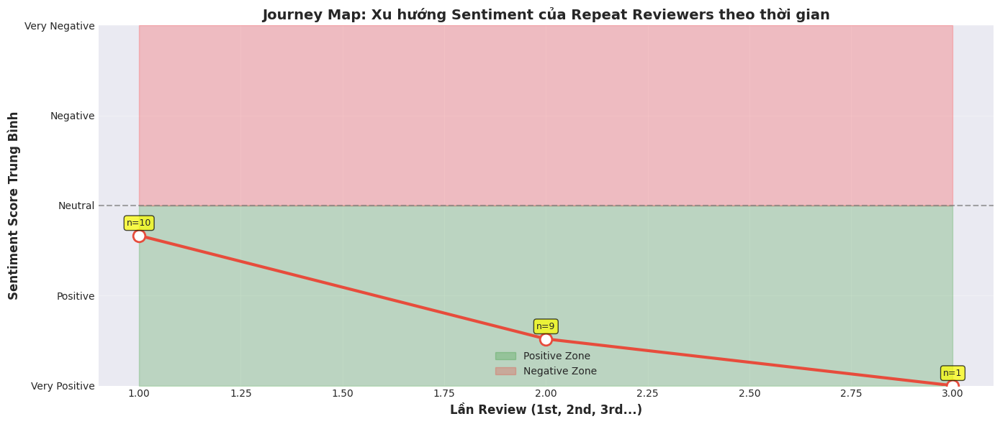

In [ ]:
# 9. BIỂU ĐỒ 6: Journey Map - Sentiment Changes của Repeat Reviewers
# ============================================
# Lấy reviewers có ít nhất 2 reviews
repeat_journey = df[df['reviewerId'].isin(repeat_reviewer_ids)].copy()
repeat_journey = repeat_journey.sort_values(['reviewerId', 'publishedAtDate'])

# Tính sentiment score trung bình (1=positive, 2=negative)
def calc_sentiment_score(row):
    sentiments = []
    for col in aspect_cols:
        if pd.notna(row[col]) and row[col] in [1, 2]:
            sentiments.append(row[col])
    return np.mean(sentiments) if sentiments else np.nan

repeat_journey['sentiment_score'] = repeat_journey.apply(calc_sentiment_score, axis=1)
repeat_journey = repeat_journey.dropna(subset=['sentiment_score'])

# Đếm số lần review của mỗi người
repeat_journey['review_number'] = repeat_journey.groupby('reviewerId').cumcount() + 1

# Tính trung bình sentiment theo lần review
journey_stats = repeat_journey.groupby('review_number')['sentiment_score'].agg(['mean', 'count'])

fig, ax = plt.subplots(figsize=(14, 6))

# Vẽ line plot với markers
ax.plot(journey_stats.index, journey_stats['mean'],
        marker='o', markersize=12, linewidth=3, color='#e74c3c',
        markerfacecolor='white', markeredgewidth=2, markeredgecolor='#e74c3c')

# Thêm vùng màu cho positive/negative
ax.axhline(y=1.5, color='gray', linestyle='--', linewidth=1.5, alpha=0.7)
ax.fill_between(journey_stats.index, 1, 1.5, alpha=0.2, color='green', label='Positive Zone')
ax.fill_between(journey_stats.index, 1.5, 2, alpha=0.2, color='red', label='Negative Zone')

ax.set_xlabel('Lần Review (1st, 2nd, 3rd...)', fontsize=12, fontweight='bold')
ax.set_ylabel('Sentiment Score Trung Bình', fontsize=12, fontweight='bold')
ax.set_title('Journey Map: Xu hướng Sentiment của Repeat Reviewers theo thời gian',
             fontsize=14, fontweight='bold')
ax.set_ylim(1, 2)
ax.set_yticks([1, 1.25, 1.5, 1.75, 2])
ax.set_yticklabels(['Very Positive', 'Positive', 'Neutral', 'Negative', 'Very Negative'])
ax.grid(True, alpha=0.3)
ax.legend(fontsize=10)

# Thêm annotation cho số lượng
for x, y, count in zip(journey_stats.index, journey_stats['mean'], journey_stats['count']):
    ax.annotate(f'n={int(count)}', xy=(x, y), xytext=(0, 10),
                textcoords='offset points', ha='center', fontsize=9,
                bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow', alpha=0.7))

plt.tight_layout()
plt.show()


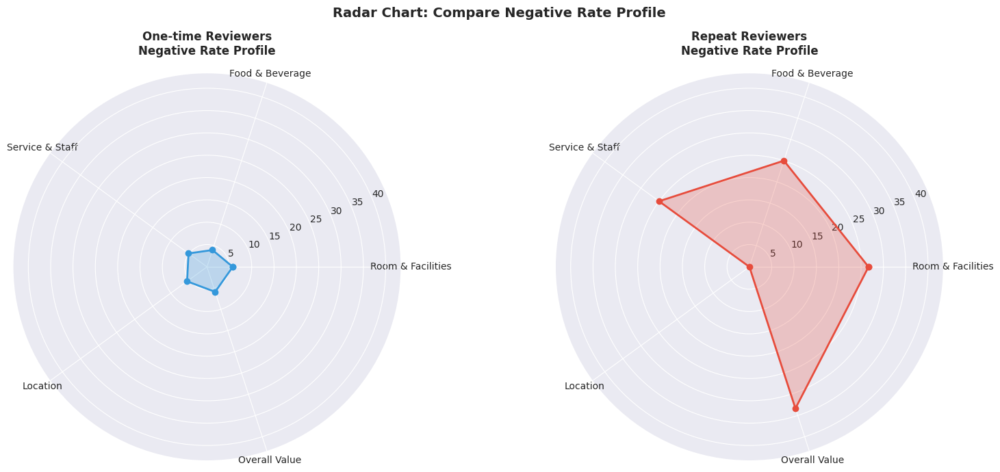

In [ ]:
# 10. BIỂU ĐỒ 7: Radar Chart - So sánh Profile Repeat vs One-time
# ============================================
from math import pi

fig, axes = plt.subplots(1, 2, figsize=(16, 7), subplot_kw=dict(projection='polar'))

# Tính negative rate cho từng aspect
def calc_negative_rate(data, aspect_cols, aspect_names):
    rates = []
    for col in aspect_cols:
        total = data[col].isin([1, 2]).sum()
        negative = (data[col] == 2).sum()
        rate = (negative / total * 100) if total > 0 else 0
        rates.append(rate)
    return rates

onetime_df = df[~df['reviewerId'].isin(repeat_reviewer_ids)]
onetime_rates = calc_negative_rate(onetime_df, aspect_cols, aspect_names)
repeat_rates = calc_negative_rate(repeat_df, aspect_cols, aspect_names)

# Setup radar chart
categories = list(aspect_names.values())
N = len(categories)
angles = [n / float(N) * 2 * pi for n in range(N)]
onetime_rates += onetime_rates[:1]
repeat_rates += repeat_rates[:1]
angles += angles[:1]

# Plot One-time
axes[0].plot(angles, onetime_rates, 'o-', linewidth=2, color='#3498db', label='One-time')
axes[0].fill(angles, onetime_rates, alpha=0.25, color='#3498db')
axes[0].set_xticks(angles[:-1])
axes[0].set_xticklabels(categories, size=10)
axes[0].set_ylim(0, max(max(onetime_rates), max(repeat_rates)) + 10)
axes[0].set_title('One-time Reviewers\nNegative Rate Profile',
                  fontsize=12, fontweight='bold', pad=20)
axes[0].grid(True)

# Plot Repeat
axes[1].plot(angles, repeat_rates, 'o-', linewidth=2, color='#e74c3c', label='Repeat')
axes[1].fill(angles, repeat_rates, alpha=0.25, color='#e74c3c')
axes[1].set_xticks(angles[:-1])
axes[1].set_xticklabels(categories, size=10)
axes[1].set_ylim(0, max(max(onetime_rates), max(repeat_rates)) + 10)
axes[1].set_title('Repeat Reviewers\nNegative Rate Profile',
                  fontsize=12, fontweight='bold', pad=20)
axes[1].grid(True)

plt.suptitle('Radar Chart: Compare Negative Rate Profile',
             fontsize=14, fontweight='bold', y=0.98)
plt.tight_layout()
plt.show()


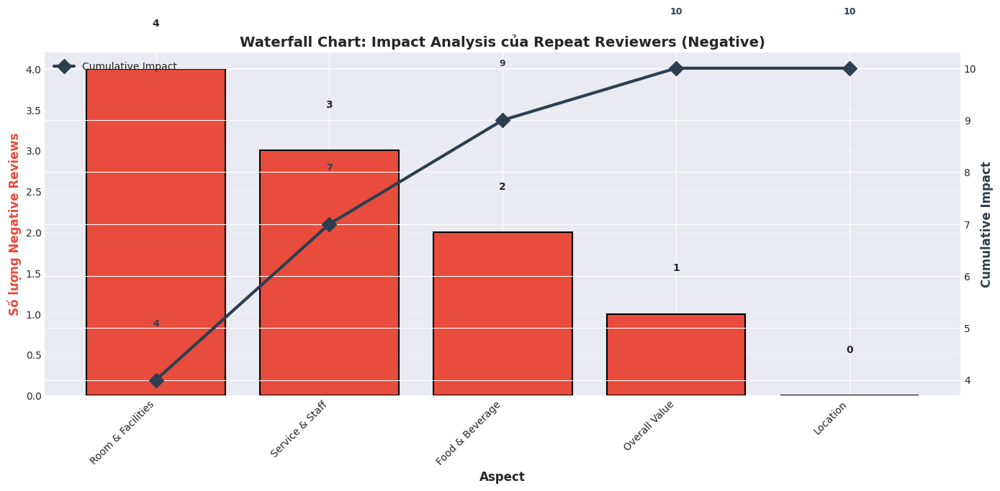

In [ ]:
# 11. BIỂU ĐỒ 8: Waterfall Chart - Impact Analysis
# ============================================
fig, ax = plt.subplots(figsize=(14, 7))

# Tính impact (số lượng negative) cho mỗi aspect từ repeat reviewers
impacts = []
for col, name in aspect_names.items():
    neg_count = (repeat_df[col] == 2).sum()
    impacts.append({'Aspect': name, 'Impact': neg_count})

impacts_df = pd.DataFrame(impacts).sort_values('Impact', ascending=False)
impacts_df['Cumulative'] = impacts_df['Impact'].cumsum()

# Vẽ waterfall
colors = ['#e74c3c' if x > 0 else '#95a5a6' for x in impacts_df['Impact']]
x_pos = range(len(impacts_df))

bars = ax.bar(x_pos, impacts_df['Impact'], color=colors, edgecolor='black', linewidth=1.5)

# Vẽ đường cumulative
ax2 = ax.twinx()
ax2.plot(x_pos, impacts_df['Cumulative'], color='#2c3e50', marker='D',
         markersize=10, linewidth=3, label='Cumulative Impact')

ax.set_xlabel('Aspect', fontsize=12, fontweight='bold')
ax.set_ylabel('Số lượng Negative Reviews', fontsize=12, fontweight='bold', color='#e74c3c')
ax2.set_ylabel('Cumulative Impact', fontsize=12, fontweight='bold', color='#2c3e50')
ax.set_title('Waterfall Chart: Impact Analysis của Repeat Reviewers (Negative)',
             fontsize=14, fontweight='bold')
ax.set_xticks(x_pos)
ax.set_xticklabels(impacts_df['Aspect'], rotation=45, ha='right')
ax.grid(axis='y', alpha=0.3)

# Thêm giá trị
for i, (bar, impact, cum) in enumerate(zip(bars, impacts_df['Impact'], impacts_df['Cumulative'])):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5,
            f'{int(impact)}', ha='center', va='bottom', fontweight='bold', fontsize=10)
    ax2.text(i, cum + 1, f'{int(cum)}', ha='center', va='bottom',
             fontweight='bold', fontsize=9, color='#2c3e50')

ax2.legend(loc='upper left', fontsize=10)
plt.tight_layout()
plt.show()

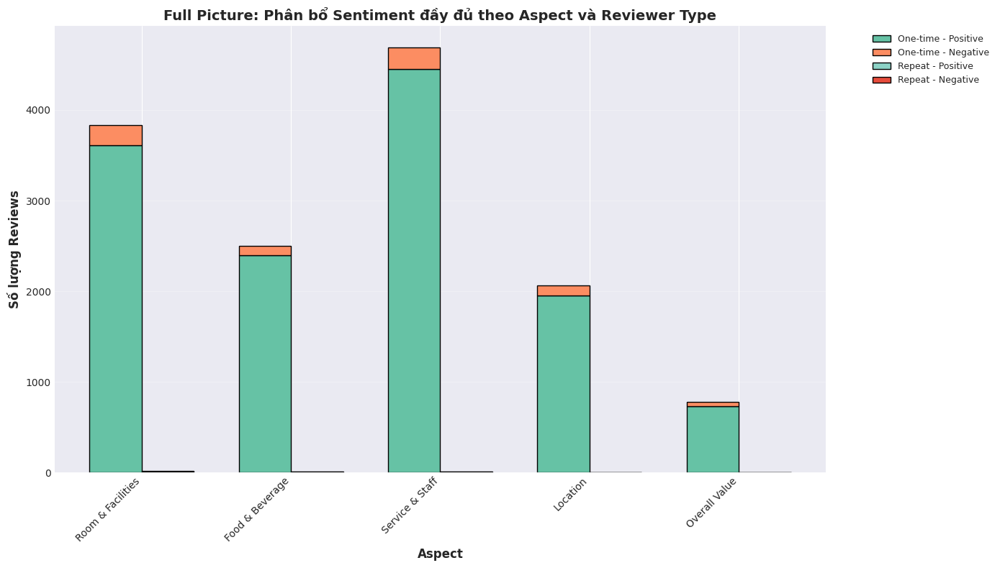


✅ Đã tạo 5 biểu đồ mới: Heatmap, Journey Map, Radar Chart, Waterfall, và Full Picture!
📊 TỔNG KẾT INSIGHTS

1️⃣ REPEAT REVIEWERS:
   - Số lượng: 10
   - Tỷ lệ: 0.2%
   - Đóng góp 21 reviews (0.2% tổng reviews)

2️⃣ TOP ISSUES CỦA REPEAT REVIEWERS:
   1. Room & Facilities: 4 negative (19.0%)
   2. Service & Staff: 3 negative (14.3%)
   3. Food & Beverage: 2 negative (9.5%)

3️⃣ SO SÁNH NEGATIVE RATE:

   Room & Facilities:
   - One-time: 5.8% negative
   - Repeat: 26.7% negative
   - Chênh lệch: +20.9%

   Food & Beverage:
   - One-time: 4.0% negative
   - Repeat: 25.0% negative
   - Chênh lệch: +21.0%

   Service & Staff:
   - One-time: 5.1% negative
   - Repeat: 25.0% negative
   - Chênh lệch: +19.9%

   Location:
   - One-time: 5.5% negative
   - Repeat: 0.0% negative
   - Chênh lệch: -5.5%

   Overall Value:
   - One-time: 5.9% negative
   - Repeat: 33.3% negative
   - Chênh lệch: +27.4%



In [ ]:
# 12. BIỂU ĐỒ 9: Sunburst-style Stacked Bar - Full Picture
# ============================================
fig, ax = plt.subplots(figsize=(14, 8))

# Chuẩn bị dữ liệu stacked
full_data = []
for reviewer_type in ['One-time', 'Repeat']:
    data = onetime_df if reviewer_type == 'One-time' else repeat_df
    for col, name in aspect_names.items():
        pos_count = (data[col] == 1).sum()
        neg_count = (data[col] == 2).sum()
        full_data.append({
            'Reviewer Type': reviewer_type,
            'Aspect': name,
            'Positive': pos_count,
            'Negative': neg_count
        })

full_df = pd.DataFrame(full_data)

# Tạo grouped stacked bar
x = np.arange(len(aspect_names.values()))
width = 0.35

for i, reviewer_type in enumerate(['One-time', 'Repeat']):
    type_data = full_df[full_df['Reviewer Type'] == reviewer_type]
    pos_vals = type_data['Positive'].values
    neg_vals = type_data['Negative'].values

    offset = width * (i - 0.5)
    color_pos = '#66c2a5' if reviewer_type == 'One-time' else '#8dd3c7'
    color_neg = '#fc8d62' if reviewer_type == 'One-time' else '#e74c3c'

    ax.bar(x + offset, pos_vals, width, label=f'{reviewer_type} - Positive',
           color=color_pos, edgecolor='black', linewidth=1)
    ax.bar(x + offset, neg_vals, width, bottom=pos_vals,
           label=f'{reviewer_type} - Negative',
           color=color_neg, edgecolor='black', linewidth=1)

ax.set_xlabel('Aspect', fontsize=12, fontweight='bold')
ax.set_ylabel('Số lượng Reviews', fontsize=12, fontweight='bold')
ax.set_title('Full Picture: Phân bổ Sentiment đầy đủ theo Aspect và Reviewer Type',
             fontsize=14, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(aspect_names.values(), rotation=45, ha='right')
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)
ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

print("\n✅ Đã tạo 5 biểu đồ mới: Heatmap, Journey Map, Radar Chart, Waterfall, và Full Picture!")
print("📊 TỔNG KẾT INSIGHTS")
print("="*60)

print(f"\n1️⃣ REPEAT REVIEWERS:")
print(f"   - Số lượng: {len(repeat_reviewer_ids)}")
print(f"   - Tỷ lệ: {len(repeat_reviewer_ids)/df['reviewerId'].nunique()*100:.1f}%")
print(f"   - Đóng góp {repeat_df.shape[0]} reviews ({repeat_df.shape[0]/len(df)*100:.1f}% tổng reviews)")

print(f"\n2️⃣ TOP ISSUES CỦA REPEAT REVIEWERS:")
for i, (aspect, count) in enumerate(sorted_issues[:3], 1):
    total_reviews = repeat_df.shape[0]
    pct = (count / total_reviews) * 100
    print(f"   {i}. {aspect}: {count} negative ({pct:.1f}%)")

print(f"\n3️⃣ SO SÁNH NEGATIVE RATE:")
for aspect in aspect_names.values():
    aspect_data = sentiment_df[sentiment_df['Aspect'] == aspect]

    onetime = aspect_data[aspect_data['Reviewer Type'] == 'One-time']
    repeat = aspect_data[aspect_data['Reviewer Type'] == 'Repeat']

    onetime_neg = onetime[onetime['Sentiment'] == 'Negative']['Count'].sum()
    onetime_total = onetime['Count'].sum()

    repeat_neg = repeat[repeat['Sentiment'] == 'Negative']['Count'].sum()
    repeat_total = repeat['Count'].sum()

    if onetime_total > 0 and repeat_total > 0:
        onetime_rate = (onetime_neg / onetime_total) * 100
        repeat_rate = (repeat_neg / repeat_total) * 100
        diff = repeat_rate - onetime_rate

        print(f"\n   {aspect}:")
        print(f"   - One-time: {onetime_rate:.1f}% negative")
        print(f"   - Repeat: {repeat_rate:.1f}% negative")
        print(f"   - Chênh lệch: {diff:+.1f}%")

print("\n" + "="*60)